In [1]:
import os
import glob
import itertools
import json
import importlib

import matplotlib as mpl
import scipy.stats as spstats
import dill as pkl
import pandas as pd
import numpy as np
import seaborn as sns
import pylab as pl


In [2]:
import py3utils as p3

In [3]:
%matplotlib notebook

# This analysis

# Source data

In [4]:
aggregate_dir = '/n/coxfs01/julianarhee/aggregate-visual-areas'

traceid = 'traces001'
response_type='dff'
responsive_test='ROC'
responsive_thr = 0.05 if responsive_test=='ROC' else 10.0
trial_epoch = 'plushalf'
overlap_thr=None
overlap_str = 'noRF' if overlap_thr in [None, 'None'] else 'overlap-%.2f' % overlap_thr

fname = 'neuraldata_%s_%s_%s-thr-%.2f_%s_%s' \
        % (traceid, response_type, responsive_test, responsive_thr, trial_epoch, overlap_str)

datafile = os.path.join(aggregate_dir, 'data-stats', 'tmp_data', '%s.pkl' % fname)
with open(datafile, 'rb') as f:
    D = pkl.load(f, encoding='latin1')
D.keys()

dict_keys(['SDF', 'CELLS', 'DATA', 'sdata', 'RFDATA'])

In [5]:
data_id = fname
print(data_id)

neuraldata_traces001_dff_ROC-thr-0.05_plushalf_noRF


# Output dir

In [7]:
#### Output dir
dst_dir = os.path.join(aggregate_dir, 'blobs-tuning', 'pca')
if not os.path.exists(dst_dir):
    os.makedirs(dst_dir)
print(dst_dir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/pca


In [8]:
#### Plotting params
visual_areas, area_colors = p3.set_threecolor_palette()
p3.set_plot_params()


# Select data, Drop repeats

In [9]:
NDATA = D['DATA']
SDF = D['SDF']
CELLS=D['CELLS']

In [26]:
# drop_repeats_by = 'most_cells'
# drop_repeats = True
# dset_str = 'drop_repeats_%s' % drop_repeats_by if drop_repeats else 'alldata'


# # Drop repeat FOVs
# min_ncells = 10

# # Select by most N cells
# unique_dsets = p3.select_best_fovs(CELLS) #, criterion='max', colname='cell')
# unique_dkeys = [(v, k) for (v, k), g in unique_dsets.groupby(['visual_area', 'datakey'])]

# excl_dsets = [] #['20190501_JC076_fov1', '20190627_JC091_fov1'] #['20190507_JC083_fov1'] #, '20190501_JC076_fov1'] #, '20190617_JC099_fov1'] #'20191018_JC113_fov1']

# passdf_drop = pd.concat([g for (v, k), g in passdf.groupby(['visual_area', 'datakey'])\
#                         if (v, k) in unique_dkeys and k not in excl_dsets])

# print("All data:")
# print(passdf[['visual_area', 'datakey']].drop_duplicates().groupby(['visual_area']).count())
# print("Drop repeats:")
# print(passdf_drop[['visual_area', 'datakey']].drop_duplicates().groupby(['visual_area']).count())


In [27]:
# pass_datakeys = [(v, k) for (v, k), g in passdf_drop.groupby(['visual_area', 'datakey'])]

# ND = pd.concat([g for (v, k), g in NDATA.groupby(['visual_area', 'datakey']) \
#                     if (v, k) in pass_datakeys])
# ND.head()

# Regression

In [10]:
import sklearn as sk
from sklearn.linear_model import Ridge, RidgeCV, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

import sklearn.metrics as skmetrics #sklearn.metrics import median_absolute_error, r2_score

In [11]:
#### Output dir
curr_dst_dir = os.path.join(dst_dir, responsive_test)
if not os.path.exists(curr_dst_dir):
    os.makedirs(curr_dst_dir)
print(curr_dst_dir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/pca/ROC


In [13]:
morphbin_lut3 = {0:0, 14:0, 27: 0, 40: 1, 53: 1, 66: 1, 79: 2, 92: 2, 106: 2, -1: -1}
morphbin_lut2 = {0:0, 14:0, 27: 1, 40: 1, 53: 2, 66: 3, 79: 3, 92: 4, 106: 4, -1: -1}
morphbin_lut = {0:0, 14:0, 27: 0, 40: 1, 53: 1, 66: 1, 79: 2, 92: 2, 106: 2, -1: -1}


#### Example FOV

In [14]:
va = 'V1'
dk = '20191006_JC110_fov1'

session, animalid, fovnum = p3.split_datakey_str(dk)
sdf = SDF[dk].copy()
sdf['morphbin'] = [morphbin_lut[m] for m in sdf['morphlevel']]

configs = sdf.index.tolist()

# Orig ndata
ndf = NDATA[(NDATA.visual_area==va) & (NDATA.datakey==dk)].copy()


In [49]:
currdata = p3.stacked_neuraldf_to_unstacked(ndf)
currdata.head()

cell,4,5,6,11,12,24,33,38,46,55,...,353,354,355,356,364,375,380,383,390,config
trial,,,,,,,,,,,,,,,,,,,,,
24,-0.046034,-0.005329,-0.001955,0.001851,-0.012159,-0.002741,0.005112,-0.013830,0.043338,0.007583,...,-0.015556,-0.005508,-0.025172,-0.006974,-0.009794,-0.017535,-0.017282,0.002768,0.043348,config001
63,-0.082488,-0.019910,-0.075611,-0.068731,0.033299,-0.033280,-0.003228,0.014408,0.033524,0.025450,...,0.010582,-0.029404,-0.007350,0.022056,-0.104572,0.022341,0.028112,0.120228,-0.026317,config001
138,0.031811,0.044985,0.030352,0.020743,-0.007031,-0.035163,0.047323,0.041964,0.037485,-0.020494,...,-0.003038,0.011856,0.056384,0.010230,0.011134,-0.011327,-0.007362,0.066241,-0.005320,config001
180,0.006868,0.012338,0.082045,0.025623,0.029986,0.040371,0.029116,0.006922,0.078197,0.048093,...,0.055076,0.039999,0.052697,-0.014638,0.020449,0.012352,-0.043094,0.039928,0.042271,config001
221,-0.010134,-0.003894,0.046274,0.000429,0.016270,0.065606,0.006456,0.024054,0.045546,-0.047626,...,-0.016745,0.031514,0.026893,0.006066,0.067221,0.005235,0.003977,-0.007618,-0.001167,config001


In [55]:
sdf.loc[currdata['config'].values]['size']

config001    10.0
config001    10.0
config001    10.0
config001    10.0
config001    10.0
             ... 
config050    50.0
config050    50.0
config050    50.0
config050    50.0
config050    50.0
Name: size, Length: 1675, dtype: float64

In [57]:
currdata['size'] = sdf.loc[currdata['config']]['size'].values
currdata['morphlevel'] = sdf.loc[currdata['config']]['morphlevel'].values
currdata['morphbin'] = sdf.loc[currdata['config']]['morphbin'].values

curr_rois = [r for r in currdata.columns if p3.isnumber(r)]

X = copy.copy(currdata[curr_rois])
y_configs = currdata['config']
y = copy.copy(currdata['size'])

print(X.shape, y.shape)

(1675, 86) (1675,)


<IPython.core.display.Javascript object>


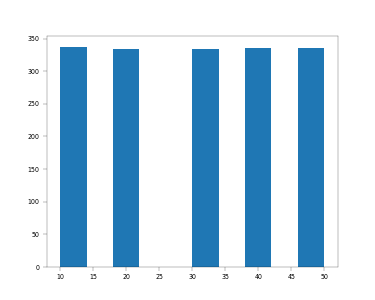

(array([337.,   0., 334.,   0.,   0., 334.,   0., 335.,   0., 335.]),
 array([10., 14., 18., 22., 26., 30., 34., 38., 42., 46., 50.]),
 <BarContainer object of 10 artists>)

In [59]:
fig, ax =pl.subplots()
ax.hist(y)
#pl.figurE

In [60]:
RANDOM_STATE=42

# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=RANDOM_STATE)

In [121]:
# Reduce dimension to 2 with PCA
# model = make_pipeline(StandardScaler(), RidgeCV(alphas=np.logspace(-10, 10, 21)))
# model.fit(X_train, y_train)
# y_pred = model.predict(X_test)

model = make_pipeline(StandardScaler(), LinearDiscriminantAnalysis(alphas=np.logspace(-10, 10, 21)))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)


<IPython.core.display.Javascript object>


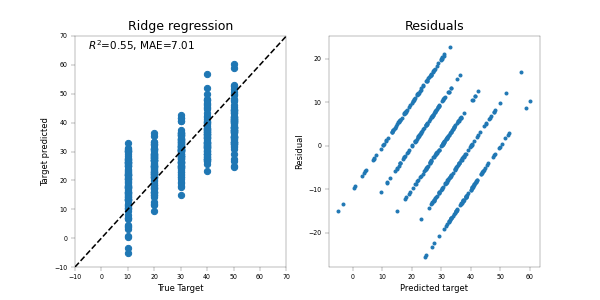

Text(0.5, 1.0, 'Residuals')

In [122]:
vmin, vmax = -10, 70

fig, axn =pl.subplots(1,2, figsize=(8,4))
ax=axn[0]
ax.scatter(y_test, y_pred)
ax.set_xlim([vmin, vmax])
ax.set_ylim([vmin, vmax])
ax.plot([vmin, vmax], [vmin, vmax], '--k')

ax.set_ylabel('Target predicted')
ax.set_xlabel('True Target')
ax.set_title('Ridge regression')
ax.text(vmin+5, vmax-5, r'$R^2$=%.2f, MAE=%.2f' % (
    skmetrics.r2_score(y_test, y_pred), skmetrics.median_absolute_error(y_test, y_pred)))

ax=axn[1]
ax.scatter(y_pred, (y_pred - y_test), s=8)
ax.set_ylabel('Residual')
ax.set_xlabel('Predicted target')
ax.set_title('Residuals')


<IPython.core.display.Javascript object>


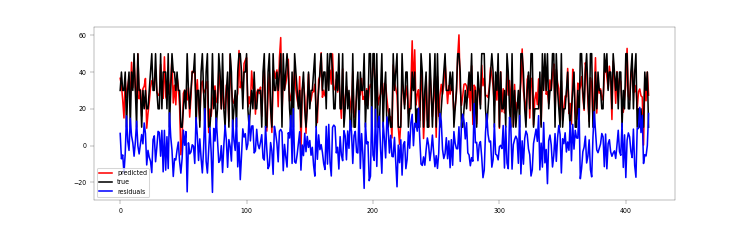

In [142]:
fig, ax =pl.subplots(figsize=(10,3))
ax.plot(y_pred, 'r', label='predicted')
ax.plot(y_test.values, 'k', label='true')

y_residuals = (y_pred - y_test)
ax.plot(y_residuals.values, 'b', label='residuals')

ax.legend()

In [144]:
np.linalg.norm(y_test - model.predict(X_test)) ** 2 

37593.82121276884

In [123]:
model.named_steps

{'standardscaler': StandardScaler(),
 'ridgecv': RidgeCV(alphas=array([1.e-10, 1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03,
        1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05,
        1.e+06, 1.e+07, 1.e+08, 1.e+09, 1.e+10]))}

In [124]:
model.named_steps

{'standardscaler': StandardScaler(),
 'ridgecv': RidgeCV(alphas=array([1.e-10, 1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03,
        1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05,
        1.e+06, 1.e+07, 1.e+08, 1.e+09, 1.e+10]))}

<IPython.core.display.Javascript object>


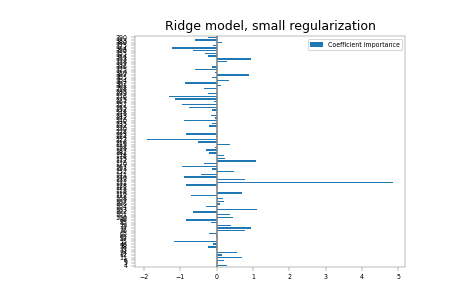

In [125]:
coefs = pd.DataFrame(
    model.named_steps['ridgecv'].coef_, # * X_train_preprocessed.std(axis=0),
    columns=['Coefficient importance'], index=curr_rois)

coefs.plot(kind='barh', figsize=(6, 4))
pl.title('Ridge model, small regularization')
pl.axvline(x=0, color='.5')
pl.subplots_adjust(left=.3)

In [126]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedKFold

cv_model = cross_validate(
    model, X, y, cv=RepeatedKFold(n_splits=5, n_repeats=5),
    return_estimator=True, n_jobs=-1)

coefs = pd.DataFrame(
    [est.named_steps['ridgecv'].coef_ #*X_train_preprocessed.std(axis=0)
     for est in cv_model['estimator']],
    columns=curr_rois)

<IPython.core.display.Javascript object>


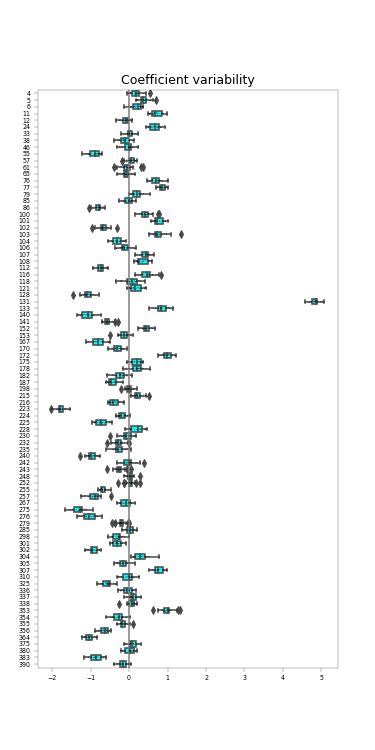

In [130]:
fig, ax =pl.subplots(figsize=(5,10))
sns.stripplot(data=coefs, orient='h', color='k', alpha=0.5, size=1, ax=ax)
sns.boxplot(data=coefs, orient='h', color='cyan', saturation=1, ax=ax)

ax.axvline(x=0, color='.5')
ax.set_title('Coefficient variability')
pl.subplots_adjust(left=.1)

# Per neuron

In [678]:
def singleneuron_regress_size(rdf, param='size'):

    # Get mean per condition
    rvec = rdf[['response', param]]

    X = rvec[[param]].copy()
    y = rvec['response'].copy()
    model = make_pipeline(StandardScaler(), LinearRegression(normalize=False))
    model.fit(X, y)
    y_pred = model.predict(X)

    y_residuals = (y - y_pred)
    #print(y_residuals.head())
    
    return pd.DataFrame(y_residuals.values, columns=['response'])


def regress_out_size_df(meandf, params=['morphlevel', 'size', 'morphbin']):
    regressed_ = meandf.groupby(['cell']).apply(singleneuron_regress_size)
    rdata = regressed_.unstack().T # config x ncells
    rdata.index = rdata.index.droplevel()
    targets = meandf[params].drop_duplicates()

    return rdata, targets

In [589]:
va = 'V1'
dk = '20191006_JC110_fov1'

session, animalid, fovnum = p3.split_datakey_str(dk)
sdf = SDF[dk].copy()
sdf['morphbin'] = [morphbin_lut[m] for m in sdf['morphlevel']]

configs = sdf.index.tolist()

# Orig ndata
ndf = NDATA[(NDATA.visual_area==va) & (NDATA.datakey==dk)].copy()

# Add stimulus info
ndf['morphlevel'] = sdf.loc[ndf['config']]['morphlevel'].values
#ndf['morphbin'] = sdf.loc[ndf['config']]['morphbin'].values
#ndf['size'] = sdf.loc[ndf['config']]['size'].values
cdata_all = ndf[ndf['morphlevel']!=-1][['cell', 'response', 'config']].copy()

meandf = cdata_all.groupby(['cell','config']).mean().reset_index()
meandf['size'] = sdf.loc[meandf['config']]['size'].values
meandf['morphlevel'] = sdf.loc[meandf['config']]['morphlevel'].values
meandf['morphbin'] = sdf.loc[meandf['config']]['morphbin'].values
meandf.head()

,cell,response,config,size,morphlevel,morphbin
0,4,0.023368,config012,20.0,14,0
1,4,0.094555,config041,10.0,92,4
2,4,0.051750,config024,40.0,40,1
3,4,0.091392,config016,10.0,27,1
4,4,0.050154,config049,40.0,106,4


In [590]:

# Current cell
rid=131
rdf = cdata_all[cdata_all['cell']==rid].copy()

# Get mean per condition
# rvec = rdf.groupby(['morphlevel', 'size']).mean().reset_index()
cdata = rdf[['response', 'size']].copy()

X = cdata[['size']].copy()
y = cdata['response'].copy()
# scaler = StandardScaler().fit(xd)
# X = scaler.transform(xd)
print(X.shape, y.shape)

(1507, 1) (1507,)


In [453]:
# # Make a train/test split using 30% test size
# X_train, X_test, y_train, y_test = train_test_split(X, y,
#                                                     test_size=0.30,
#                                                     random_state=RANDOM_STATE)

# scaler = StandardScaler().fit(X_train)
# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)


<IPython.core.display.Javascript object>


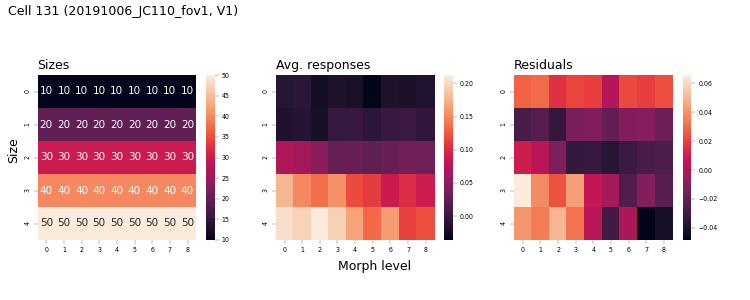

Text(0.01, 0.95, 'Cell 131 (20191006_JC110_fov1, V1)')

In [454]:
sizes_r = np.reshape(X.values, (9, 5)).T
resp_r = np.reshape(y.values, (9, 5)).T
resid_r = np.reshape(y_residuals.values, (9, 5)).T


fig, axn =pl.subplots(1,3, figsize=(10,4))

ax=axn[0]
ax.set_title('Sizes', loc='left')
sns.heatmap(sizes_r, annot=True, ax=ax, cbar=True)

ax=axn[1]
ax.set_title('Avg. responses', loc='left')
sns.heatmap(resp_r, annot=False, ax=ax)

ax=axn[2]
ax.set_title('Residuals', loc='left')
sns.heatmap(resid_r, annot=False, ax=ax)

pl.subplots_adjust(left=0.05, right=0.95, bottom=0.2, top=0.75, wspace=0.2)

fig.text(0.5, 0.1, 'Morph level', ha='center', fontsize=12)
fig.text(0.01, 0.5, 'Size', va='center', fontsize=12, rotation=90)
fig.text(0.01, 0.95, 'Cell %i (%s, %s)' % (rid, dk, va), fontsize=12)


In [455]:
# Reduce dimension to 2 with PCA
# model = make_pipeline(StandardScaler(), RidgeCV(alphas=np.logspace(-10, 10, 21)))
model = make_pipeline(StandardScaler(), LinearRegression(normalize=False))
model.fit(X, y)
y_pred = model.predict(X)

<IPython.core.display.Javascript object>


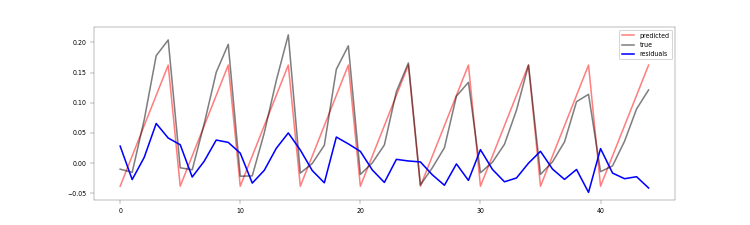

In [456]:
fig, ax =pl.subplots(figsize=(10,3))
ax.plot(y_pred, 'r', label='predicted', alpha=0.5)
ax.plot(y.values, 'k', label='true', alpha=0.5)

y_residuals = (y - y_pred)
ax.plot(y_residuals.values, 'b', label='residuals')

ax.legend()

<IPython.core.display.Javascript object>


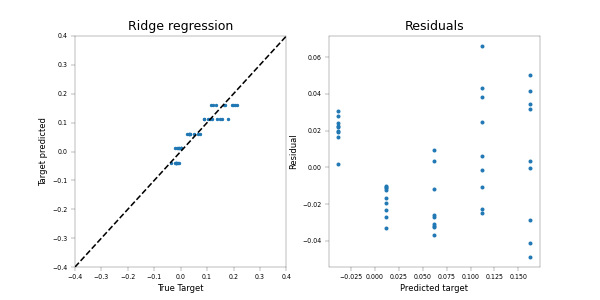

Text(0.5, 1.0, 'Residuals')

In [457]:
vmin, vmax = -.4, .4

fig, axn =pl.subplots(1,2, figsize=(8,4))
ax=axn[0]
ax.scatter(y, y_pred, s=5)
ax.set_xlim([vmin, vmax])
ax.set_ylim([vmin, vmax])
ax.plot([vmin, vmax], [vmin, vmax], '--k')

ax.set_ylabel('Target predicted')
ax.set_xlabel('True Target')
ax.set_title('Ridge regression')
ax.text(vmin+5, vmax-5, r'$R^2$=%.2f, MAE=%.2f' % (
    skmetrics.r2_score(y, y_pred), skmetrics.median_absolute_error(y, y_pred)))

ax=axn[1]
ax.scatter(y_pred, y_residuals, s=8)
ax.set_ylabel('Residual')
ax.set_xlabel('Predicted target')
ax.set_title('Residuals')


In [593]:
va = 'V1'
dk = '20191006_JC110_fov1'

session, animalid, fovnum = p3.split_datakey_str(dk)
sdf = SDF[dk].copy()
sdf['morphbin'] = [morphbin_lut[m] for m in sdf['morphlevel']]

configs = sdf.index.tolist()

# Orig ndata
ndf = NDATA[(NDATA.visual_area==va) & (NDATA.datakey==dk)].copy()


In [621]:
# Add stimulus info
ndf['morphlevel'] = sdf.loc[ndf['config']]['morphlevel'].values
#ndf['morphbin'] = sdf.loc[ndf['config']]['morphbin'].values
#ndf['size'] = sdf.loc[ndf['config']]['size'].values
cdata_all = ndf[ndf['morphlevel']!=-1].copy()

meandf = cdata_all[['cell', 'response', 'config']].copy() #groupby(['cell','config']).mean().reset_index()
meandf['size'] = sdf.loc[meandf['config']]['size'].values
meandf['morphlevel'] = sdf.loc[meandf['config']]['morphlevel'].values
meandf['morphbin'] = sdf.loc[meandf['config']]['morphbin'].values

# Current cell
rid=131
rdf = meandf[meandf['cell']==rid].copy()

# Get mean per condition
# rvec = rdf.groupby(['morphlevel', 'size']).mean().reset_index()
cdata = rdf[['response', 'config',  'morphlevel', 'size']].copy()

X = cdata[['size']].copy()
y = cdata['response'].copy()
# scaler = StandardScaler().fit(xd)
# X = scaler.transform(xd)
print(X.shape, y.shape)


# Reduce dimension to 2 with PCA
# model = make_pipeline(StandardScaler(), RidgeCV(alphas=np.logspace(-10, 10, 21)))
model = make_pipeline(StandardScaler(), LinearRegression(normalize=False))
model.fit(X, y)
y_pred = model.predict(X)

y_residuals = y-y_pred

(1507, 1) (1507,)


<IPython.core.display.Javascript object>


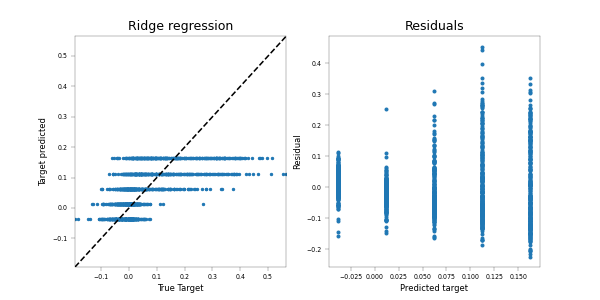

Text(0.5, 1.0, 'Residuals')

In [622]:
vmin, vmax = y.min(), y.max() #-.4, .4

fig, axn =pl.subplots(1,2, figsize=(8,4))
ax=axn[0]
ax.scatter(y, y_pred, s=5)
ax.set_xlim([vmin, vmax])
ax.set_ylim([vmin, vmax])
ax.plot([vmin, vmax], [vmin, vmax], '--k')

ax.set_ylabel('Target predicted')
ax.set_xlabel('True Target')
ax.set_title('Ridge regression')
ax.text(vmin+5, vmax-5, r'$R^2$=%.2f, MAE=%.2f' % (
    skmetrics.r2_score(y, y_pred), skmetrics.median_absolute_error(y, y_pred)))

ax=axn[1]
ax.scatter(y_pred, y_residuals, s=8)
ax.set_ylabel('Residual')
ax.set_xlabel('Predicted target')
ax.set_title('Residuals')

# PCA

In [586]:

def pcaX_to_df(X_embedded, targets, arousal=None):

    df_ = pd.DataFrame(X_embedded, columns=['pc1', 'pc2'])
    xdf = pd.concat([df_, targets], axis=1)
    if arousal is not None:
        xdf['arousal'] = arousal

    return xdf

In [587]:

# sizes = sorted(targets['size'].unique())
# morphlevels = [i for i in targets['morphlevel'].unique() if i!=-1]
# morphbins = [i for i in targets['morphbin'].unique() if i!=-1]

# n_morphlevels = len(morphlevels)
# n_sizes = len(sizes)
# n_morphbins = len(morphbins)
# print(n_morphbins)

def get_color_list(colorby, targets=None, cmap=None, n_sizes=5, n_morphlevels=9, n_morphbins=3):

    if cmap is None:
        if 'morph' in colorby:
            cmap = 'RdBu' if colorby=='morphlevel' else 'coolwarm'
        else:
            cmap = 'hsv'
    if targets is not None:
        n_colors = len(targets[colorby].unique())
    else:
        if 'morph' in colorby:
            n_colors = n_morphbins if colorby=='morphbin' else n_morphlevels
            #curr_colors = morphbin_colors if colorby=='morphbin' else morph_colors
        else:
            n_colors = n_sizes
            #curr_colors = size_colors

    curr_colors = sns.color_palette(cmap, n_colors=n_colors)
    
#     size_colors=sns.color_palette('hsv', n_colors=n_sizes)
#     morph_colors=sns.color_palette('RdBu', n_colors=n_morphlevels)
#     morphbin_colors=sns.color_palette('coolwarm', n_colors=n_morphbins)


    return curr_colors


def plot_pca_regr_v_orig(xdf, xdf_og, targets, size_cmap='hsv', morph_cmap='coolwarm', 
                         figsize=(6,6), markersize=20, alpha=1):

    fig, axn = pl.subplots(2,2, figsize=figsize, sharex=True, sharey=True)

    ax=axn[0, 0]
    ax.set_title("Regress out size", loc='left')
    colorby='size'
    curr_colors = get_color_list(colorby, cmap=size_cmap, targets=targets)

    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=curr_colors, data=xdf, ax=ax, 
                    s=markersize, alpha=alpha)
    ax.legend(bbox_to_anchor=(1,1), loc='lower right', ncol=1, title=colorby)

    ax=axn[0, 1]
    colorby='morphbin'
    curr_colors = get_color_list(colorby, cmap=morph_cmap, targets=targets)
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=curr_colors, data=xdf, ax=ax, 
                    s=markersize, alpha=alpha)
    ax.legend(bbox_to_anchor=(1,1), loc='lower right', ncol=1, title=colorby)

    # ----------------------------------------------------------
    # Original means(without regressing out SIZE)
    # ----------------------------------------------------------
    ax=axn[1, 0]
    ax.set_title("Original means", loc='left')
    colorby='size'
    curr_colors = get_color_list(colorby, cmap=size_cmap, targets=targets)
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=curr_colors, data=xdf_og, ax=ax, 
                    s=markersize, alpha=alpha)
    ax.legend_.remove()

    ax=axn[1, 1]
    colorby='morphbin'
    curr_colors = get_color_list(colorby, cmap=morph_cmap, targets=targets)
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=curr_colors, data=xdf_og, ax=ax, 
                    s=markersize, alpha=alpha)
    ax.legend_.remove()

    pl.subplots_adjust(top=0.8)

    return fig

In [650]:
cdata_r = meandf.groupby(['cell']).apply(singleneuron_regress_size)

indata = cdata_r.unstack().T # config x ncells
indata.index = indata.index.droplevel()

targets = meandf[['morphlevel', 'size', 'morphbin']] #.drop_duplicates()

In [651]:
xdata_means0 = p3.stacked_neuraldf_to_unstacked(cdata_all)
curr_rois = [m for m in xdata_means0.columns if p3.isnumber(m)]
    
xdata_means = xdata_means0[curr_rois]

# If usemeans:
# xdata_means = meandf.pivot(index=['config', 'morphlevel', 'size', 'morphbin'], columns=['cell'])

xdata_means

cell,4,5,6,11,12,24,33,38,46,55,...,338,353,354,355,356,364,375,380,383,390
trial,,,,,,,,,,,,,,,,,,,,,
46,0.032808,0.026504,0.089777,0.138704,0.074438,0.023081,0.043647,0.034621,0.071635,0.083550,...,-0.006814,0.019165,0.072208,0.052591,0.041404,0.026509,-0.014076,0.002256,0.123415,-0.016914
68,-0.040055,-0.042416,-0.046404,-0.066400,-0.046693,-0.022835,0.034929,0.000418,0.013521,-0.003710,...,0.175294,0.028432,0.020362,0.010224,0.002745,0.160999,-0.022872,0.026561,-0.023882,0.056326
111,0.113626,0.052465,-0.020937,0.012837,-0.005476,-0.017044,0.017598,0.004254,0.036794,0.029240,...,0.017571,-0.034075,0.105021,0.035065,-0.006967,0.051263,-0.009792,-0.020074,0.058377,0.017823
165,0.023098,-0.057989,-0.036950,-0.070045,0.014861,-0.053336,-0.005878,-0.012029,-0.019645,0.000515,...,0.023516,0.020378,-0.036032,-0.005026,0.017896,-0.013601,-0.020910,0.018757,0.012707,0.044019
207,0.133646,0.000077,-0.035958,0.010975,-0.024201,-0.043509,0.004526,-0.018258,0.078667,0.016497,...,0.038002,0.021412,0.000112,0.017281,0.030570,0.071041,-0.002425,0.022728,-0.010374,0.012466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,0.038246,-0.045693,0.017608,0.005759,-0.047800,0.007325,0.001874,0.003693,-0.007300,0.003140,...,0.007956,0.070143,0.024612,0.024368,-0.036087,0.034318,0.017668,-0.009628,0.002334,0.008789
1504,0.011099,0.002015,-0.006981,0.000132,0.020514,0.008890,0.022432,-0.010580,0.010073,0.014146,...,0.014629,0.047858,-0.006153,0.004079,0.021864,-0.050108,-0.003666,0.005200,0.027920,0.015966
1530,0.065233,0.142662,0.042046,0.128524,-0.010735,0.008819,-0.055607,-0.008479,0.027690,0.016465,...,-0.010569,0.077008,0.025661,0.013446,-0.029751,0.085118,-0.004979,0.035663,0.005077,0.030942


In [652]:
pca_X = indata.copy()
pca_y =  targets['size'].values

pca_X_og = xdata_means.values

In [653]:

# Reduce dimension to 2 with PCA
pca = make_pipeline(StandardScaler(),
                    PCA(n_components=2, random_state=RANDOM_STATE))

# Reduce dimension to 2 with LinearDiscriminantAnalysis
lda = make_pipeline(StandardScaler(),
                    LinearDiscriminantAnalysis(n_components=2))

# Reduce dimension to 2 with NeighborhoodComponentAnalysis
nca = make_pipeline(StandardScaler(),
                    NeighborhoodComponentsAnalysis(n_components=2,
                                                   random_state=RANDOM_STATE))

# Use a nearest neighbor classifier to evaluate the methods
knn = KNeighborsClassifier(n_neighbors=n_neighbors)


In [654]:
# Fit the method's model
pca.fit(pca_X, pca_y)

# # Fit a nearest neighbor classifier on the embedded training set
# knn.fit(pca.transform(pca_X), pca_y)

# # Compute the nearest neighbor accuracy on the embedded test set
# acc_knn = knn.score(pca.transform(pca_X), pca_y)

# Embed the data set in 2 dimensions using the fitted model
X_embedded = pca.transform(pca_X)


# ----------------------------------------------------------
# Original means(without regressing out SIZE)
# ----------------------------------------------------------
pca_og = make_pipeline(StandardScaler(),
                    PCA(n_components=2, random_state=RANDOM_STATE))
# Fit the method's model
pca_og.fit(pca_X_og, pca_y)
X_embedded_orig = pca_og.transform(pca_X_og)


# Make dataframe
xdf = pcaX_to_df(X_embedded,  targets, arousal=None)
xdf_og = pcaX_to_df(X_embedded_orig, targets, arousal=None)


<IPython.core.display.Javascript object>


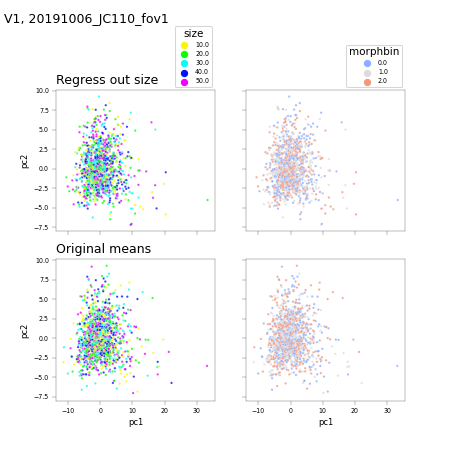

Text(0.01, 0.95, 'V1, 20191006_JC110_fov1')

In [656]:
name='PCA'

# PLOT.   
fig = plot_pca_regr_v_orig(xdf, xdf_og, targets, figsize=(6,6), markersize=5, alpha=0.8)
fig.text(0.01, 0.95, '%s, %s' % (va, dk), fontsize=12)


In [522]:
print(curr_dst_dir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/pca/ROC


In [523]:
if not os.path.exists(os.path.join(curr_dst_dir, 'by_fov')):
    os.makedirs(os.path.join(curr_dst_dir, 'by_fov'))


... skipping 20190314_JC070_fov1 (wrong cfgs)


<IPython.core.display.Javascript object>


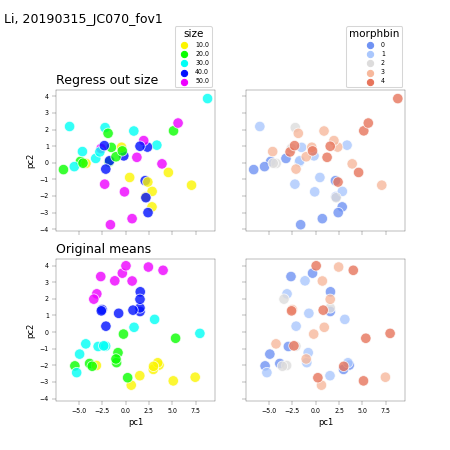

<IPython.core.display.Javascript object>


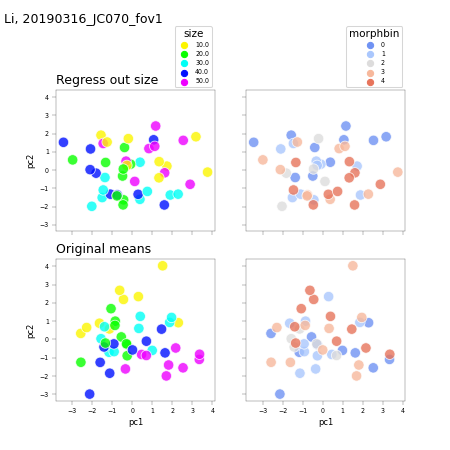

<IPython.core.display.Javascript object>


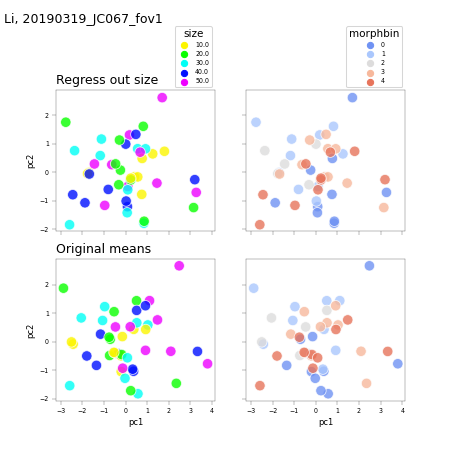

... skipping 20190320_JC067_fov1 (too few cells)
... skipping 20190321_JC070_fov1 (too few cells)


<IPython.core.display.Javascript object>


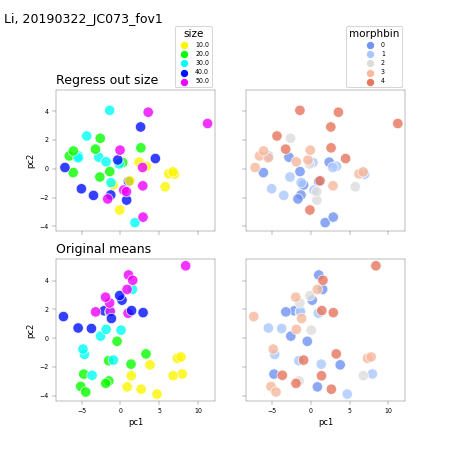

<IPython.core.display.Javascript object>


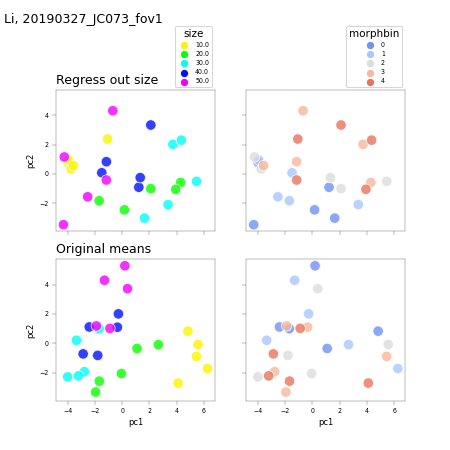

<IPython.core.display.Javascript object>


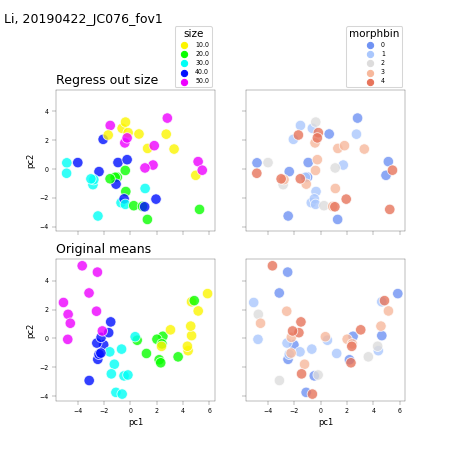

<IPython.core.display.Javascript object>


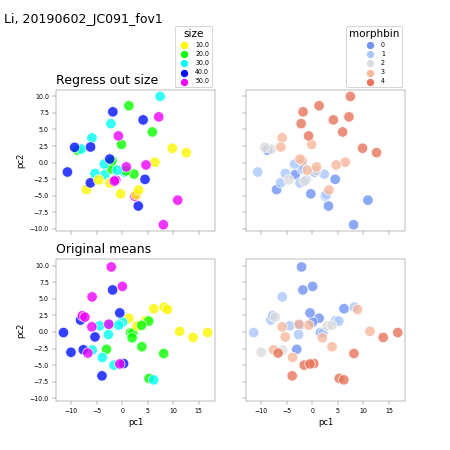

<IPython.core.display.Javascript object>


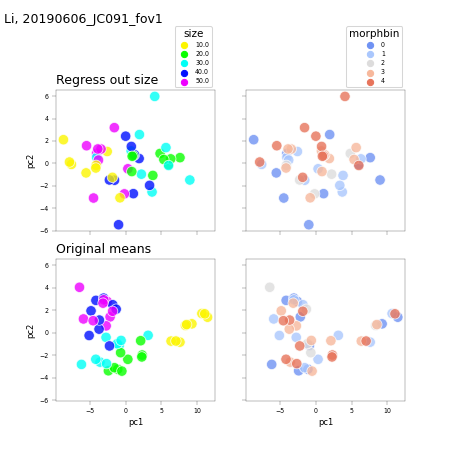

<IPython.core.display.Javascript object>


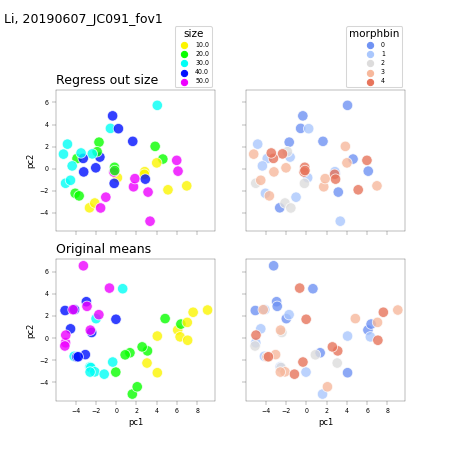

<IPython.core.display.Javascript object>


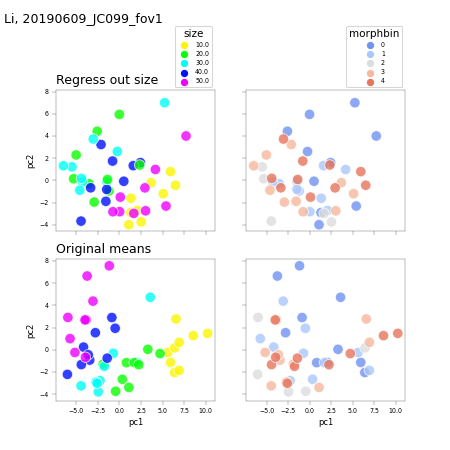

<IPython.core.display.Javascript object>


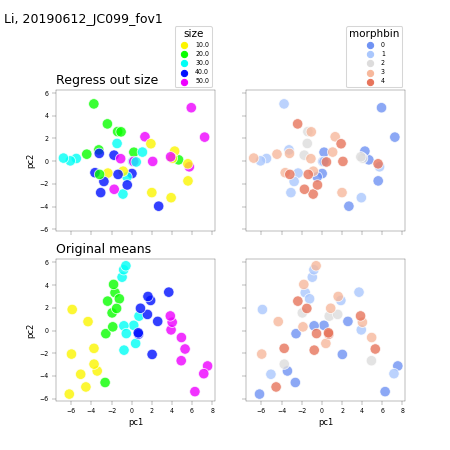

/n/coxfs01/2p-pipeline/envs/behavior3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


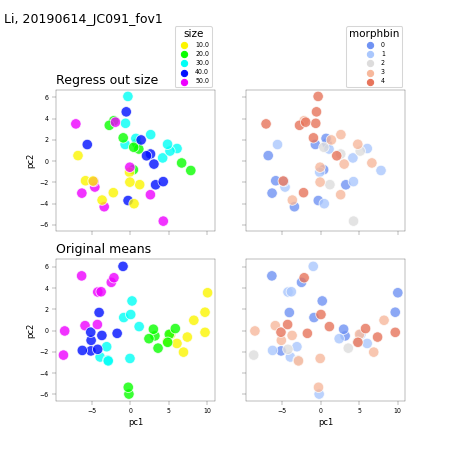

<IPython.core.display.Javascript object>


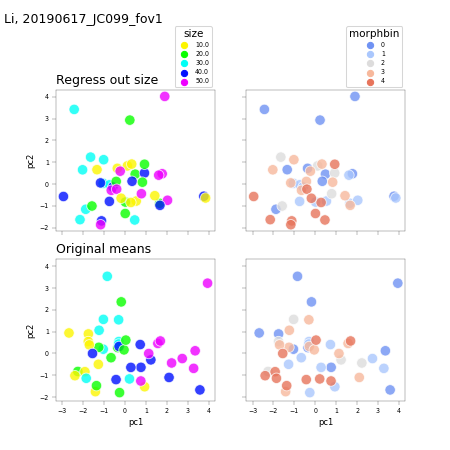

<IPython.core.display.Javascript object>


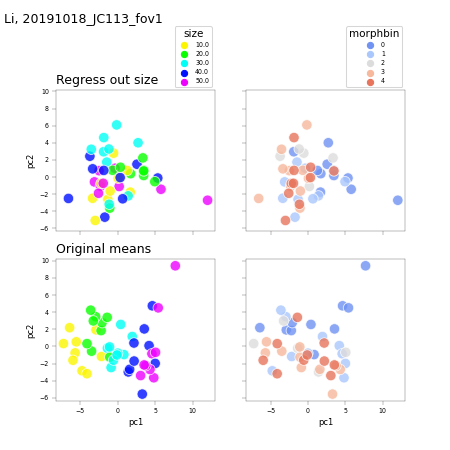

<IPython.core.display.Javascript object>


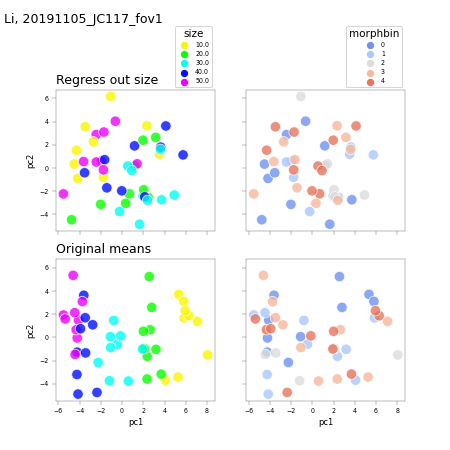

<IPython.core.display.Javascript object>


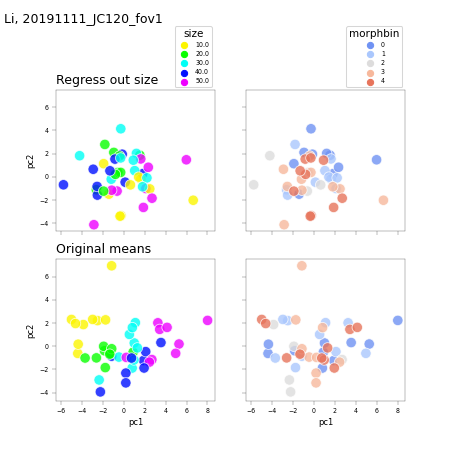

<IPython.core.display.Javascript object>


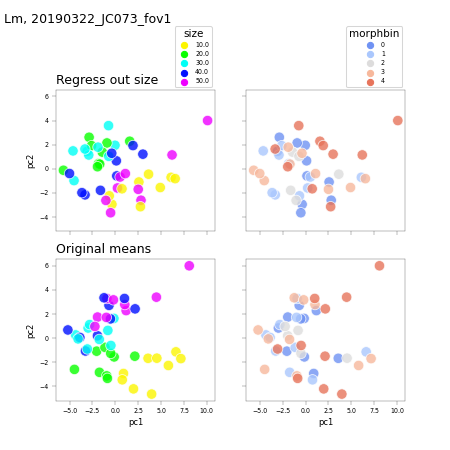

<IPython.core.display.Javascript object>


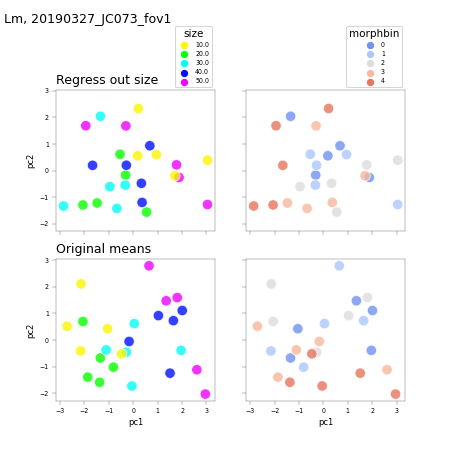

<IPython.core.display.Javascript object>


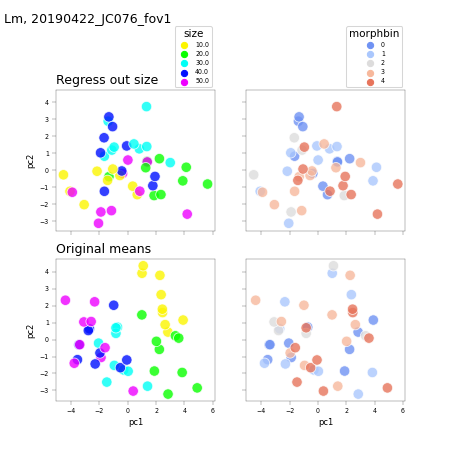

<IPython.core.display.Javascript object>


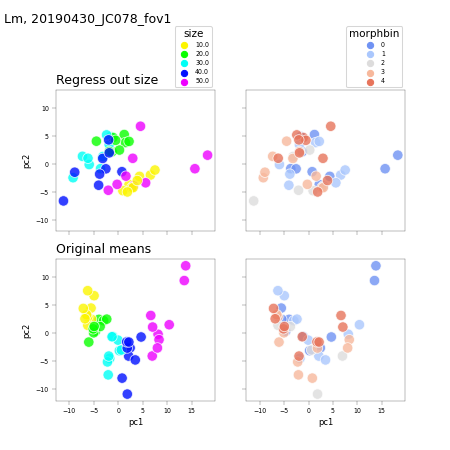

<IPython.core.display.Javascript object>


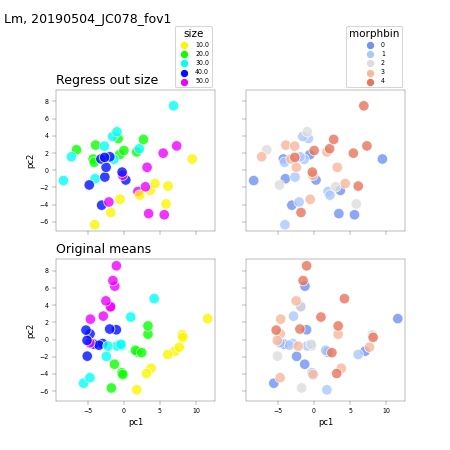

<IPython.core.display.Javascript object>


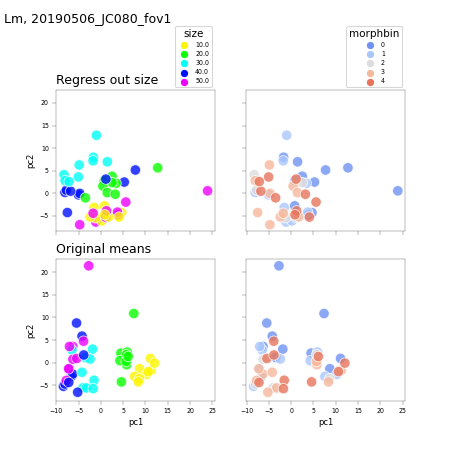

<IPython.core.display.Javascript object>


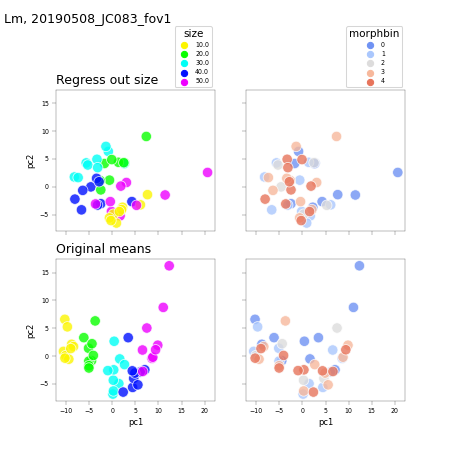

<IPython.core.display.Javascript object>


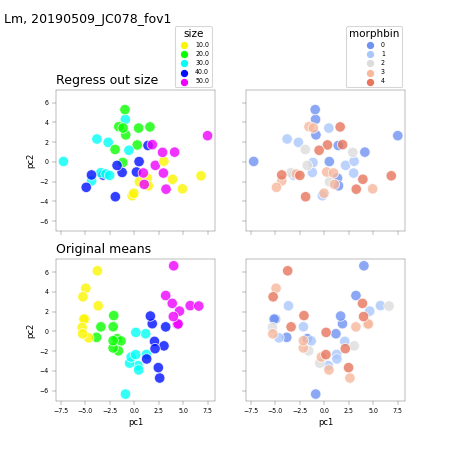

<IPython.core.display.Javascript object>


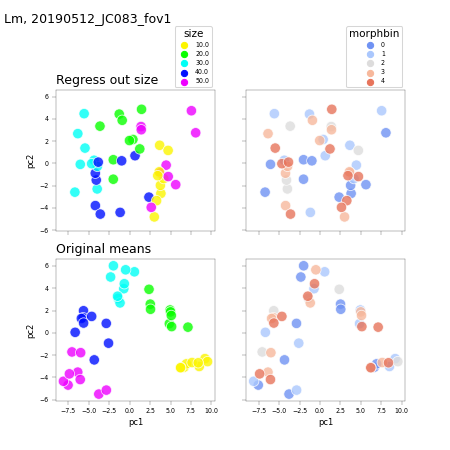

<IPython.core.display.Javascript object>


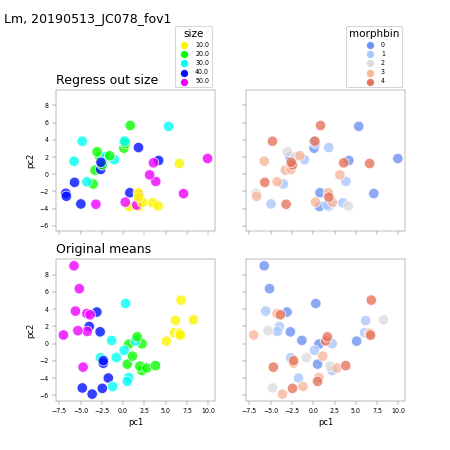

<IPython.core.display.Javascript object>


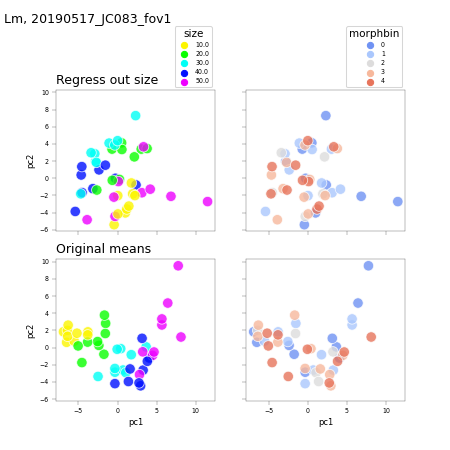

<IPython.core.display.Javascript object>


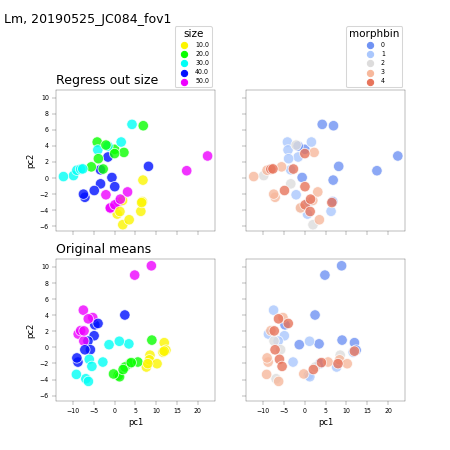

<IPython.core.display.Javascript object>


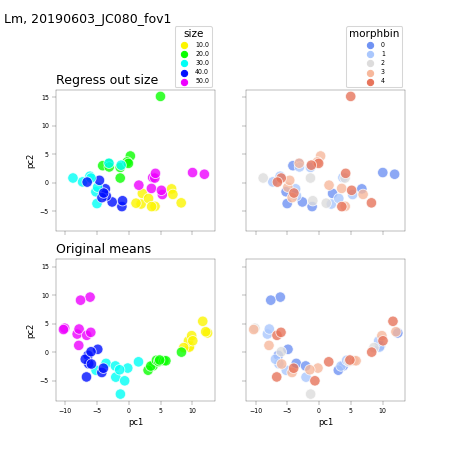

<IPython.core.display.Javascript object>


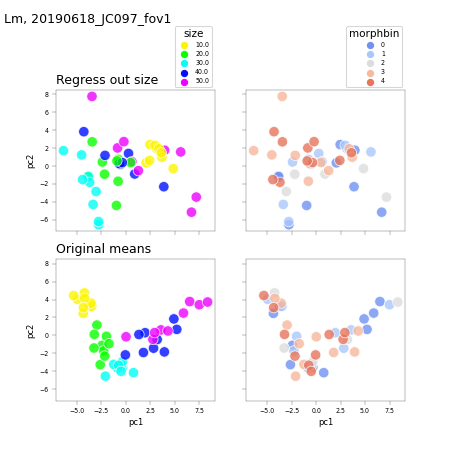

<IPython.core.display.Javascript object>


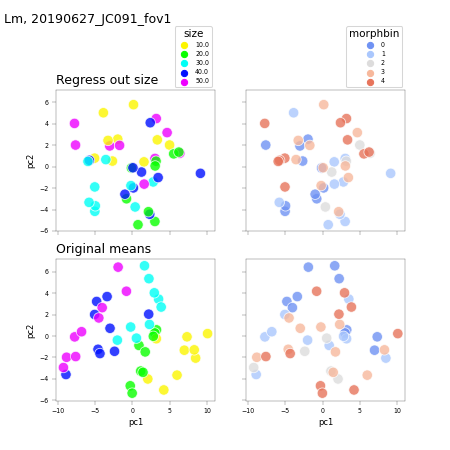

<IPython.core.display.Javascript object>


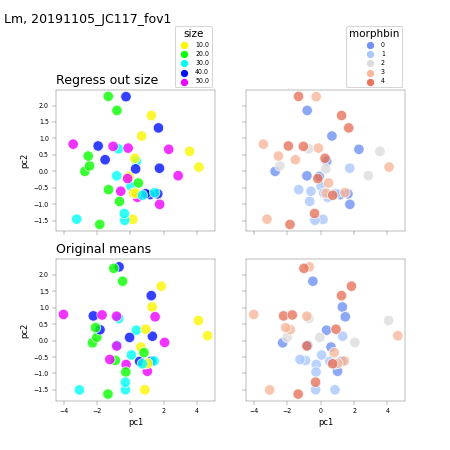

... skipping 20191111_JC120_fov1 (too few cells)


<IPython.core.display.Javascript object>


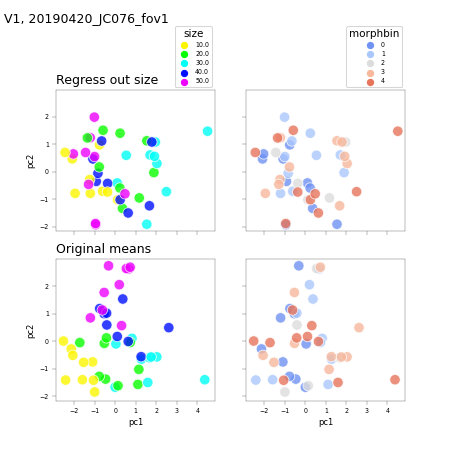

<IPython.core.display.Javascript object>


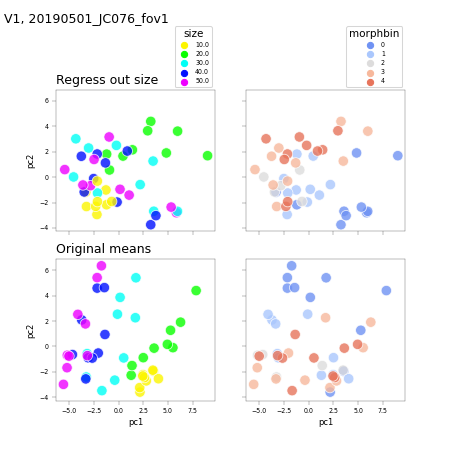

<IPython.core.display.Javascript object>


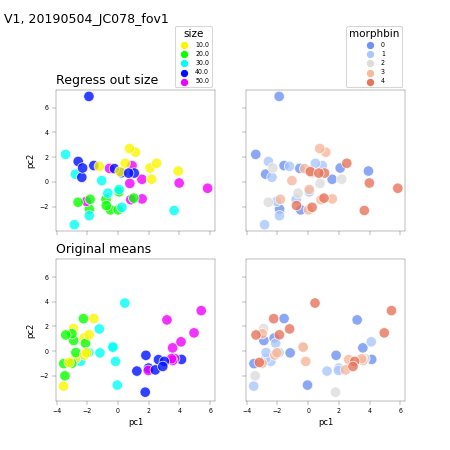

<IPython.core.display.Javascript object>


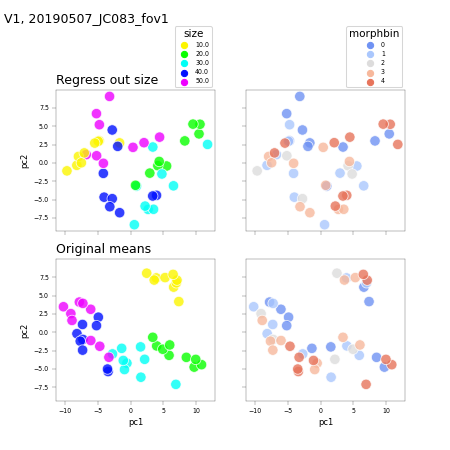

<IPython.core.display.Javascript object>


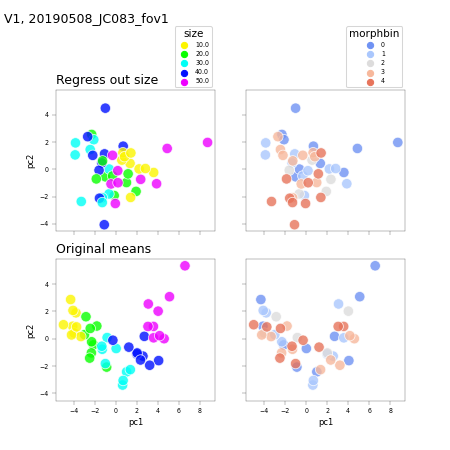

<IPython.core.display.Javascript object>


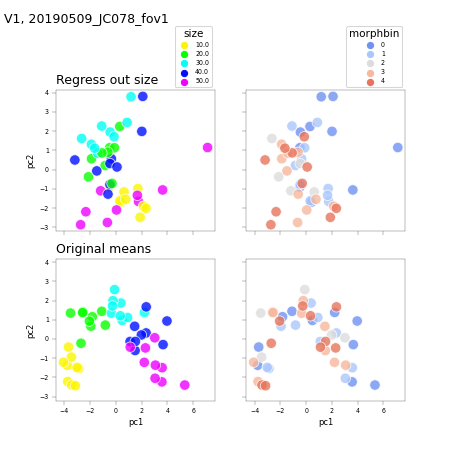

<IPython.core.display.Javascript object>


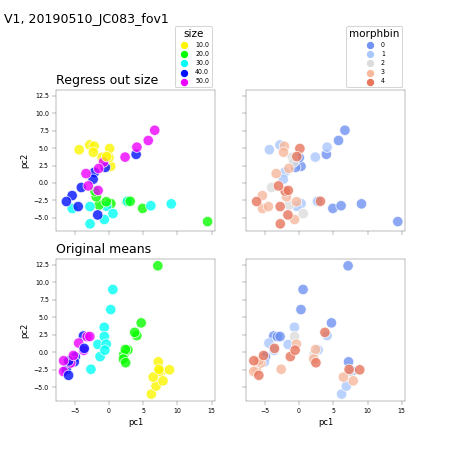

<IPython.core.display.Javascript object>


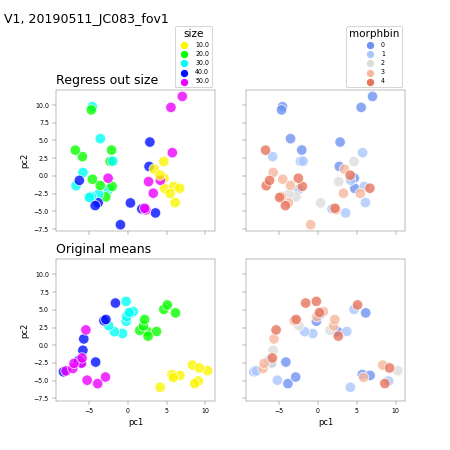

<IPython.core.display.Javascript object>


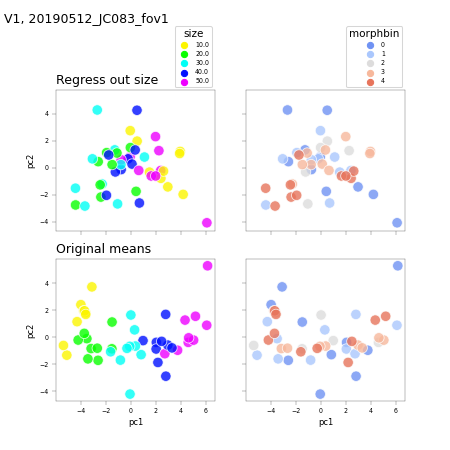

<IPython.core.display.Javascript object>


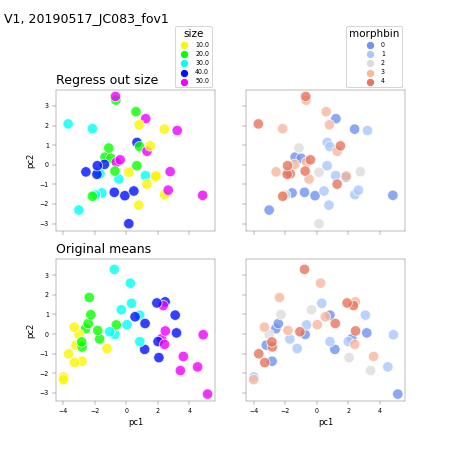

<IPython.core.display.Javascript object>


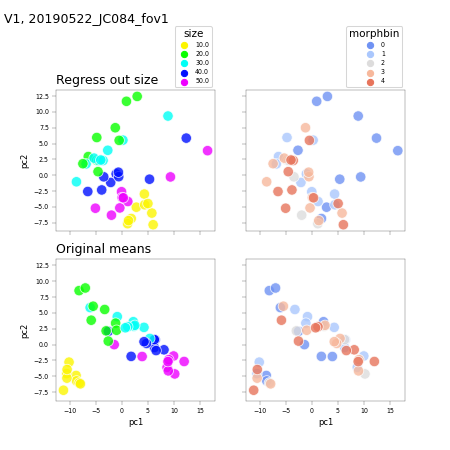

<IPython.core.display.Javascript object>


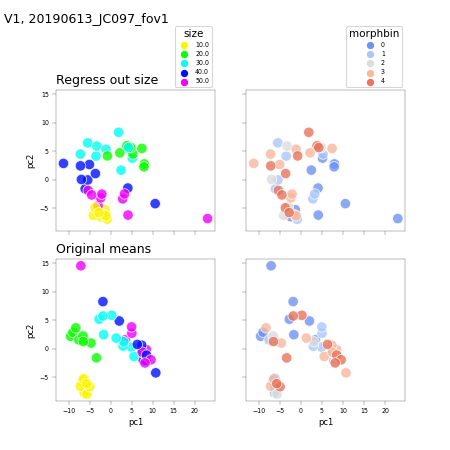

<IPython.core.display.Javascript object>


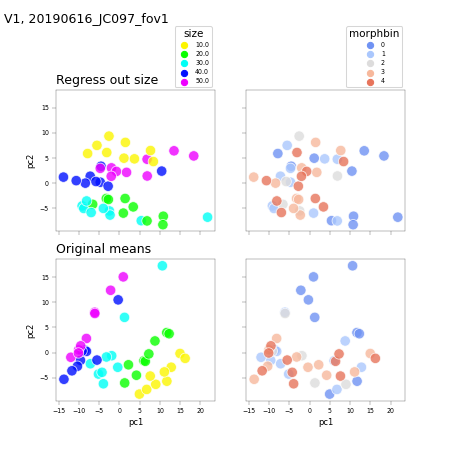

<IPython.core.display.Javascript object>


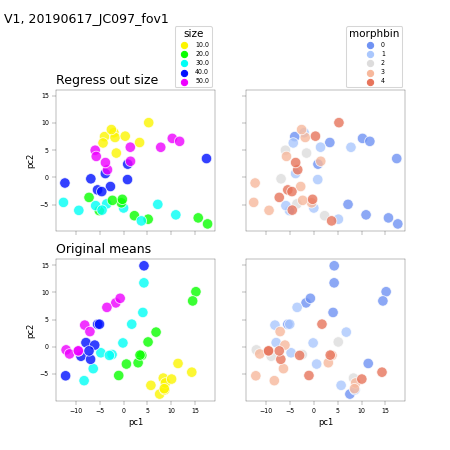

<IPython.core.display.Javascript object>


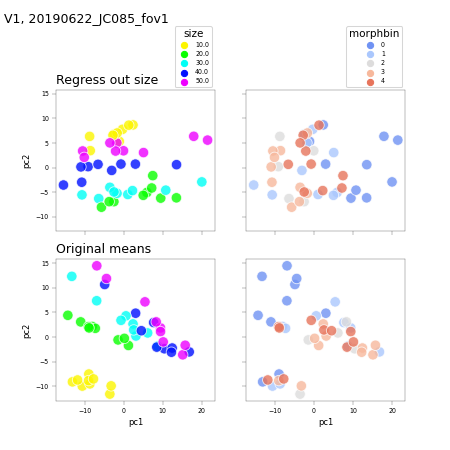

<IPython.core.display.Javascript object>


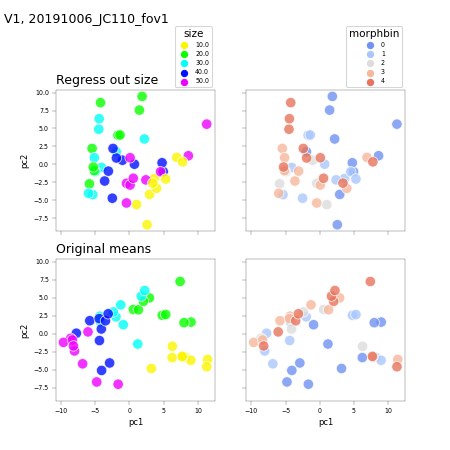

In [580]:
markersize=100
alpha=0.8
for (va, dk), nd in NDATA.groupby(['visual_area', 'datakey']):
    
    #session, animalid, fovnum = p3.split_datakey_str(dk)
    sdf = SDF[dk].copy()
    if len(sdf)>50:
        print("... skipping %s (wrong cfgs)" % dk)
        continue
    if len(nd['cell'].unique())<2:
        print("... skipping %s (too few cells)" % dk)
        continue
        
    sdf['morphbin'] = [morphbin_lut2[m] for m in sdf['morphlevel']]
    configs = sdf[sdf['morphlevel']!=-1].index.tolist()

    # Orig ndata
    ndf = nd[(nd.config.isin(configs))][['cell', 'response', 'config']].copy()

    # Get means
    meandf = ndf.groupby(['cell','config']).mean().reset_index()
    meandf['size'] = sdf.loc[meandf['config']]['size'].values
    meandf['morphlevel'] = sdf.loc[meandf['config']]['morphlevel'].values
    meandf['morphbin'] = sdf.loc[meandf['config']]['morphbin'].values

    # Regress out SIZE, then format data for PCA
    rdata, targets = regress_out_size_df(meandf, params=params)

    # Format data
    pca_X = rdata.copy()
    pca_y =  targets['size']

    # Reduce dimension to 2 with PCA
    pca = make_pipeline(StandardScaler(),
                        PCA(n_components=2, random_state=RANDOM_STATE))

    # Fit the method's model
    pca.fit(pca_X, pca_y)

    # Embed the data set in 2 dimensions using the fitted model
    X_embedded = pca.transform(pca_X)

    # Make dataframe
    xdf = pcaX_to_df(X_embedded,  targets, arousal=None)

    # ----------------------------------------------------------
    # Original means(without regressing out SIZE)
    # ----------------------------------------------------------
    # Format Original data in same way as indata
    xdata_means = meandf.pivot(index=['config', 'morphlevel', 'size', 'morphbin'], columns=['cell'])
    pca_X_og = xdata_means.values # Format data

    # Fit and embed
    pca_og = make_pipeline(StandardScaler(),
                        PCA(n_components=2, random_state=RANDOM_STATE))
    pca_og.fit(pca_X_og, pca_y) # Fit the method's model
    X_embedded_orig = pca_og.transform(pca_X_og) # Embed
    xdf_og = pcaX_to_df(X_embedded_orig, targets, arousal=None) # To dataframe

    
    # PLOT.   
    fig = plot_pca_regr_v_orig(xdf, xdf_og, targets, figsize=(6,6), markersize=markersize, alpha=alpha)
    fig.text(0.01, 0.95, '%s, %s' % (va, dk), fontsize=12)
    pl.savefig(os.path.join(curr_dst_dir, 'by_fov', 'regrSZ_v_orig_%s_%s.svg' % (va, dk)))

In [529]:
len(sdf.loc[meandf['config']]['size'].values)
    

630

# Split arousal

In [363]:
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
# from sklearn.pipeline import make_pipeline

# from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import (KNeighborsClassifier,
                               NeighborhoodComponentsAnalysis)
import copy

In [581]:
def split_high_low(in_trials, in_neural, sdf):
    curr_configs=sdf[sdf['morphlevel']!=-1].index.tolist()

    # LOW trials
    ctrials_lo = in_trials[(in_trials.arousal=='low') & (in_trials['true_labels']==True)].copy()
    curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
    currdf_lo = in_neural.loc[ctrials_lo['trial'].values].copy().drop_duplicates()

    df_lo = currdf_lo[currdf_lo.config.isin(curr_configs)].groupby(['config']).mean().reset_index()
    X_lo = df_lo[curr_rois].reset_index(drop=True)
    y_lo = df_lo['config'].reset_index(drop=True)

    
    # HIGH trials
    ctrials_hi = in_trials[(in_trials.arousal=='high') & (in_trials['true_labels']==True)].copy()
    curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
    currdf_hi = in_neural.loc[ctrials_hi['trial'].values].copy().drop_duplicates()

    df_hi = currdf_hi[currdf_hi.config.isin(curr_configs)].groupby(['config']).mean().reset_index()
    X_hi = df_hi[curr_rois].reset_index(drop=True)
    y_hi = df_hi['config'].reset_index(drop=True)
    
    return X_lo, y_lo, X_hi, y_hi


In [729]:

def plot_pca_high_low(df_, targets, figsize=(8,6), morph_cmap='coolwarm', size_cmap='hsv', markersize=50):

    fig, axn = pl.subplots(2,2, sharex=True, sharey=True, figsize=figsize)

    # -------------------------------------------------------
    # Size, high v low
    # -------------------------------------------------------
    colorby='size'
    size_colors = get_color_list(colorby, targets=targets, cmap=size_cmap)

    ax=axn[0, 0]
    ax.set_title('high')
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=size_colors, data=df_[df_.arousal=='high'], ax=ax,
            style='arousal',s=markersize)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

    ax=axn[1, 0]
    ax.set_title('low')
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=size_colors, data=df_[df_.arousal=='low'], ax=ax,
            style='arousal', s=markersize)
    ax.legend_.remove()


    # -------------------------------------------------------
    # Size, high v low
    # -------------------------------------------------------
    colorby='morphbin'
    morph_colors = get_color_list(colorby, targets=targets, cmap=morph_cmap)

    ax=axn[0, 1]
    ax.set_title('high')
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=morph_colors, data=df_[df_.arousal=='high'], ax=ax,
                    style='arousal', s=markersize)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

    ax=axn[1,1]
    ax.set_title('low')
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=morph_colors, data=df_[df_.arousal=='low'], ax=ax,
                    style='arousal', s=markersize)
    ax.legend_.remove()

    
    pl.subplots_adjust(left=0.1, right=0.85, bottom=0.1, top=0.85, wspace=0.3, hspace=0.3)

    return fig

## Load split_pupil, by_fov results

In [582]:
trial_epoch = 'plushalf'
overlap_thr=None
C_value=None
response_type='dff'
responsive_test='ROC'


In [715]:
params = ['morphlevel', 'size', 'morphbin']
markersize=50
size_cmap = 'hsv'
morph_cmap = 'coolwarm'


va = 'V1'
dk = '20190509_JC078_fov1' #'20191006_JC110_fov1'


session, animalid, fovnum = p3.split_datakey_str(dk)
sdf = SDF[dk].copy()
sdf['morphbin'] = [morphbin_lut3[m] for m in sdf['morphlevel']]
configs = sdf[sdf['morphlevel']!=-1].index.tolist()
    
# Load split_pupil input
curr_id = p3.decode_analysis_id(visual_area=va, prefix='split_pupil', response_type=response_type, 
                    responsive_test=responsive_test, overlap_thr=overlap_thr, trial_epoch=trial_epoch)
res = p3.load_split_pupil_input(animalid, session, fovnum, curr_id=curr_id, traceid=traceid)
if res is None:
    print("--- no results: %s, %s" % (va, dk))

# Group by iteration
in_trials = res['input_trials'].copy()
in_neural = res['neuraldf'].copy()
in_pupil = res['pupildf'].copy()

# Orig ndata
curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
#print(len(curr_rois))
ndf = NDATA[(NDATA.visual_area==va) & (NDATA.datakey==dk) & (NDATA.config.isin(configs))
               & (NDATA['cell'].isin(curr_rois))].copy()


In [716]:
X_lo, y_lo, X_hi, y_hi = split_high_low(in_trials, in_neural, sdf) # Nconfigs c Ncells
for par in params:
    X_lo[par] = sdf.loc[configs][par].values
    X_hi[par] = sdf.loc[configs][par].values

# Stack df for regression func
ndf_lo = pd.melt(X_lo, id_vars=params, var_name='cell', value_name='response')
ndf_hi = pd.melt(X_hi, id_vars=params, var_name='cell', value_name='response')

# Regress out SIZE, then format data for PCA
rdata_lo, targets_lo = regress_out_size_df(ndf_lo) #, params=params)
rdata_hi, targets_hi = regress_out_size_df(ndf_hi) #, params=params)

((45, 12), (45, 12))

In [720]:
# Format data
pca_X = rdata_lo.copy()
pca_y =  targets_lo['size']

# Reduce dimension to 2 with PCA
pca = make_pipeline(StandardScaler(), PCA(n_components=2, random_state=RANDOM_STATE))

# Fit the method's model
pca.fit(pca_X, pca_y)

# Embed the data set in 2 dimensions using the fitted model
X_embedded = pca.transform(pca_X)

# Make dataframe
xdf = pcaX_to_df(X_embedded, targets_lo, arousal='low')

# ----------------------------------------------------------
# Original means(without regressing out SIZE)
# ----------------------------------------------------------
pca_X_alt = rdata_hi.copy()
X_embedded2 = pca.transform(pca_X_alt)
# Make dataframe
xdf2 = pcaX_to_df(X_embedded2, targets_hi, arousal='high')

# Combine
df_ = pd.concat([xdf, xdf2], axis=0)


,pc1,pc2,morphlevel,size,morphbin,arousal
0,-0.704594,-1.611432,0,10.0,0,low
1,0.098615,3.174208,0,20.0,0,low
2,0.809006,0.839456,0,30.0,0,low
3,2.038748,0.890020,0,40.0,0,low
4,6.433744,-1.202531,0,50.0,0,low


<IPython.core.display.Javascript object>


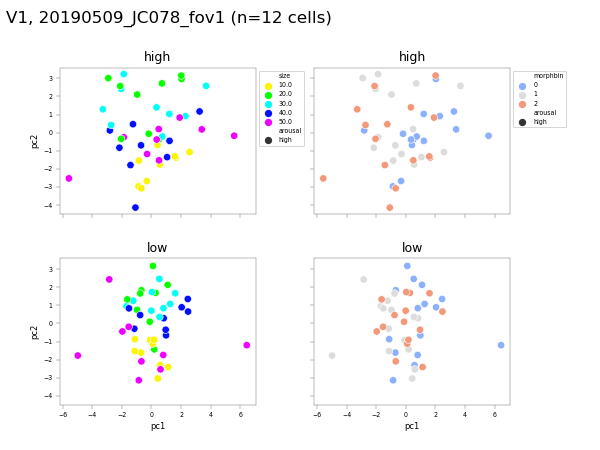

In [730]:
markersize = 50

fig = plot_pca_high_low(df_, targets_lo, figsize=(8,6), morph_cmap=morph_cmap, 
                  size_cmap=size_cmap, markersize=markersize)
ncells=len(curr_rois) #.shape[1]
fig.text(0.01, 0.95, '%s, %s (n=%i cells)' % ( va, dk, ncells), fontsize=16)
figname = 'regrSZ_splitpupil__%s_%s' % (va, dk)

pl.savefig(os.path.join(curr_dst_dir, 'by_fov_split_pupil', '%s.svg' % figname) )



In [704]:

if not os.path.exists( os.path.join(curr_dst_dir, 'by_fov_split_pupil') ):
    os.makedirs(os.path.join(curr_dst_dir, 'by_fov_split_pupil') )
print(os.path.join(curr_dst_dir, 'by_fov_split_pupil') )




/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/pca/ROC/by_fov_split_pupil


... wrong results: 20190314_JC070_fov1 (Li)
--- no results: Li, 20190315_JC070_fov1


Traceback (most recent call last):
  File "/net/coxfs01/srv/export/coxfs01/share_root/2p-pipeline/repos/2p-pipeline/pipeline/python/classifications/notebooks/response_stats/py3utils.py", line 43, in load_split_pupil_input
    assert len(curr_inputfiles)==1, "More than 1 input file: %s" % str(curr_inputfiles)
AssertionError: More than 1 input file: []


<IPython.core.display.Javascript object>


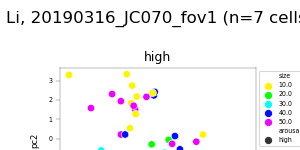

... wrong results: 20190319_JC067_fov1 (Li)
... too few cells: 20190320_JC067_fov1 (Li)
... too few cells: 20190321_JC070_fov1 (Li)


<IPython.core.display.Javascript object>


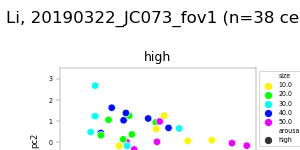

... wrong results: 20190327_JC073_fov1 (Li)


<IPython.core.display.Javascript object>


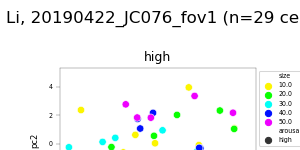

*** missing configs after low/hi split! (Li, 20190602_JC091_fov1)


<IPython.core.display.Javascript object>


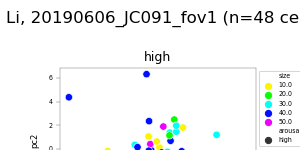

<IPython.core.display.Javascript object>


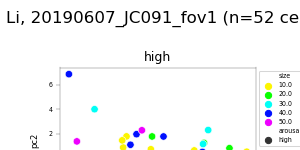

<IPython.core.display.Javascript object>


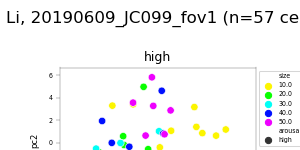

<IPython.core.display.Javascript object>


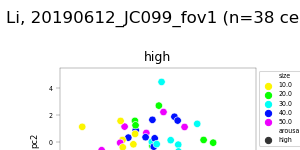

<IPython.core.display.Javascript object>


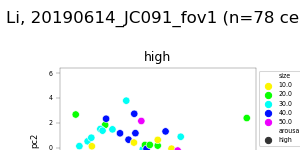

<IPython.core.display.Javascript object>


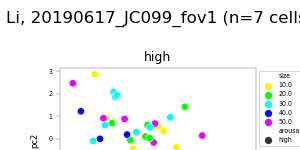

... wrong results: 20191018_JC113_fov1 (Li)


<IPython.core.display.Javascript object>


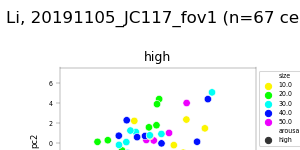

<IPython.core.display.Javascript object>


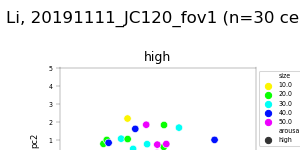

<IPython.core.display.Javascript object>


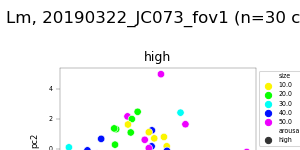

<IPython.core.display.Javascript object>


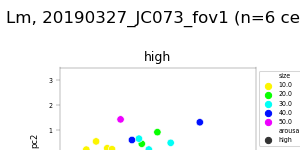

<IPython.core.display.Javascript object>


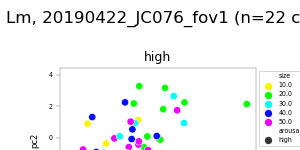

<IPython.core.display.Javascript object>


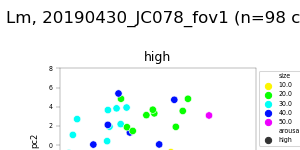

<IPython.core.display.Javascript object>


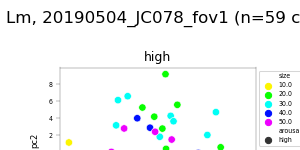

<IPython.core.display.Javascript object>


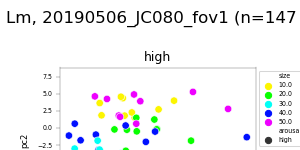

<IPython.core.display.Javascript object>


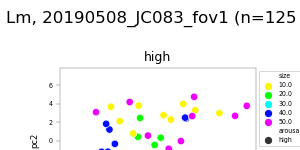

<IPython.core.display.Javascript object>


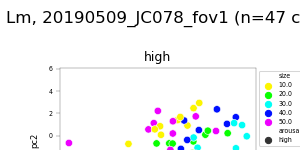

<IPython.core.display.Javascript object>


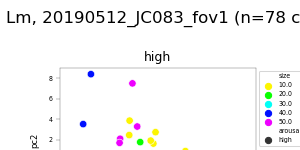

<IPython.core.display.Javascript object>


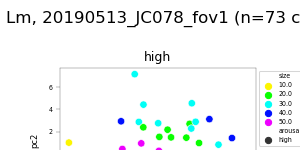

<IPython.core.display.Javascript object>


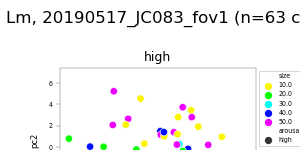

<IPython.core.display.Javascript object>


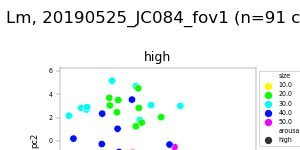

<IPython.core.display.Javascript object>


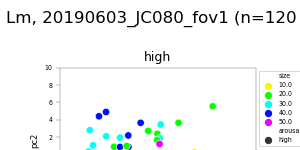

<IPython.core.display.Javascript object>


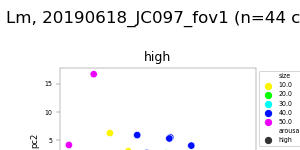

<IPython.core.display.Javascript object>


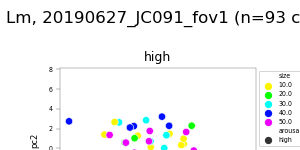

<IPython.core.display.Javascript object>


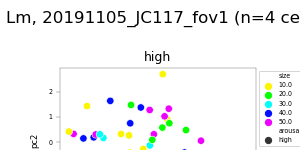

... too few cells: 20191111_JC120_fov1 (Lm)


<IPython.core.display.Javascript object>


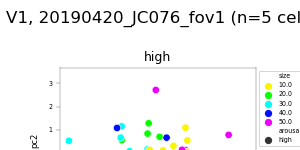

<IPython.core.display.Javascript object>


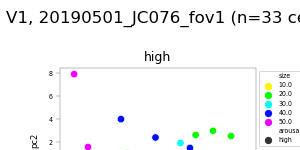

<IPython.core.display.Javascript object>


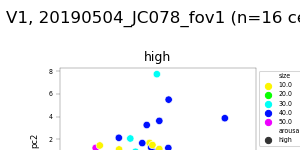

<IPython.core.display.Javascript object>


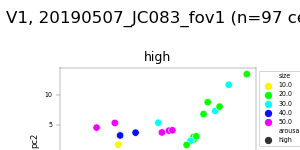

<IPython.core.display.Javascript object>


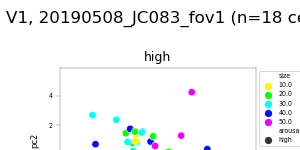

<IPython.core.display.Javascript object>


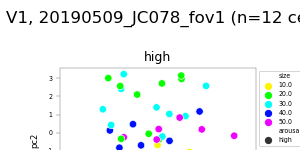

*** missing configs after low/hi split! (V1, 20190510_JC083_fov1)


<IPython.core.display.Javascript object>


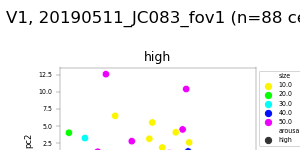

<IPython.core.display.Javascript object>


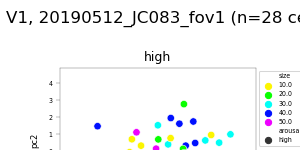

<IPython.core.display.Javascript object>


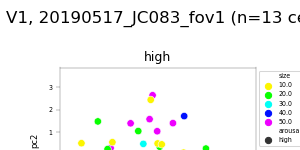

<IPython.core.display.Javascript object>


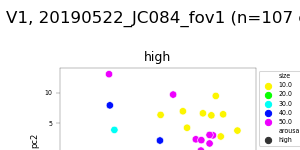

<IPython.core.display.Javascript object>


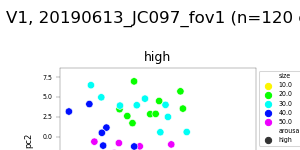

<IPython.core.display.Javascript object>


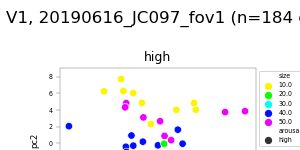

<IPython.core.display.Javascript object>


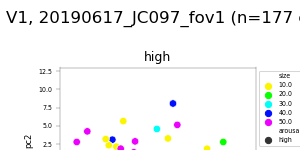

<IPython.core.display.Javascript object>


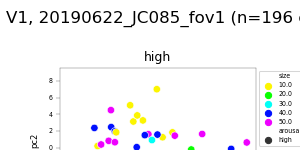

<IPython.core.display.Javascript object>


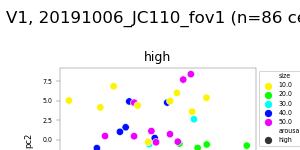

In [746]:

for (va, dk), nd in NDATA.groupby(['visual_area', 'datakey']):
    session, animalid, fovnum = p3.split_datakey_str(dk)
    sdf = SDF[dk].copy()
    sdf['morphbin'] = [morphbin_lut3[m] for m in sdf['morphlevel']]
    configs = sdf[sdf['morphlevel']!=-1].index.tolist()

    # Load split_pupil input
    curr_id = p3.decode_analysis_id(visual_area=va, prefix='split_pupil', response_type=response_type, 
                        responsive_test=responsive_test, overlap_thr=overlap_thr, trial_epoch=trial_epoch)
    res = p3.load_split_pupil_input(animalid, session, fovnum, curr_id=curr_id, traceid=traceid)
    if res is None:
        print("--- no results: %s, %s" % (va, dk))
        continue
    if 'input_trials' not in res.keys():
        print("... wrong results: %s (%s)" % (dk, va))
        continue
        
    # Group by iteration
    in_trials = res['input_trials'].copy()
    in_neural = res['neuraldf'].copy()
    in_pupil = res['pupildf'].copy()

    # Orig ndata
    curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
    # ndf = nd[(nd.config.isin(configs)) & (nd['cell'].isin(curr_rois))].copy()
    if len(curr_rois) < 2:
        print("... too few cells: %s (%s)" % (dk, va))
        continue
        
    # Split high/low
    X_lo, y_lo, X_hi, y_hi = split_high_low(in_trials, in_neural, sdf) # Nconfigs c Ncells
    if X_lo.shape[0] != len(configs) or X_hi.shape[0]!=len(configs):
        print("*** missing configs after low/hi split! (%s, %s)" % (va, dk))
        continue
        
    for par in params:
        X_lo[par] = sdf.loc[configs][par].values
        X_hi[par] = sdf.loc[configs][par].values

    # Stack df for regression func
    ndf_lo = pd.melt(X_lo, id_vars=params, var_name='cell', value_name='response')
    ndf_hi = pd.melt(X_hi, id_vars=params, var_name='cell', value_name='response')

    # Regress out SIZE, then format data for PCA
    rdata_lo, targets_lo = regress_out_size_df(ndf_lo) #, params=params)
    rdata_hi, targets_hi = regress_out_size_df(ndf_hi) #, params=params)

    # Format data
    pca_X = rdata_lo.copy()
    pca_y =  targets_lo['size']

    # Reduce dimension to 2 with PCA
    pca = make_pipeline(StandardScaler(), PCA(n_components=2, random_state=RANDOM_STATE))

    # Fit the method's model
    pca.fit(pca_X, pca_y)

    # Embed the data set in 2 dimensions using the fitted model
    X_embedded = pca.transform(pca_X)

    # Make dataframe
    xdf = pcaX_to_df(X_embedded, targets_lo, arousal='low')

    # ----------------------------------------------------------
    # Original means(without regressing out SIZE)
    # ----------------------------------------------------------
    pca_X_alt = rdata_hi.copy()
    X_embedded2 = pca.transform(pca_X_alt)
    # Make dataframe
    xdf2 = pcaX_to_df(X_embedded2, targets_hi, arousal='high')

    # Combine
    df_ = pd.concat([xdf, xdf2], axis=0)

    # Plot
    fig = plot_pca_high_low(df_, targets_lo, figsize=(8,6), morph_cmap=morph_cmap, 
                      size_cmap=size_cmap, markersize=markersize)
    ncells=len(curr_rois) #.shape[1]
    fig.text(0.01, 0.95, '%s, %s (n=%i cells)' % ( va, dk, ncells), fontsize=16)
    figname = 'regrSZ_splitpupil__%s_%s' % (va, dk)

    pl.savefig(os.path.join(curr_dst_dir, 'by_fov_split_pupil', '%s.svg' % figname) )



In [ ]:

# # Get means
# meandf = ndf.groupby(['cell','config']).mean().reset_index()
# meandf['size'] = sdf.loc[meandf['config']]['size'].values
# meandf['morphlevel'] = sdf.loc[meandf['config']]['morphlevel'].values
# meandf['morphbin'] = sdf.loc[meandf['config']]['morphbin'].values

# # Regress out SIZE, then format data for PCA
# rdata, targets = regress_out_size_df(meandf, params=params)


In [741]:
va, dk

('V1', '20190510_JC083_fov1')

In [745]:
X_lo.shape[0],X_hi.shape[0]

(44, 44)

# Output params

In [899]:
curr_dst_dir = os.path.join(dst_dir, 'split_pupil', 'pca')
if not os.path.exists(curr_dst_dir):
    os.makedirs(curr_dst_dir)
print(curr_dst_dir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/selectivity_tolerance/ROC/split_pupil/pca


In [30]:
arousal_colors = {'high': 'm', 'low': 'c'}
dashes=['', (1, 1)]
#markers={True:'o', False:'o'}
#parnames = ['threshold', 'width', 'thr', 'slope', 'lambda', 'eta']

##### Test 1

In [880]:
va='V1'
# dk = '20191006_JC110_fov1'
dk = '20190616_JC097_fov1'

In [881]:
in_trials=None; in_neural=None;
session, animalid, fovnum = p3.split_datakey_str(dk)
sdf = SDF[dk].copy()
configs = sdf.index.tolist()

# Load split_pupil input
curr_id = p3.decode_analysis_id(visual_area=va, prefix='split_pupil', response_type=response_type, 
                    responsive_test=responsive_test, overlap_thr=overlap_thr, trial_epoch=trial_epoch)
res = p3.load_split_pupil_input(animalid, session, fovnum, curr_id=curr_id, traceid=traceid)


# Group by iteration
in_trials = res['input_trials'].copy()
in_neural = res['neuraldf'].copy()
curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
ndf = nd[(nd['cell'].isin(curr_rois))].copy()
ndf['response'] = ndf['response'] - ndf.groupby(['cell'])['response'].transform('min')


In [883]:
# # for (arous_, shuff_), ctrials in in_trials.groupby(['arousal', 'true_labels']):
# arous_='high'
# shuff_=True
# ctrials = in_trials[(in_trials.arousal=='high') & (in_trials['true_labels']==shuff_)].copy()
# ctrials

In [884]:
# xd = ndf[ndf['trial'].isin(ctrials['trial'].values)].copy().drop_duplicates()
# xd['arousal'] = arous_
# xd['true_labels']= shuff_

In [888]:

X_lo, y_lo, X_hi, y_hi = split_high_low(in_trials, in_neural, sdf)
X_lo.shape, X_hi.shape
RANDOM_STATE = 42


X = copy.copy(X_lo)
y = copy.copy(y_lo)

y_sz = [sdf['size'][c] for c in y]
y_mp = [sdf['morphlevel'][c] for c in y]


# ALT 
X2 = copy.copy(X_hi)
y2 = copy.copy(y_hi)
y_sz_2 = [sdf['size'][c] for c in y2]
y_mp_2 = [sdf['morphlevel'][c] for c in y2]


# Make a train/test split using 30% test size
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.30,
                                                    random_state=RANDOM_STATE)

#X_std = preprocessing.StandardScaler().fit(X_train)

y_train_sz = [sdf['size'][c] for c in y_train]
y_train_mp = [sdf['morphlevel'][c] for c in y_train]

y_test_sz = [sdf['size'][c] for c in y_test]
y_test_mp = [sdf['morphlevel'][c] for c in y_test]


In [382]:
n_neighbors = 3
dim = len(y)

n_classes = len(np.unique(y_sz))

# Reduce dimension to 2 with PCA
pca = make_pipeline(StandardScaler(),
                    PCA(n_components=2, random_state=RANDOM_STATE))

# Reduce dimension to 2 with LinearDiscriminantAnalysis
lda = make_pipeline(StandardScaler(),
                    LinearDiscriminantAnalysis(n_components=2))

# Reduce dimension to 2 with NeighborhoodComponentAnalysis
nca = make_pipeline(StandardScaler(),
                    NeighborhoodComponentsAnalysis(n_components=2,
                                                   random_state=RANDOM_STATE))

# Use a nearest neighbor classifier to evaluate the methods
knn = KNeighborsClassifier(n_neighbors=n_neighbors)


NameError: name 'y_sz' is not defined

<IPython.core.display.Javascript object>


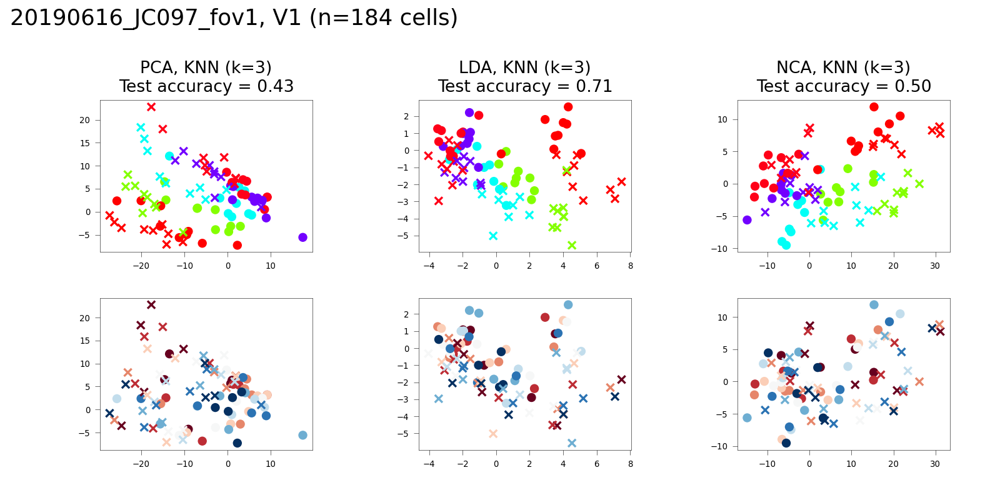

Text(0.01, 0.95, '20190616_JC097_fov1, V1 (n=184 cells)')

In [896]:
# Make a list of the methods to be compared
dim_reduction_methods = [('PCA', pca), ('LDA', lda), ('NCA', nca)]

fig, axn = pl.subplots(2,3, figsize=(10,5)) #, sharex=True, sharey=True) #pl.figure()

# plt.figure()
for i, (name, model) in enumerate(dim_reduction_methods):
#     pl.figure()
#     # plt.subplot(1, 3, i + 1, aspect=1)

    ax=axn[0, i]
    
    # Fit the method's model
    model.fit(X_train, y_train_sz)

    # Fit a nearest neighbor classifier on the embedded training set
    knn.fit(model.transform(X_train), y_train_sz)

    # Compute the nearest neighbor accuracy on the embedded test set
    acc_knn = knn.score(model.transform(X_test), y_test_sz)

    # Embed the data set in 2 dimensions using the fitted model
    X_embedded = model.transform(X)
    
    X_embedded2 = model.transform(X2)

    # Plot the projected points and show the evaluation score
    ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=y_sz, s=30, cmap='hsv', marker='o', facecolor='none')
    
    ax.scatter(X_embedded2[:, 0], X_embedded2[:, 1], c=y_sz_2, s=30, cmap='hsv', marker='x')
    
    ax.set_title("{}, KNN (k={})\nTest accuracy = {:.2f}".format(name,
                                                              n_neighbors,
                                                              acc_knn))
    
    ax=axn[1, i]
    ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=y_mp, s=30, cmap='RdBu', marker='o', facecolor='none')
    
    ax.scatter(X_embedded2[:, 0], X_embedded2[:, 1], c=y_mp_2, s=30, cmap='RdBu', marker='x')
    
pl.subplots_adjust(left=0.1, right=0.95, bottom=0.1, top=0.8, wspace=0.5, hspace=0.3)


ncells=X.shape[1]
fig.text(0.01, 0.95, '%s, %s (n=%i cells)' % ( va, dk, ncells), fontsize=16)


In [1014]:
morph_colors = sns.diverging_palette(250, 30, l=65, center="dark", as_cmap=True) #, n_colors=3)
msplit = {0:0, 14:0, 27: 0, 40: 1, 53: 1, 66: 1, 79: 2, 92: 2, 106: 2}


Skipping: Li, 20190315_JC070_fov1


Traceback (most recent call last):
  File "/net/coxfs01/srv/export/coxfs01/share_root/2p-pipeline/repos/2p-pipeline/pipeline/python/classifications/notebooks/response_stats/py3utils.py", line 43, in load_split_pupil_input
    assert len(curr_inputfiles)==1, "More than 1 input file: %s" % str(curr_inputfiles)
AssertionError: More than 1 input file: []


<IPython.core.display.Javascript object>


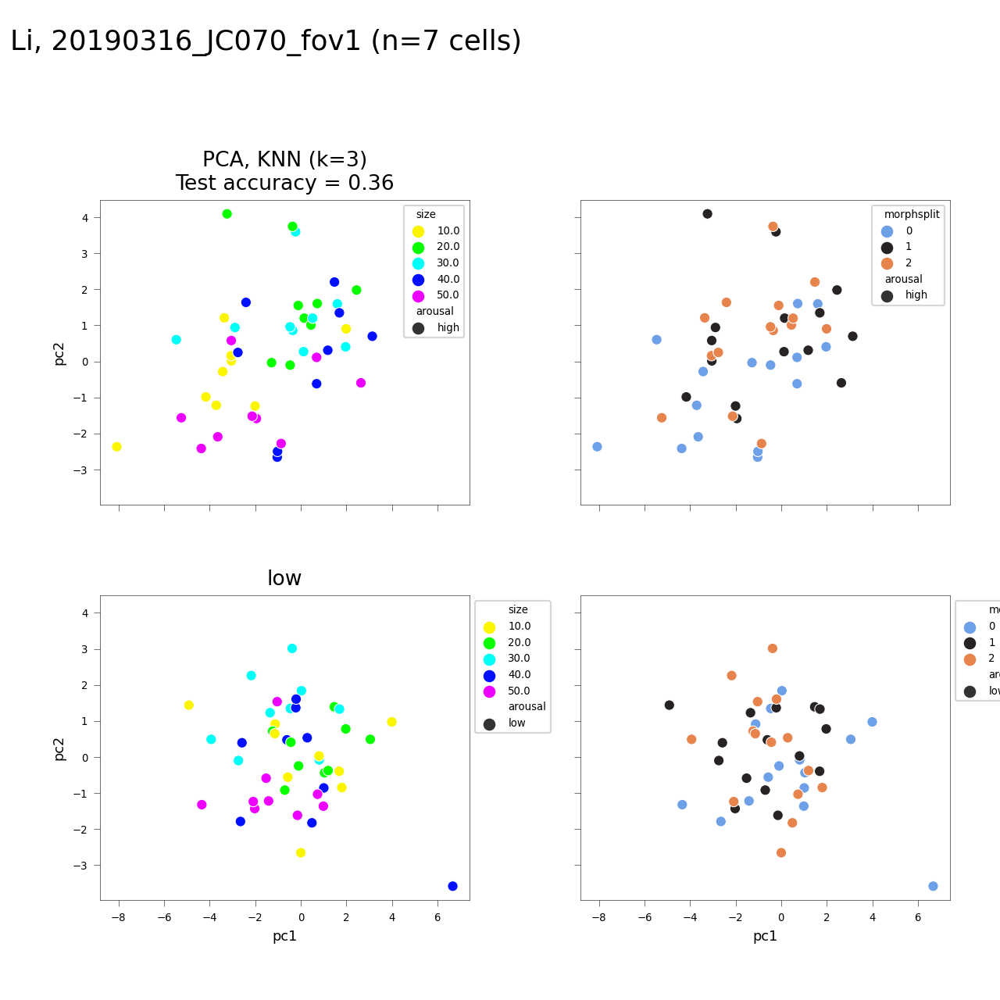

Bad dict: Li, 20190319_JC067_fov1
Too few trials: Li, 20190320_JC067_fov1
Too few trials: Li, 20190321_JC070_fov1


<IPython.core.display.Javascript object>


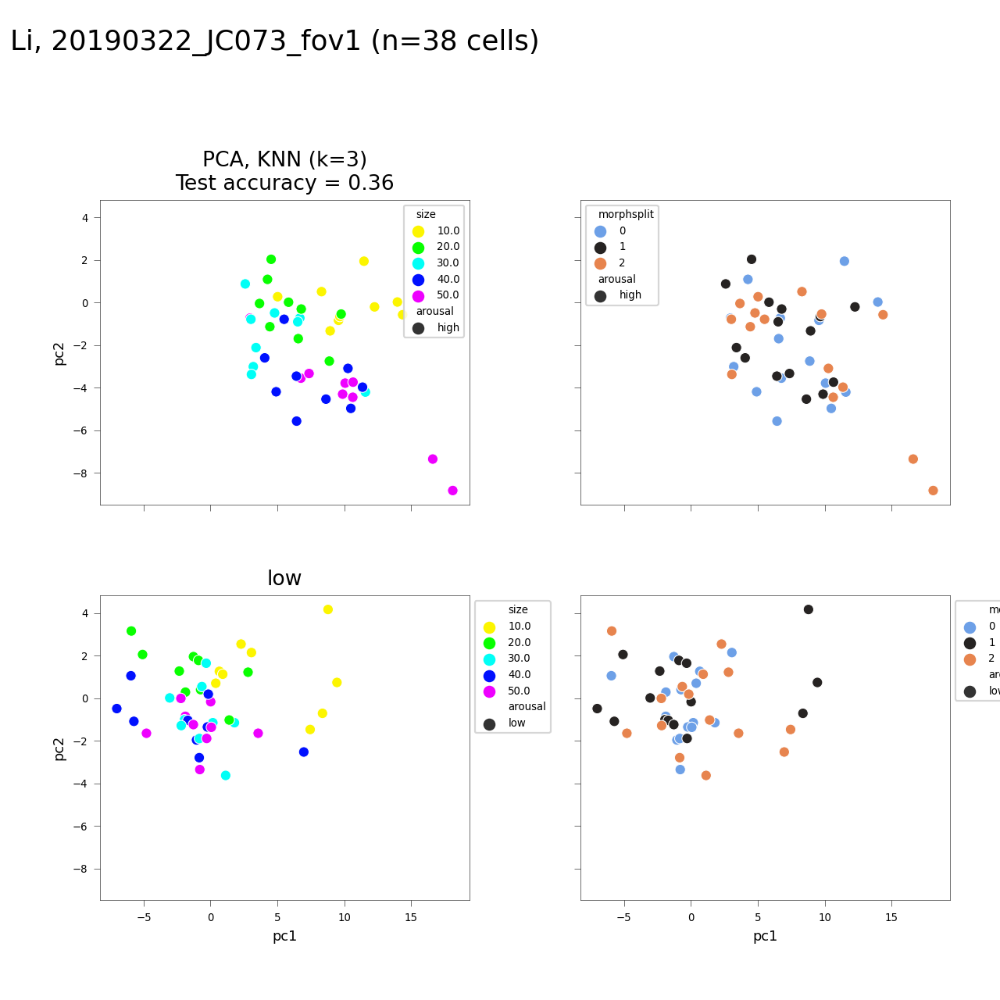

<IPython.core.display.Javascript object>


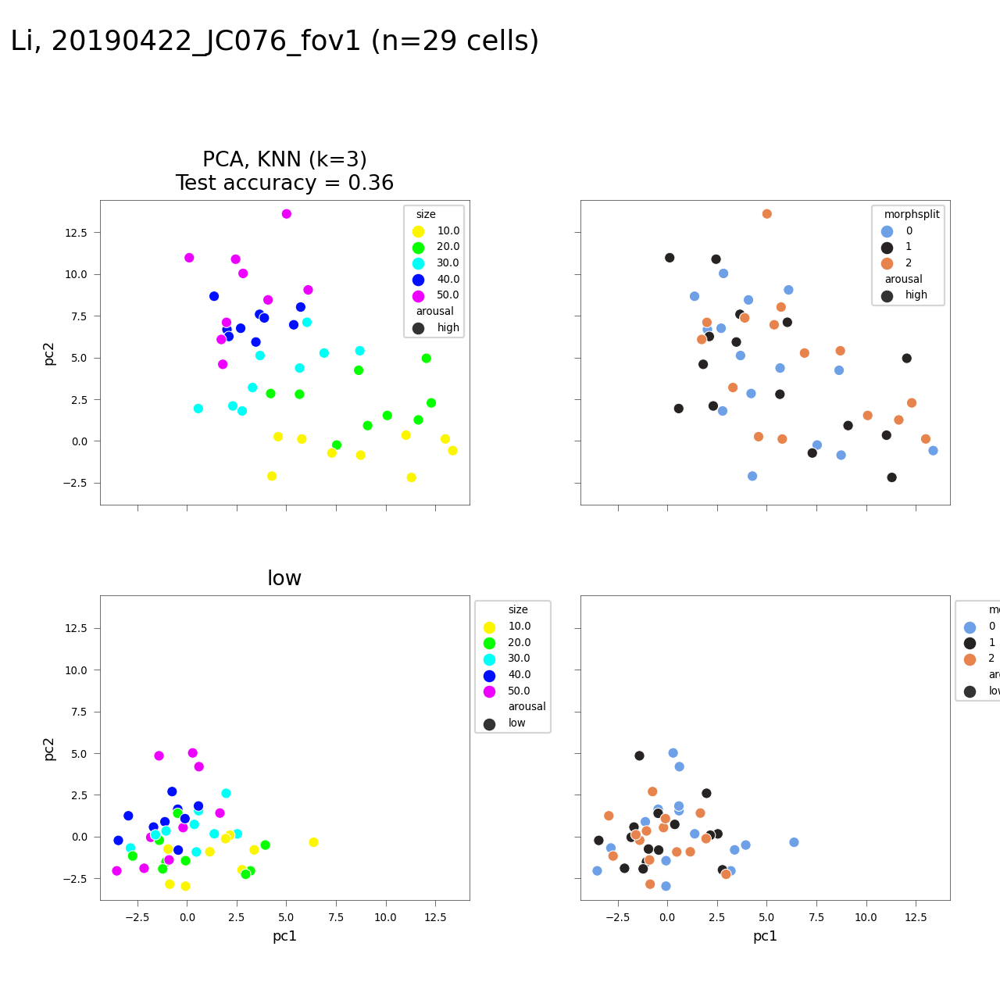

<IPython.core.display.Javascript object>


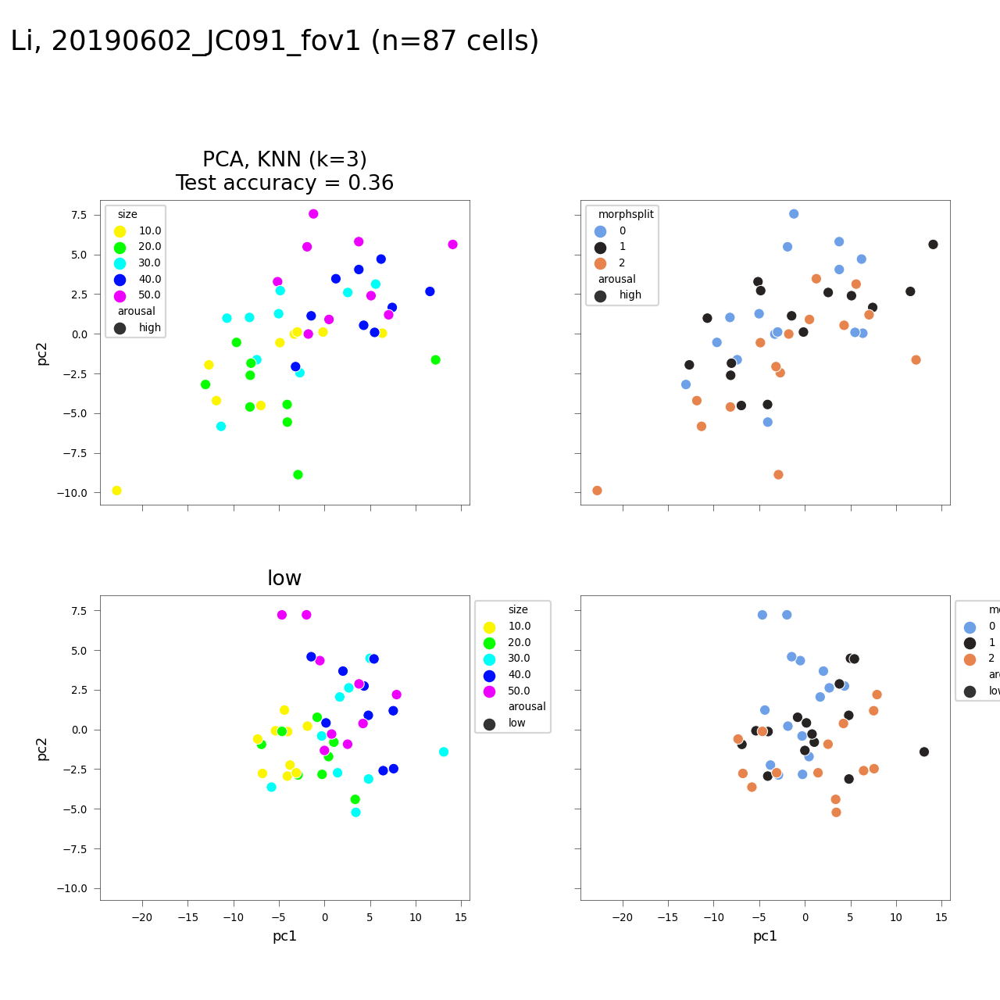

<IPython.core.display.Javascript object>


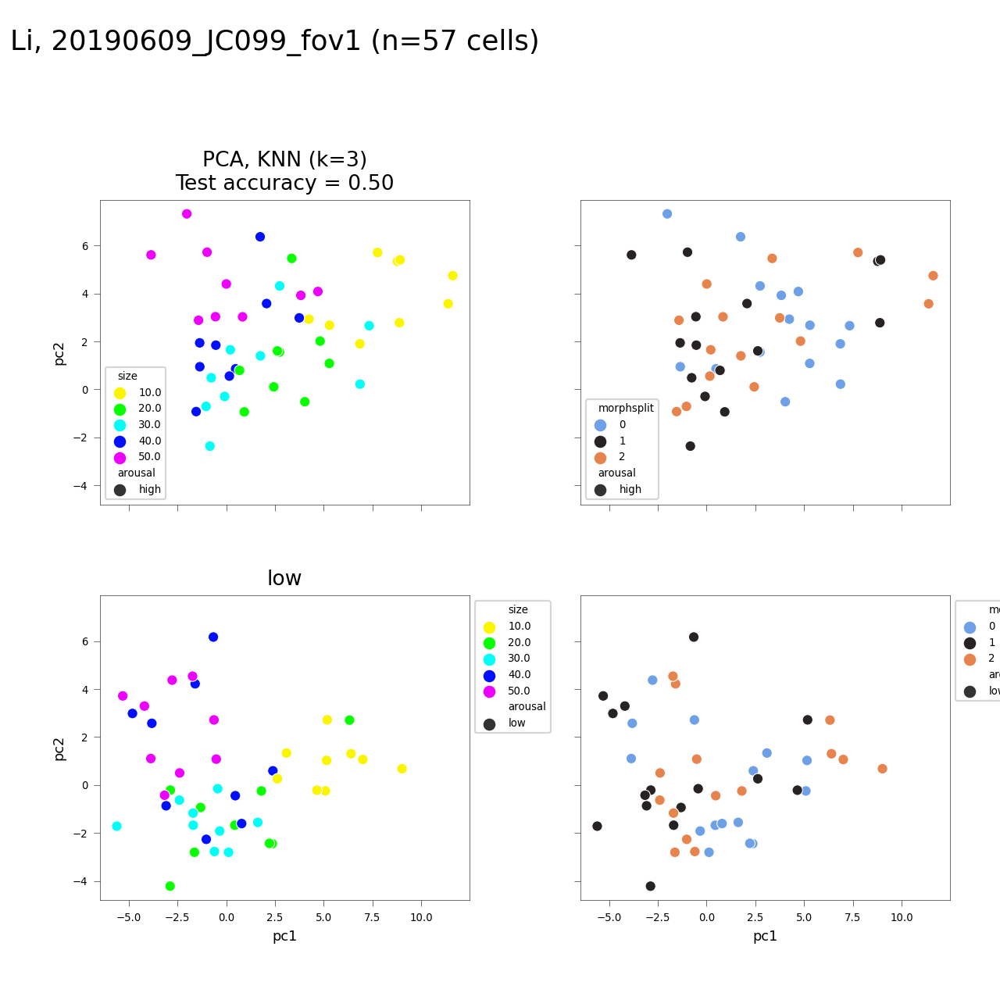

<IPython.core.display.Javascript object>


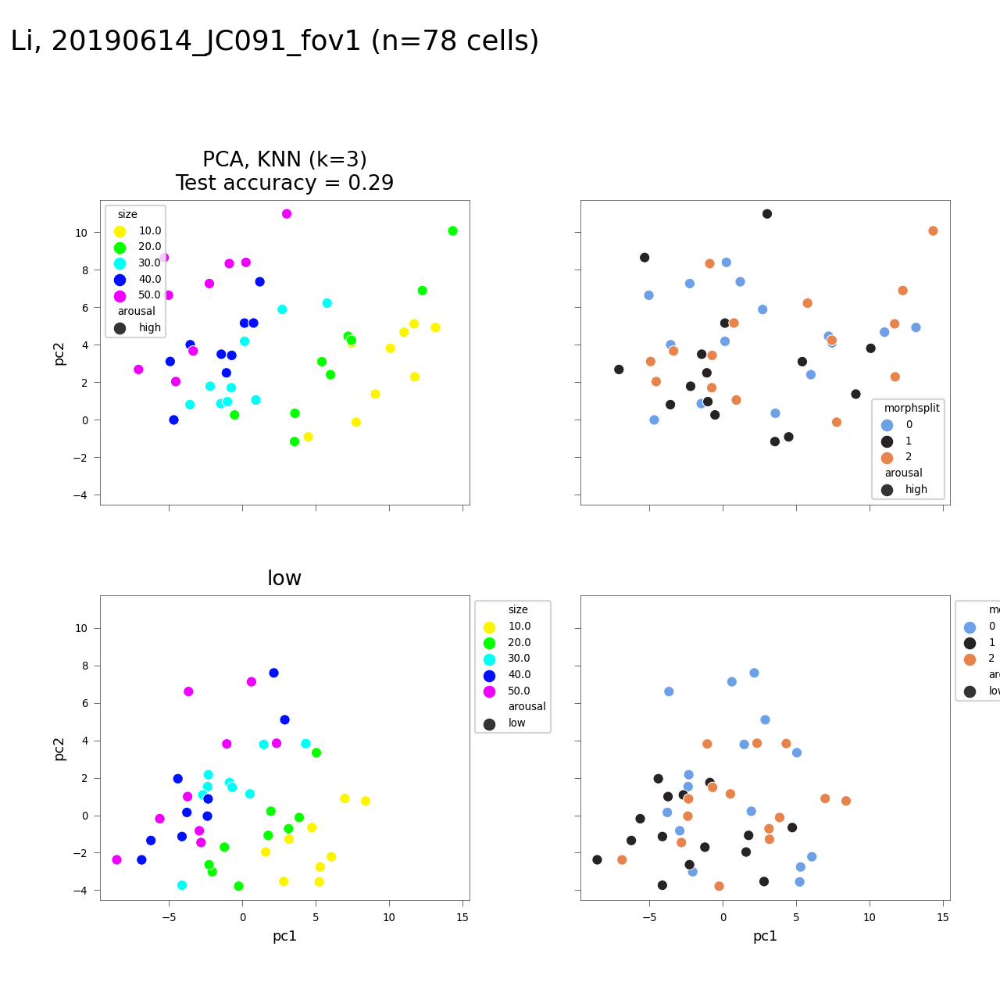

<IPython.core.display.Javascript object>


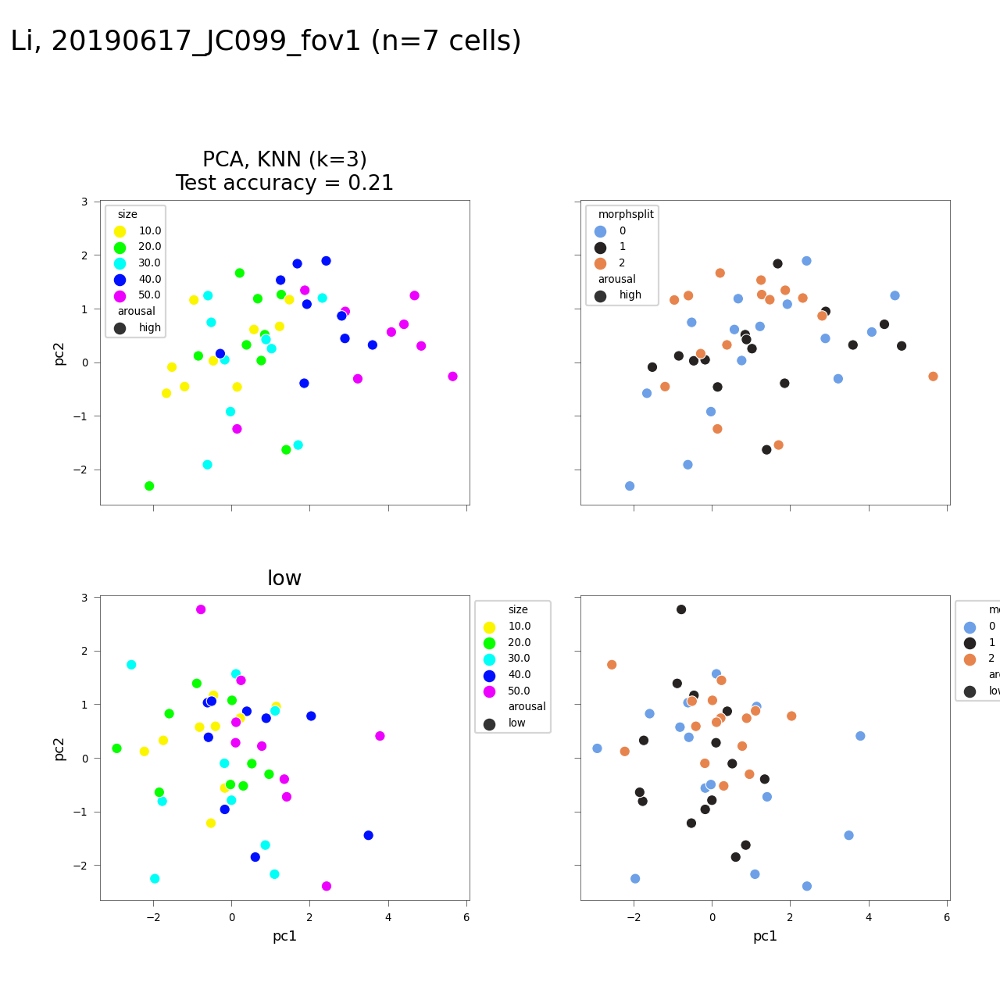

Bad dict: Li, 20191018_JC113_fov1


<IPython.core.display.Javascript object>


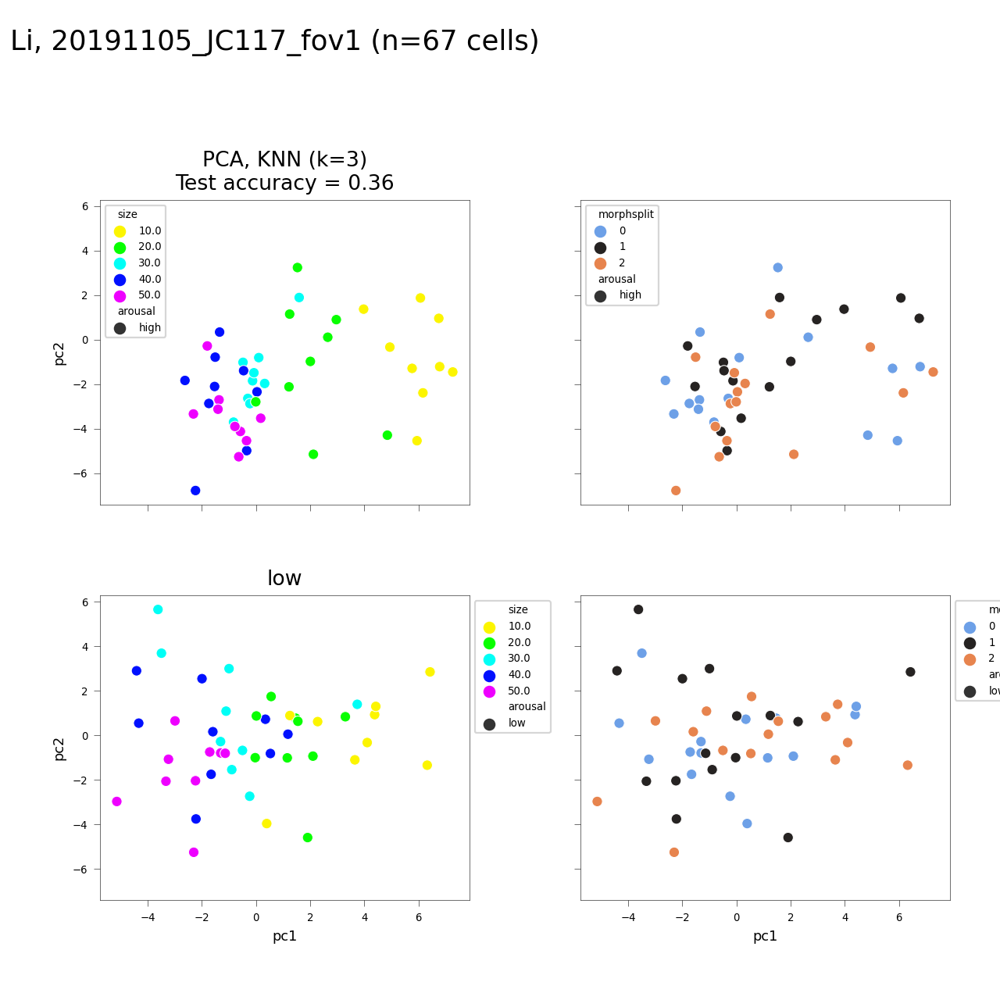

<IPython.core.display.Javascript object>


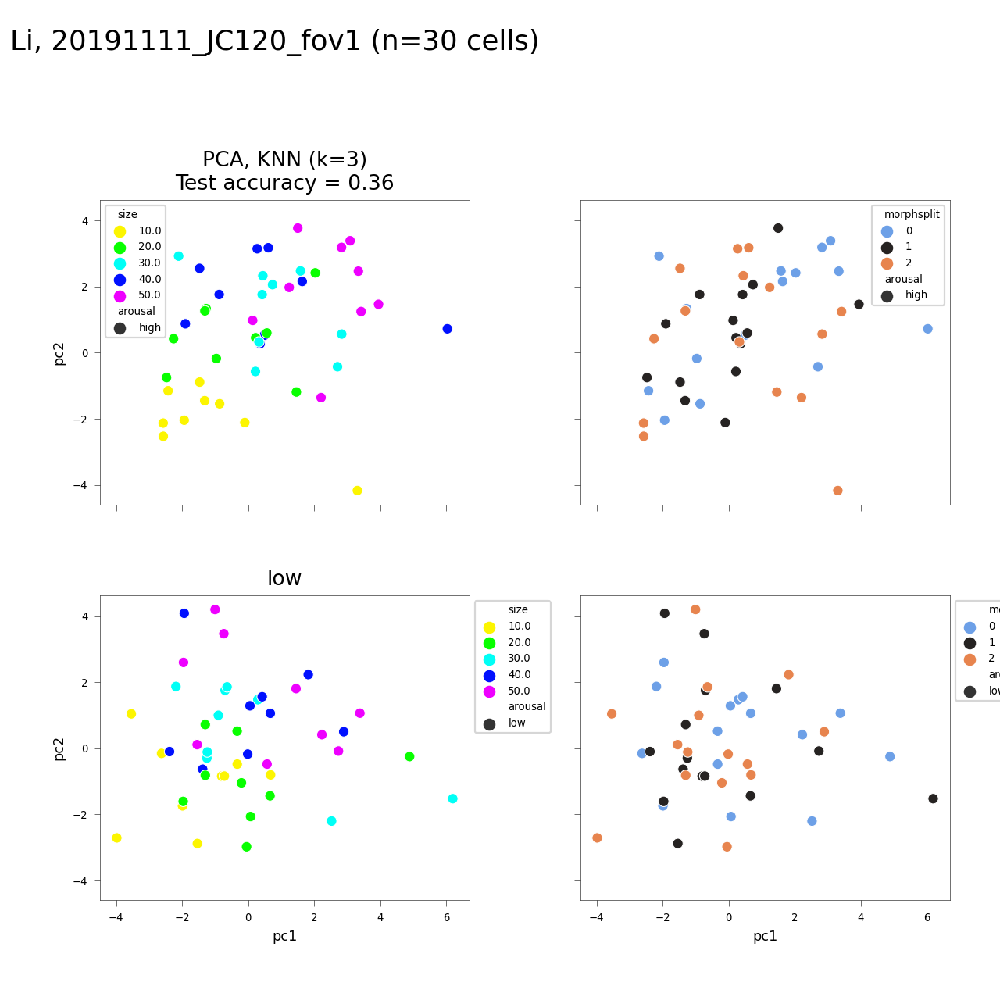

<IPython.core.display.Javascript object>


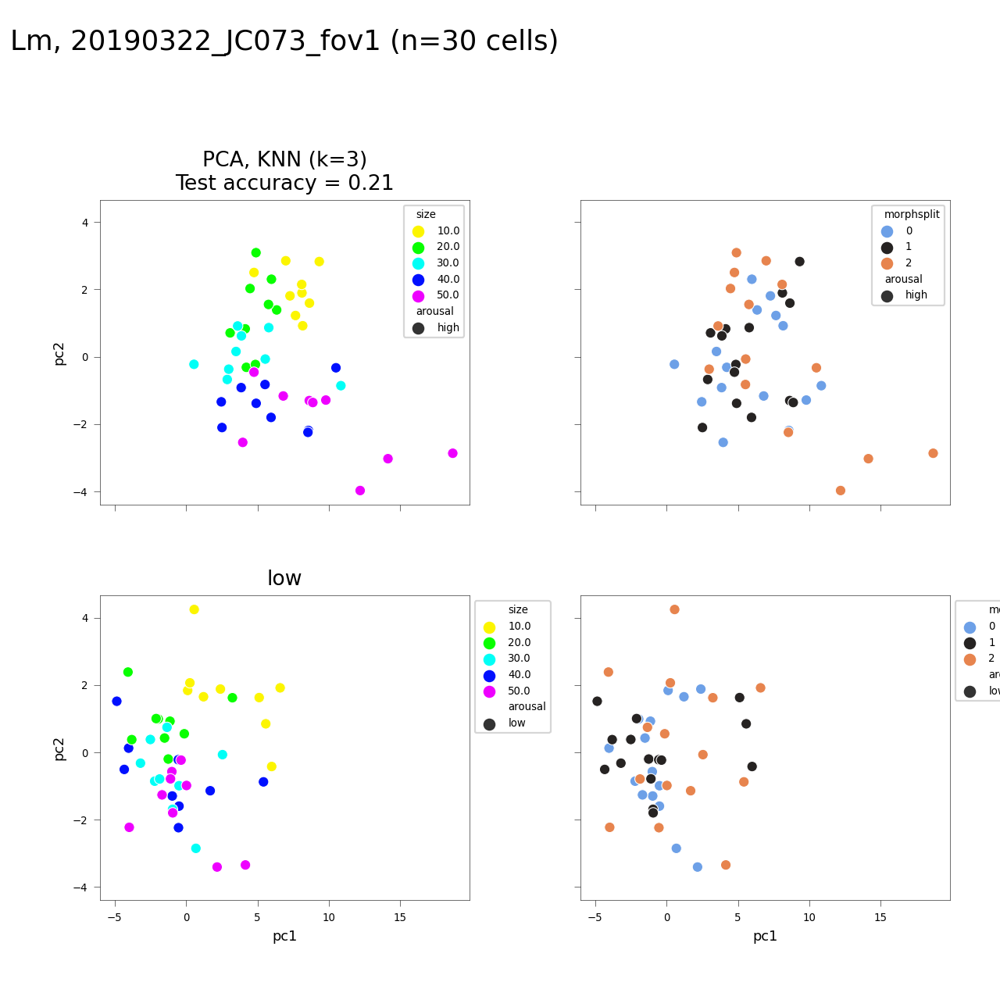

<IPython.core.display.Javascript object>


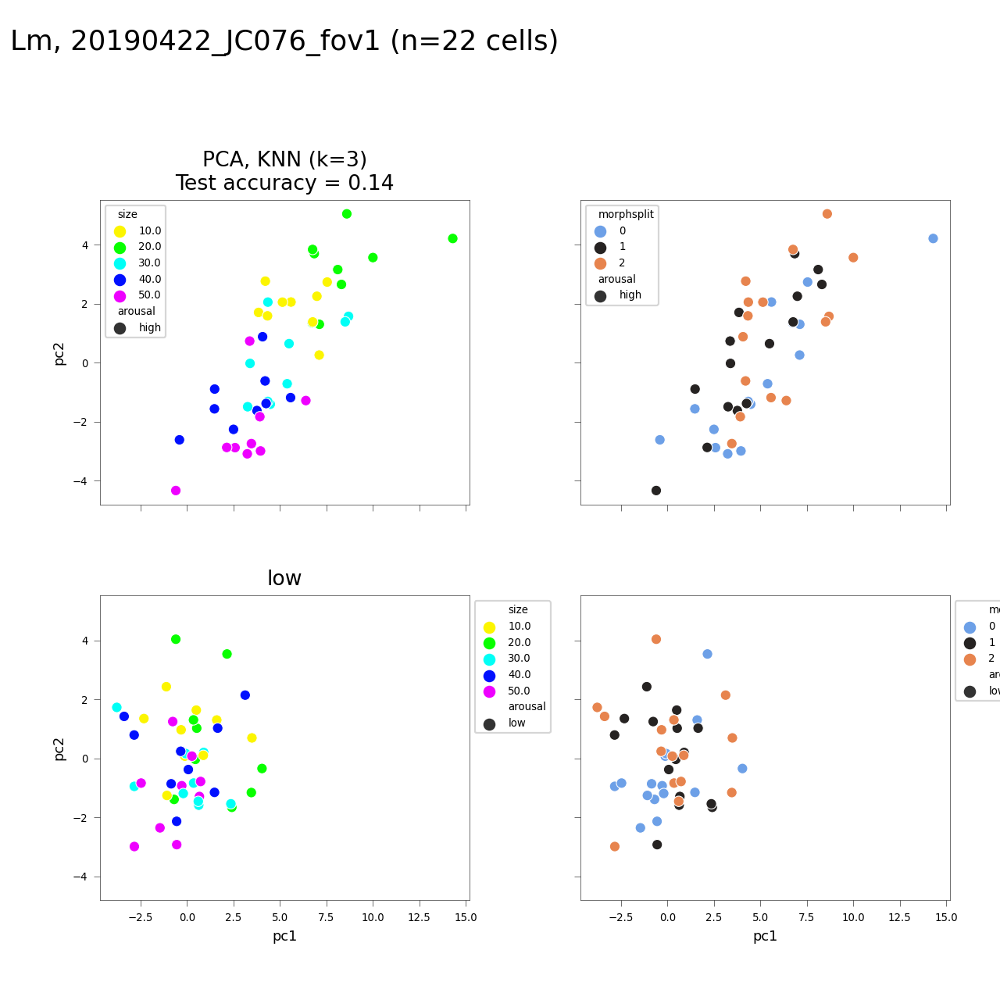

<IPython.core.display.Javascript object>


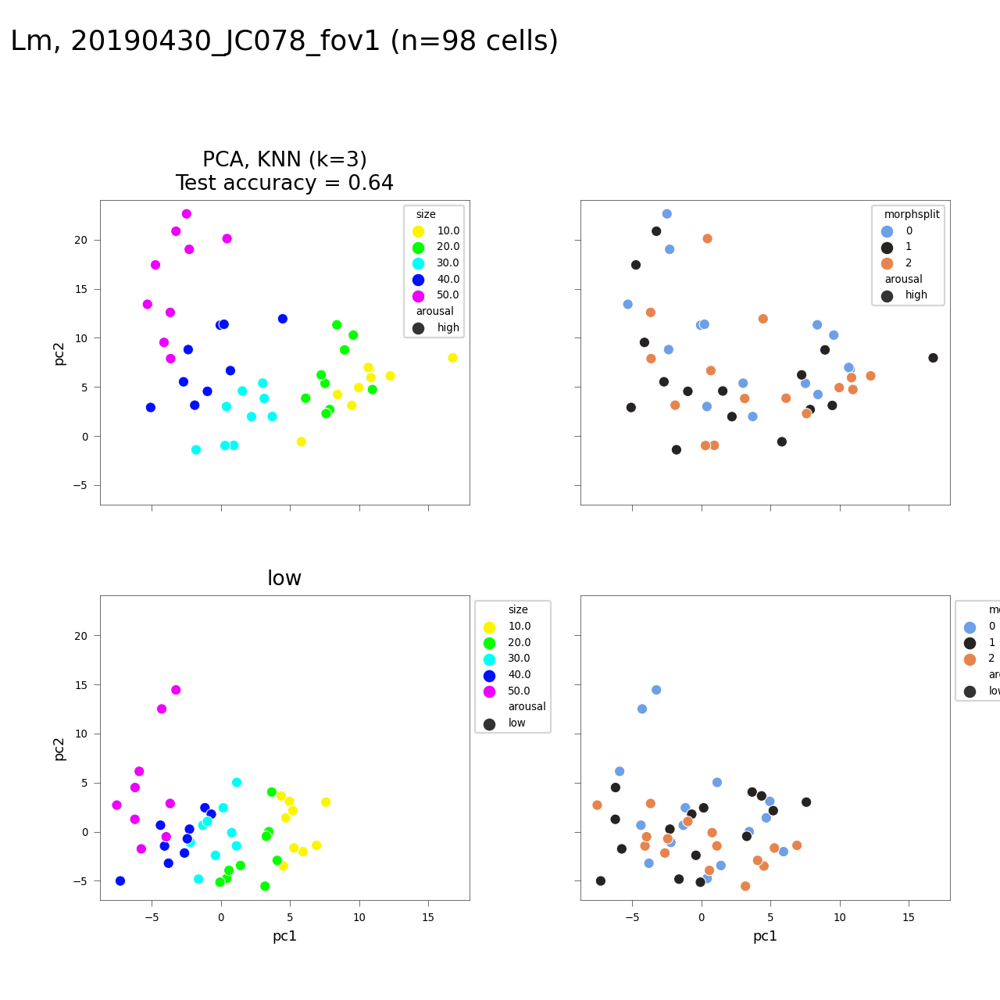

<IPython.core.display.Javascript object>


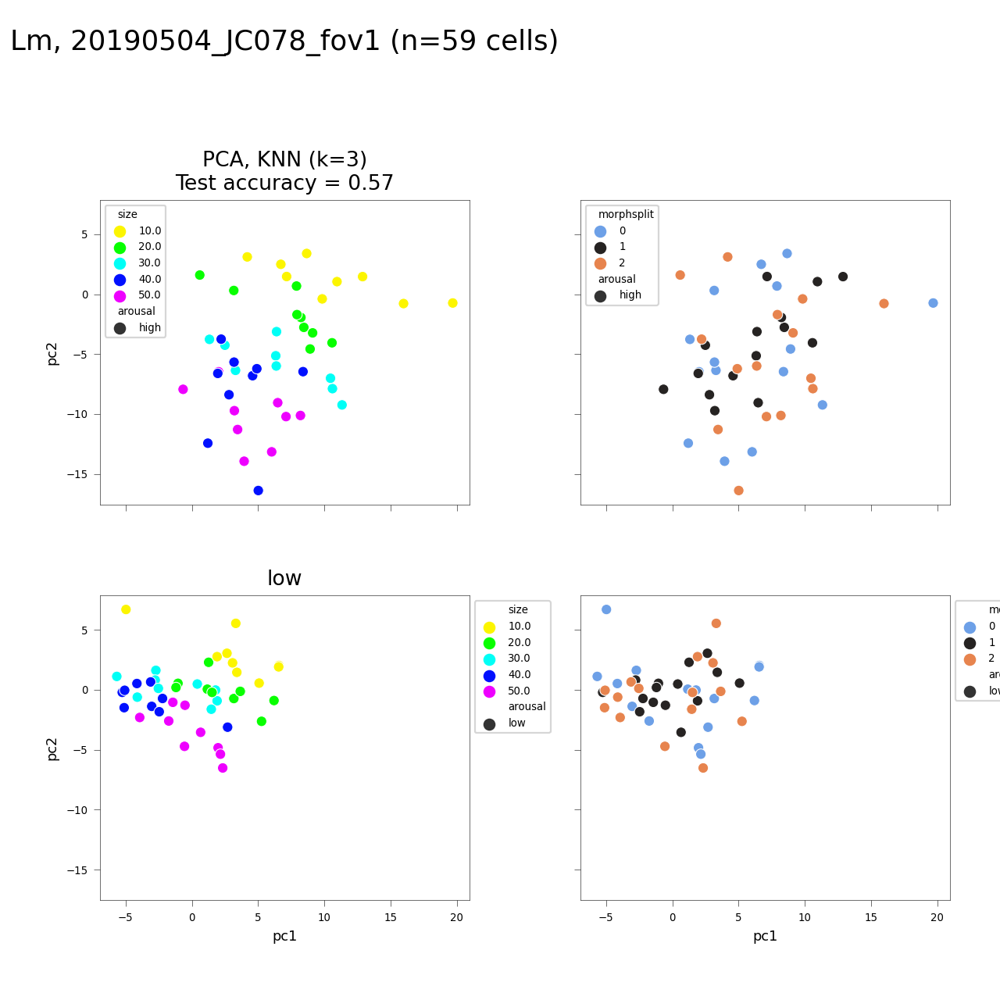

<IPython.core.display.Javascript object>


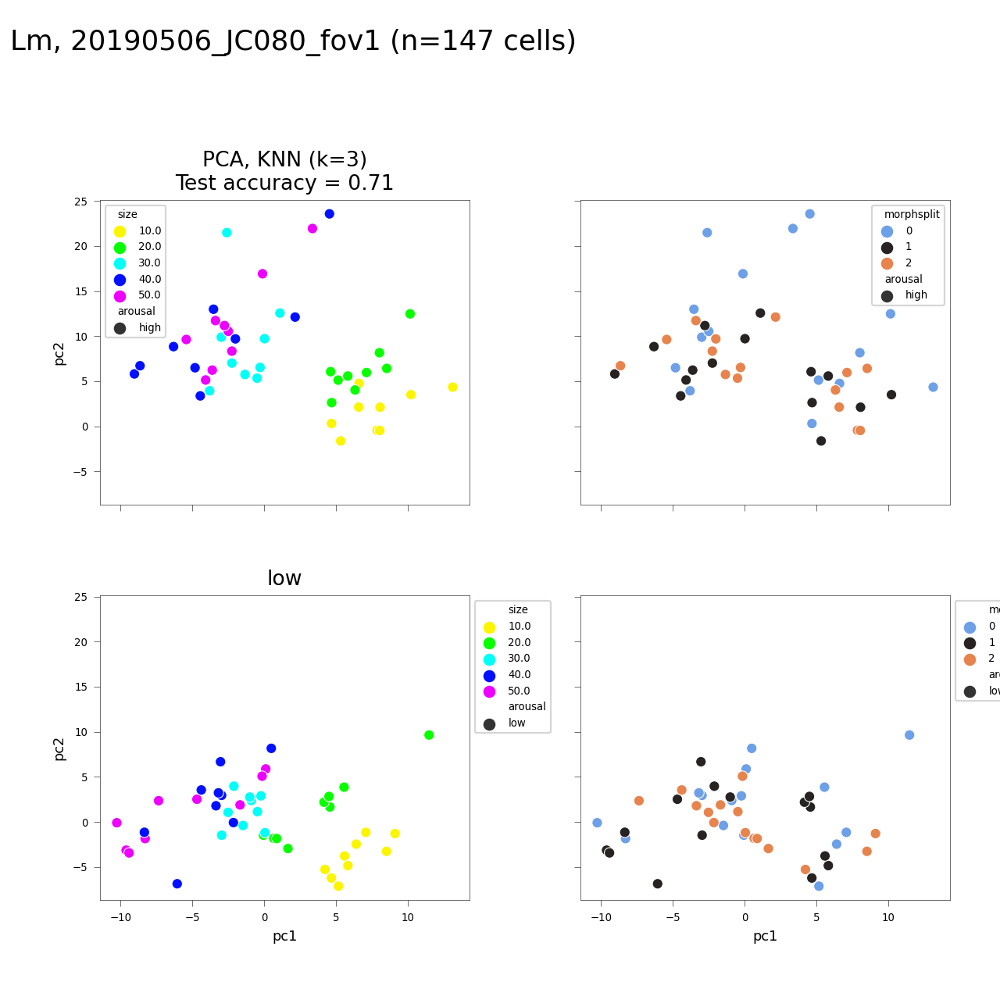

<IPython.core.display.Javascript object>


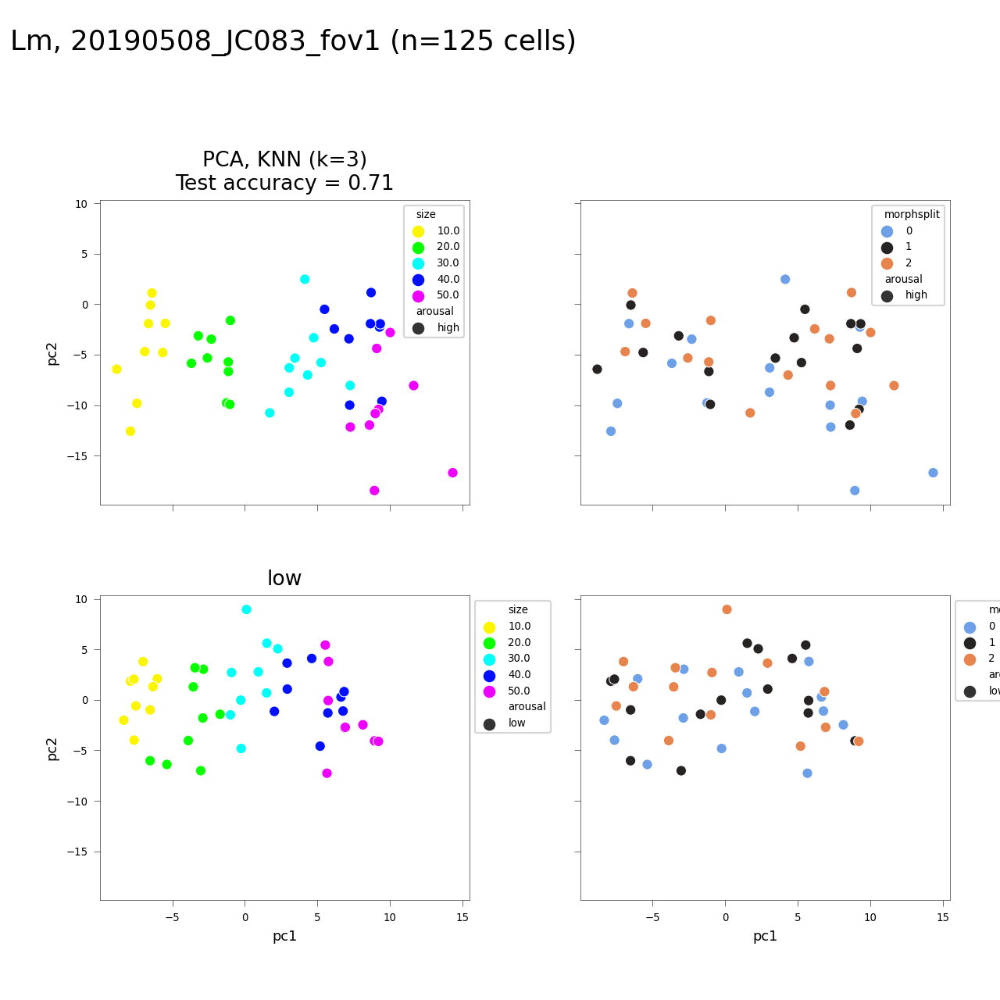

<IPython.core.display.Javascript object>


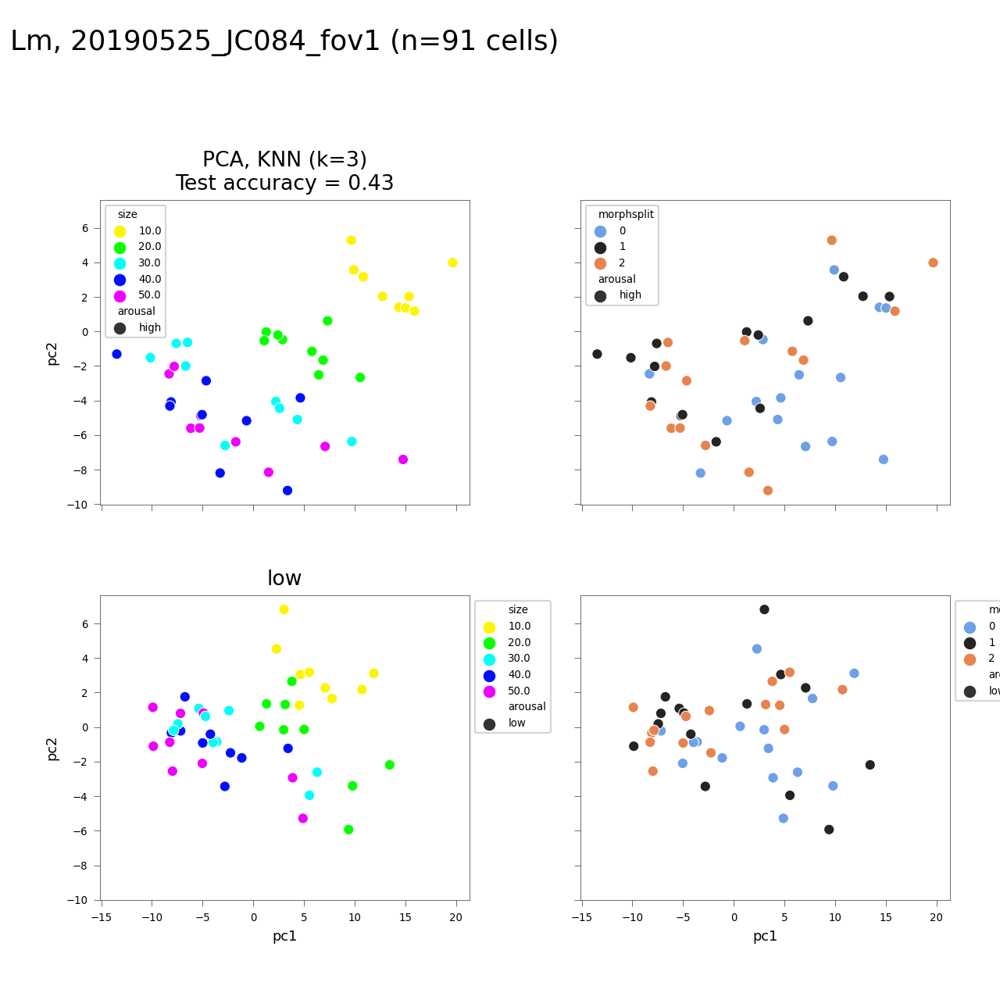

<IPython.core.display.Javascript object>


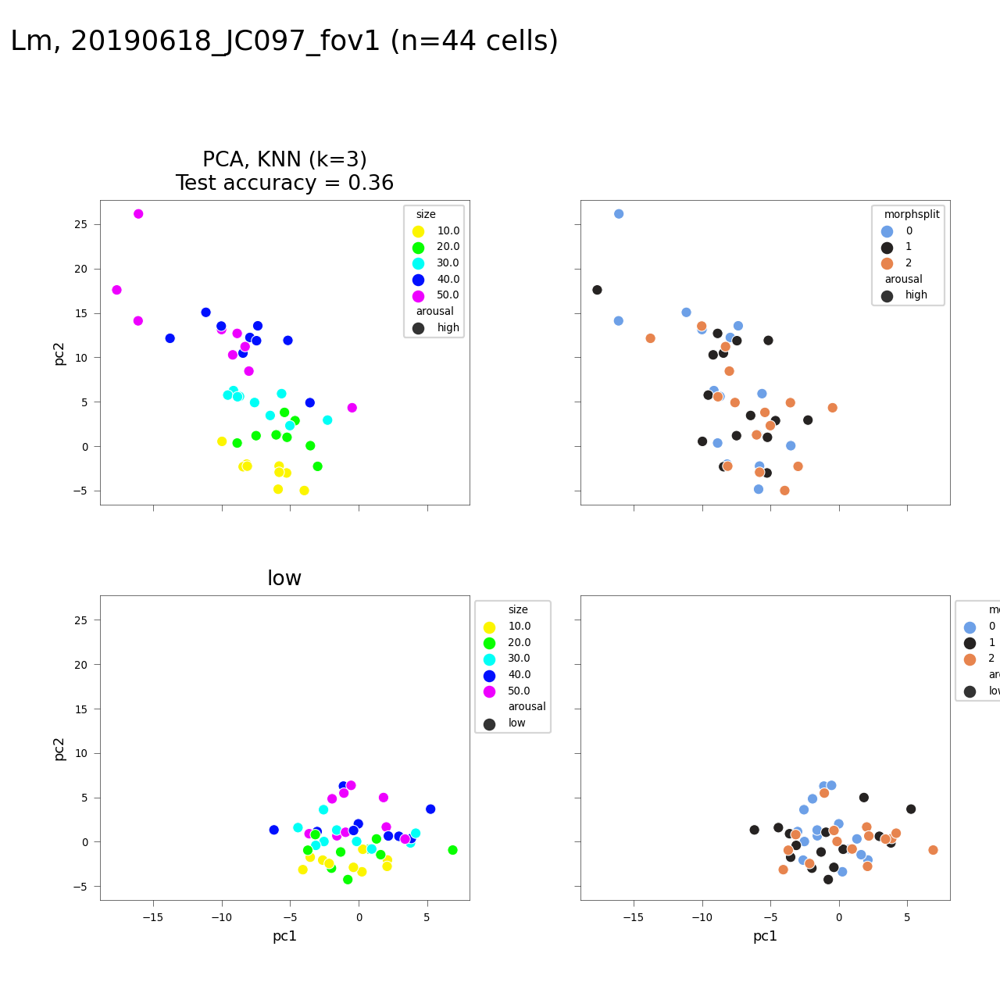

<IPython.core.display.Javascript object>


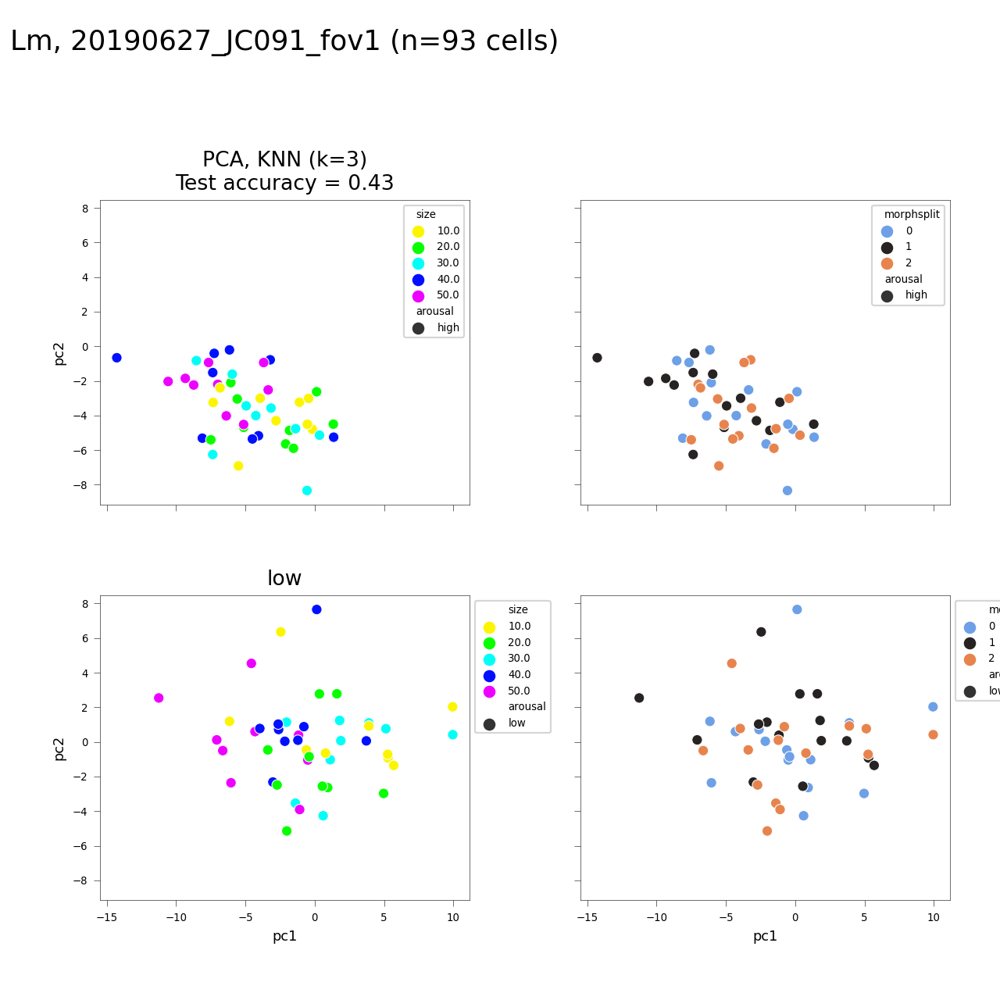

<IPython.core.display.Javascript object>


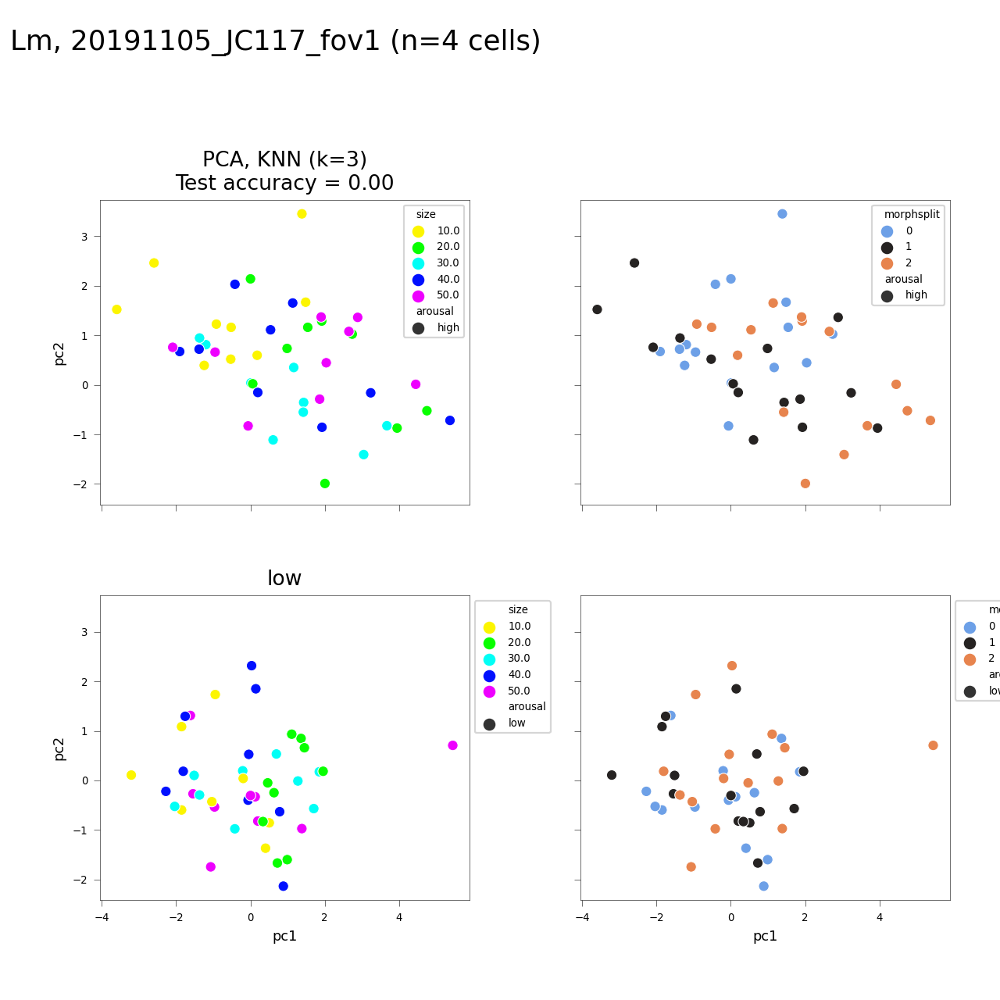

Too few trials: Lm, 20191111_JC120_fov1


<IPython.core.display.Javascript object>


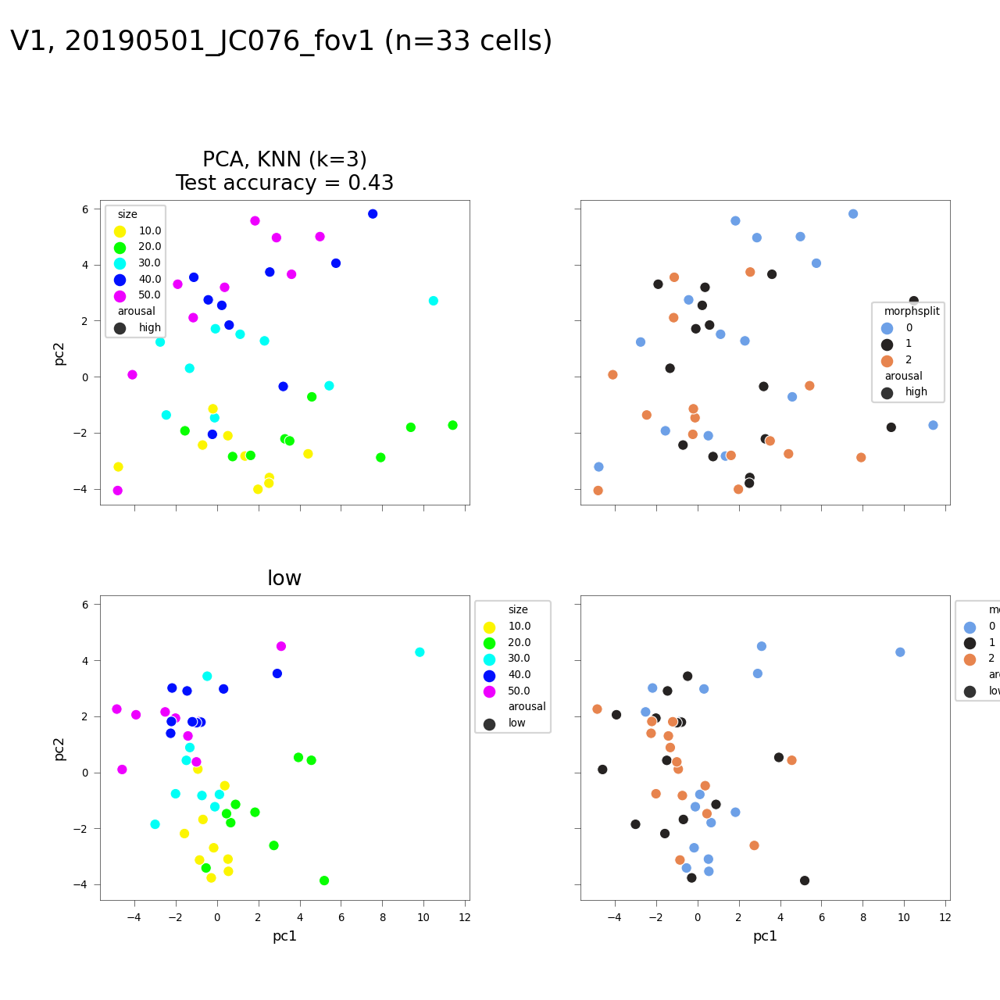

<IPython.core.display.Javascript object>


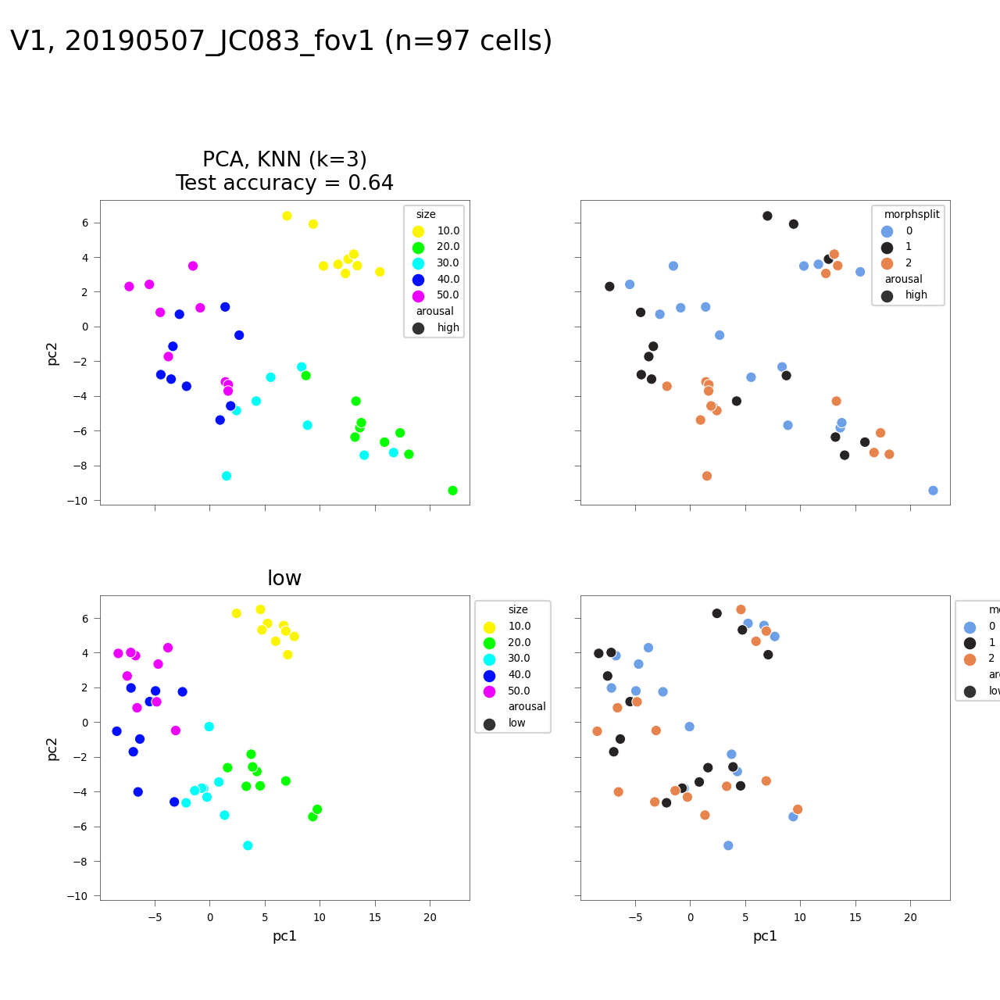

<IPython.core.display.Javascript object>


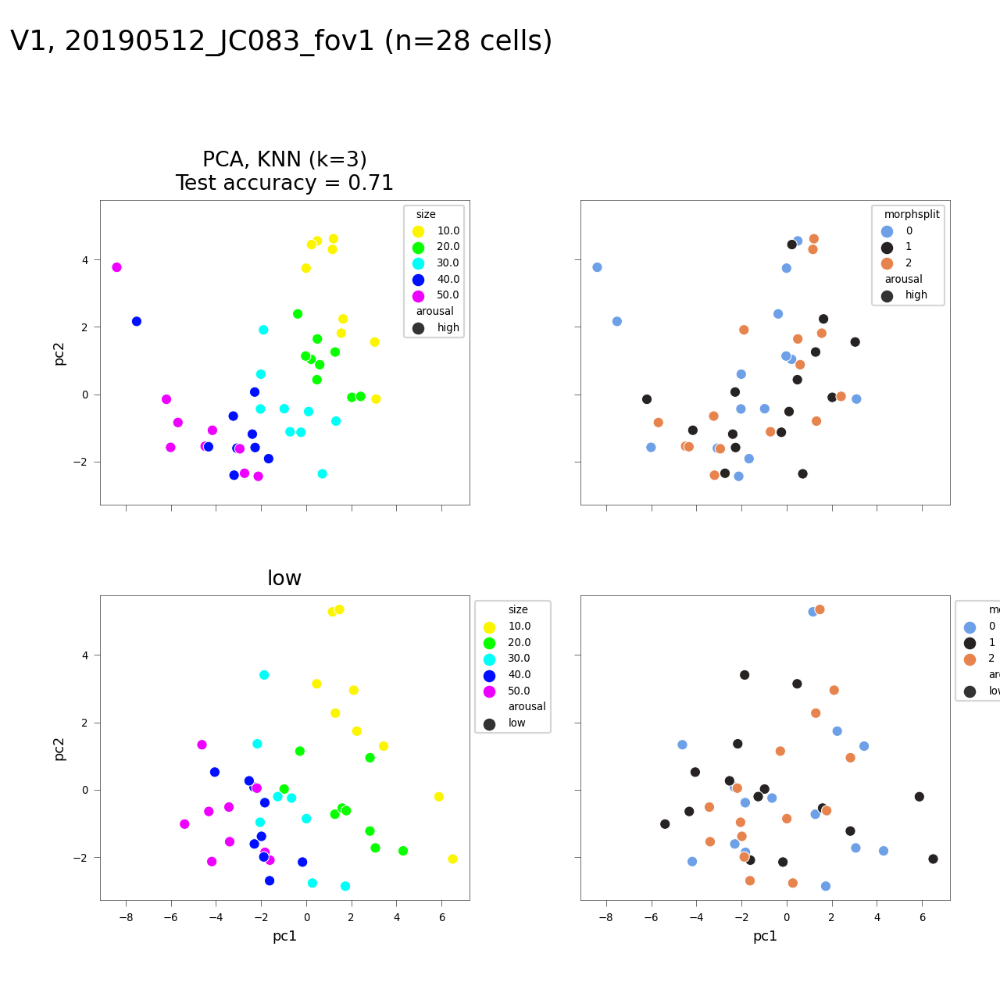

<IPython.core.display.Javascript object>


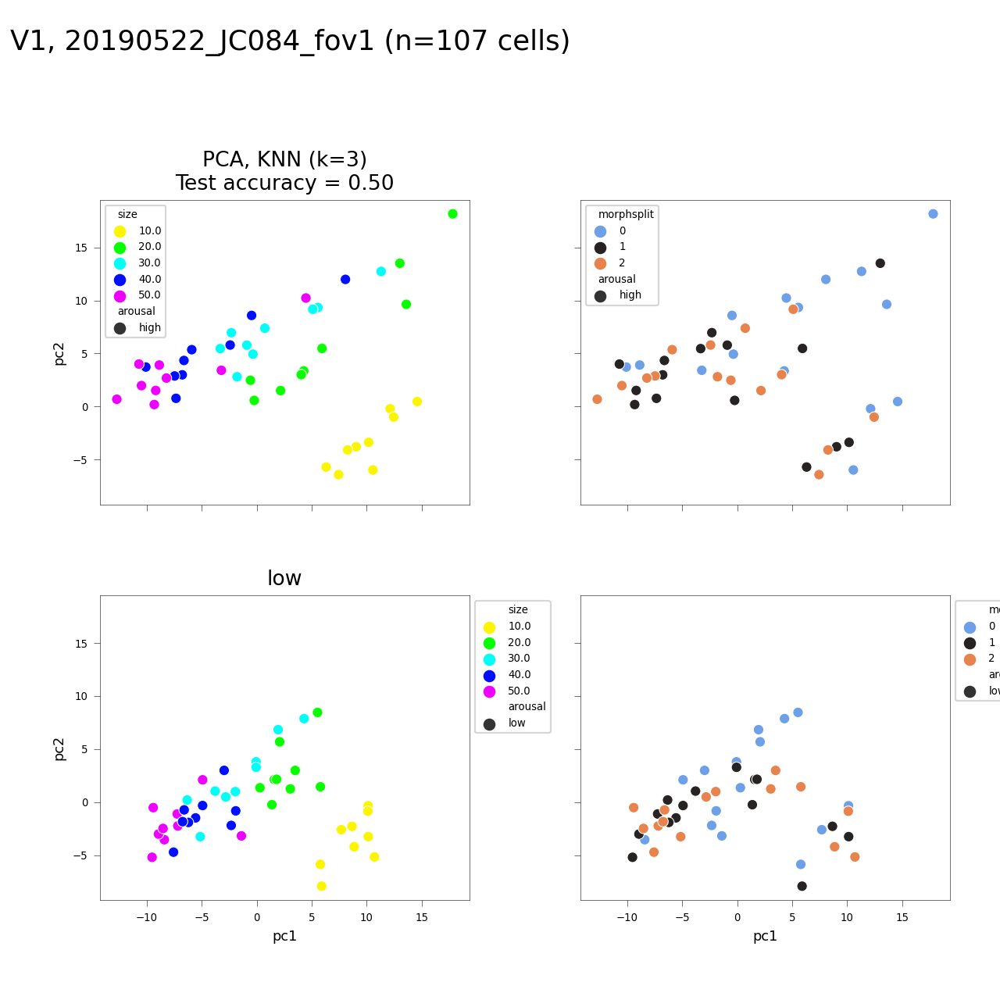

<IPython.core.display.Javascript object>


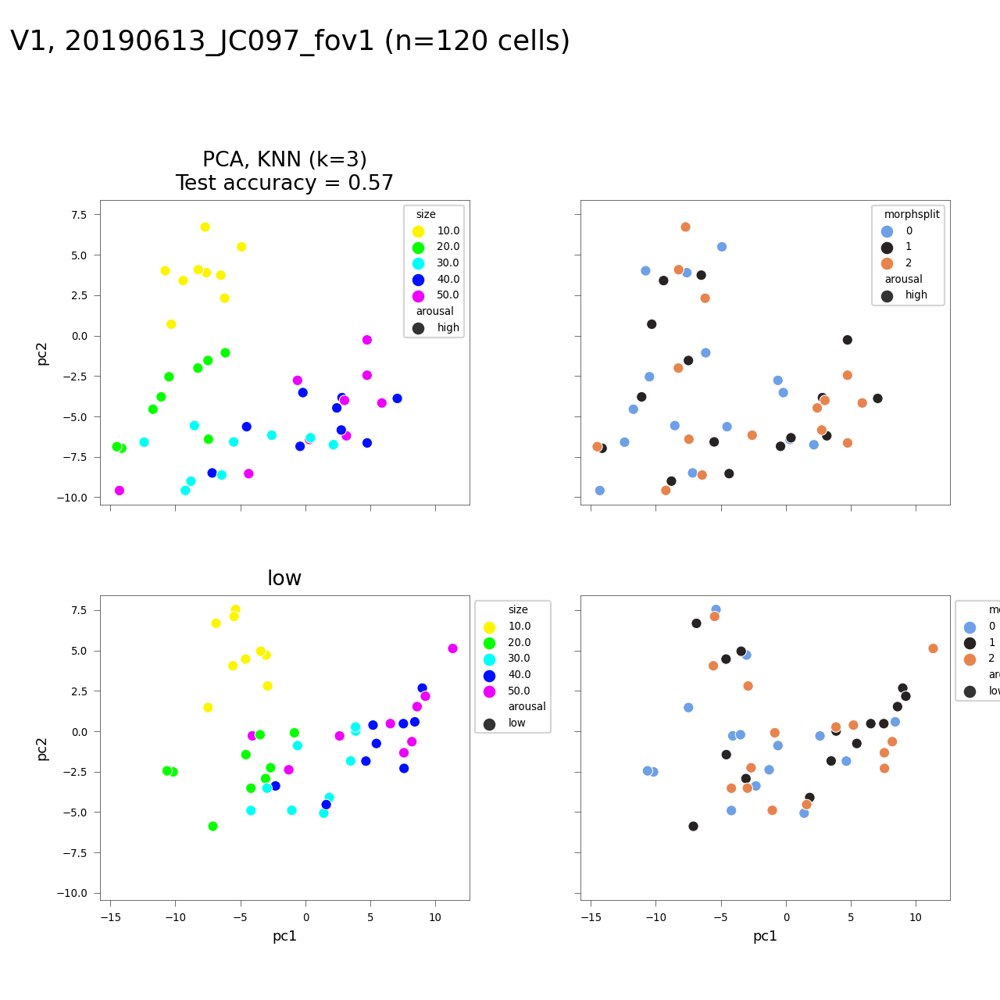

<IPython.core.display.Javascript object>


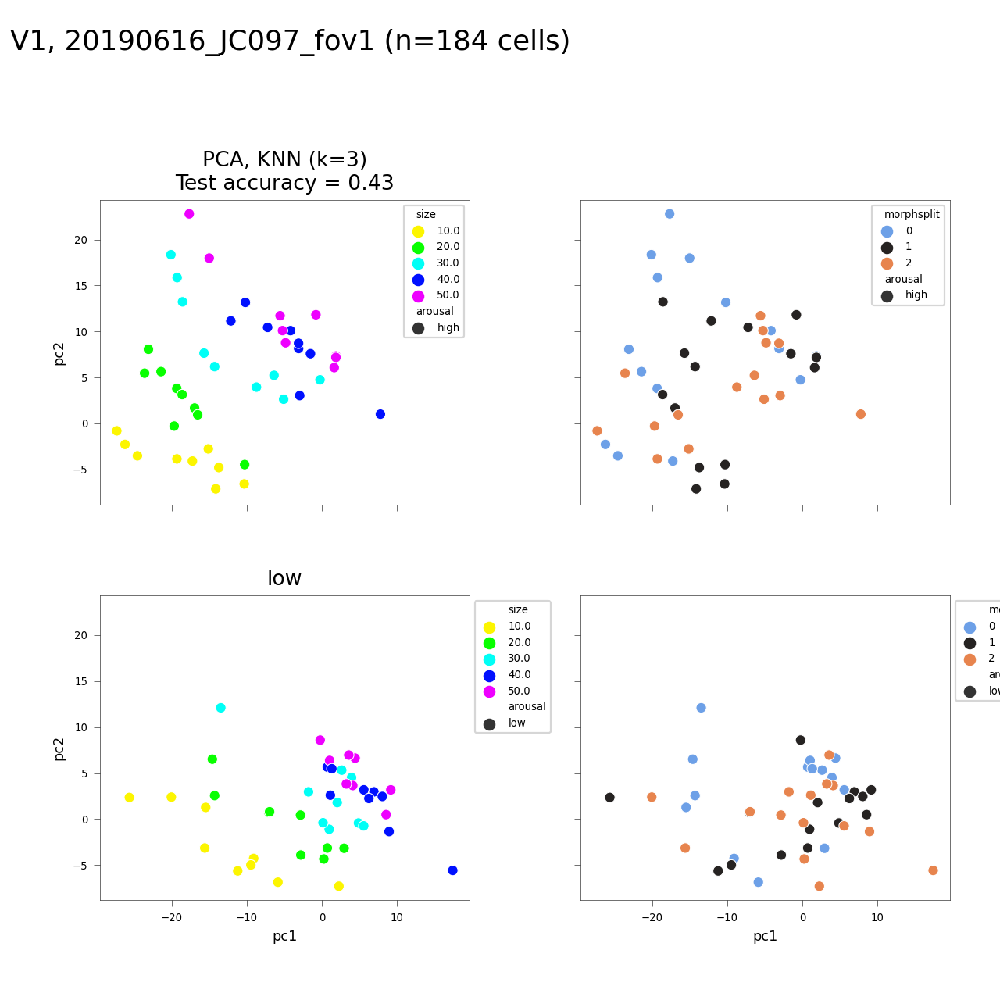

<IPython.core.display.Javascript object>


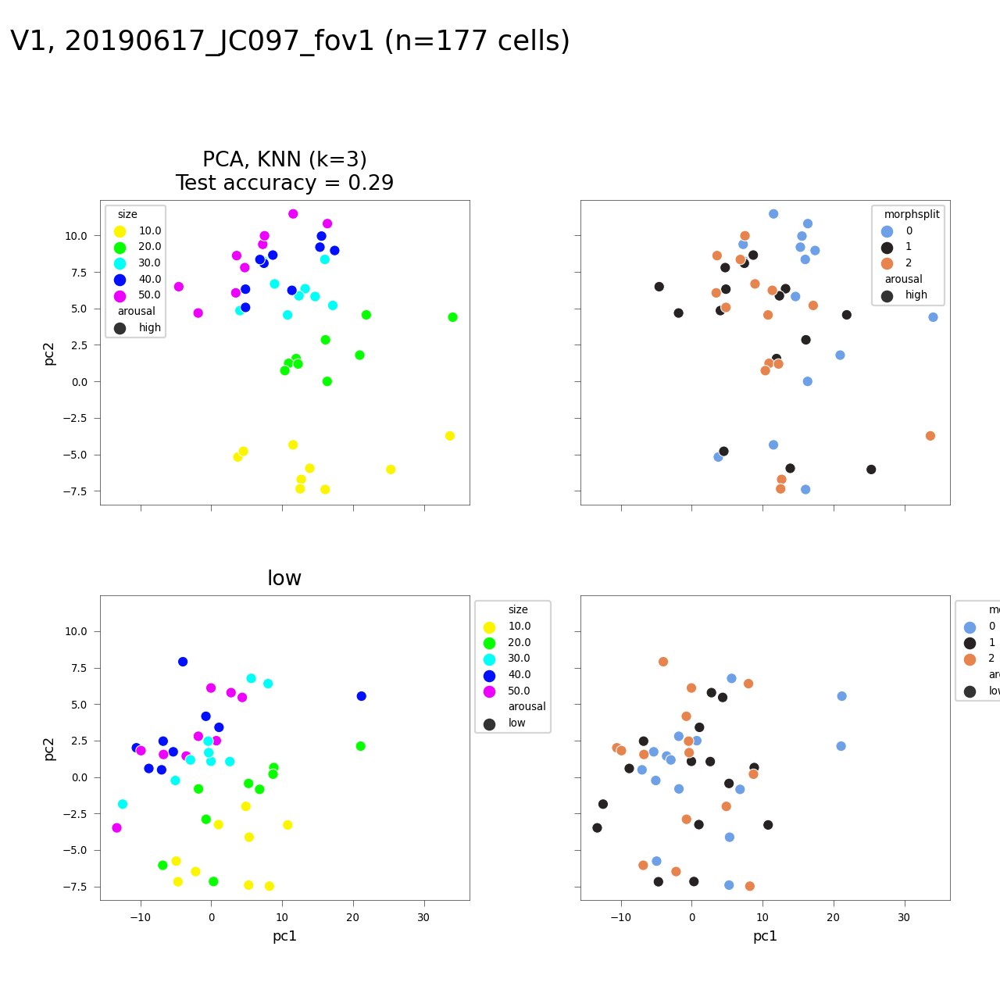

<IPython.core.display.Javascript object>


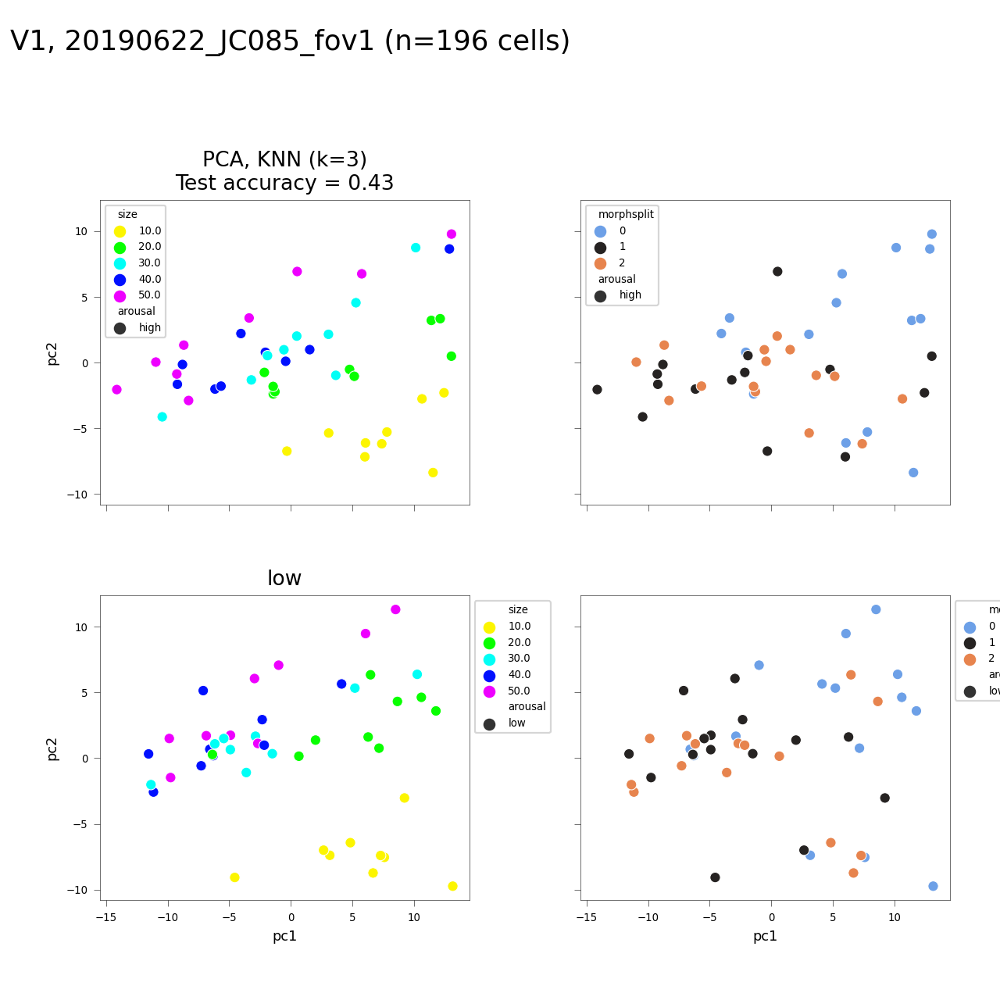

<IPython.core.display.Javascript object>


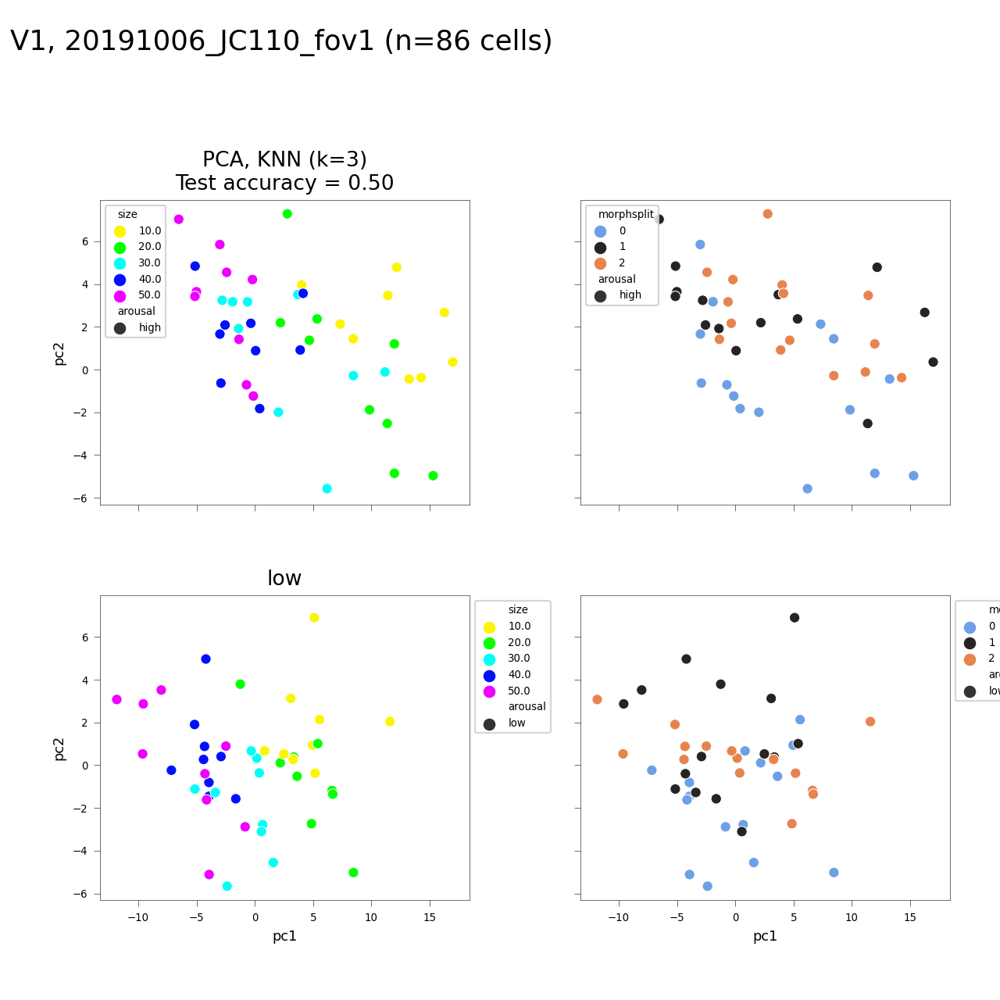

In [1021]:
RANDOM_STATE = 42
n_neighbors = 3
# Make a list of the methods to be compared
dim_reduction_methods = [('PCA', pca), ('LDA', lda), ('NCA', nca)]


for (va, dk), nd in ND.groupby(['visual_area', 'datakey']):
    in_trials=None; in_neural=None;
    session, animalid, fovnum = p3.split_datakey_str(dk)
    sdf = SDF[dk].copy()
    configs = sdf.index.tolist()

    # Load split_pupil input
    curr_id = p3.decode_analysis_id(visual_area=va, prefix='split_pupil', response_type=response_type, 
                        responsive_test=responsive_test, overlap_thr=overlap_thr, trial_epoch=trial_epoch)
    res = p3.load_split_pupil_input(animalid, session, fovnum, curr_id=curr_id, traceid=traceid)

    if res is None:
        print("Skipping: %s, %s" % (va,dk))
        continue
    if 'input_trials' not in res.keys():
        print("Bad dict: %s, %s" % (va,dk))
        continue
        
    # Group by iteration
    in_trials = res['input_trials'].copy()
    in_neural = res['neuraldf'].copy()
    curr_rois = [r for r in in_neural.columns if p3.isnumber(r)]
    if len(curr_rois)<2:
        print("Too few trials: %s, %s" % (va,dk))
        continue
        
    ndf = nd[(nd['cell'].isin(curr_rois))].copy()
    ndf['response'] = ndf['response'] - ndf.groupby(['cell'])['response'].transform('min')


    # Split hi/lo
    X_lo, y_lo, X_hi, y_hi = split_high_low(in_trials, in_neural, sdf)
    X_lo.shape, X_hi.shape


    X = copy.copy(X_lo)
    y = copy.copy(y_lo)

    y_sz = [sdf['size'][c] for c in y]
    y_mp = [sdf['morphlevel'][c] for c in y]


    # ALT 
    X2 = copy.copy(X_hi)
    y2 = copy.copy(y_hi)
    y_sz_2 = [sdf['size'][c] for c in y2]
    y_mp_2 = [sdf['morphlevel'][c] for c in y2]


    # Make a train/test split using 30% test size
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.30,
                                                        random_state=RANDOM_STATE)

    y_train_sz = [sdf['size'][c] for c in y_train]
    y_train_mp = [sdf['morphlevel'][c] for c in y_train]

    y_test_sz = [sdf['size'][c] for c in y_test]
    y_test_mp = [sdf['morphlevel'][c] for c in y_test]


    dim = len(y)

    n_classes = len(np.unique(y_sz))

    # Reduce dimension to 2 with PCA
    pca = make_pipeline(StandardScaler(),
                        PCA(n_components=2, random_state=RANDOM_STATE))

    # Reduce dimension to 2 with LinearDiscriminantAnalysis
    lda = make_pipeline(StandardScaler(),
                        LinearDiscriminantAnalysis(n_components=2))

    # Reduce dimension to 2 with NeighborhoodComponentAnalysis
    nca = make_pipeline(StandardScaler(),
                        NeighborhoodComponentsAnalysis(n_components=2,
                                                       random_state=RANDOM_STATE))

    # Use a nearest neighbor classifier to evaluate the methods
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)

    
    
        # PLOT.
    fig, axn = pl.subplots(2,2, figsize=(8,8), sharex=True, sharey=True) #, sharex=True, sharey=True) #pl.figure()
    (name, model) = ('PCA', pca)

    # plt.figure()
    #for i, (name, model) in enumerate(dim_reduction_methods):
    #     pl.figure()
    #     # plt.subplot(1, 3, i + 1, aspect=1)


    # Fit the method's model
    model.fit(X_train, y_train_sz)

    # Fit a nearest neighbor classifier on the embedded training set
    knn.fit(model.transform(X_train), y_train_sz)

    # Compute the nearest neighbor accuracy on the embedded test set
    acc_knn = knn.score(model.transform(X_test), y_test_sz)

    # Embed the data set in 2 dimensions using the fitted model
    X_embedded = model.transform(X)
    X_embedded2 = model.transform(X2)

    # Make dataframe
    xdf = pcaX_to_df(X_embedded, y_sz, y_mp, arousal='low')
    xdf2 = pcaX_to_df(X_embedded2, y_sz_2, y_mp_2, arousal='high')
    
    d_ = pd.concat([xdf, xdf2], axis=0)
    d_['morphsplit'] = [msplit[m] for m in d_['morphlevel']]

    ax=axn[0, 0]
    ax.set_title("{}, KNN (k={})\nTest accuracy = {:.2f}".format(name,
                                                              n_neighbors,
                                                              acc_knn))

    colorby='size'
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=size_colors, data=d_[d_.arousal=='high'], ax=ax,
            style='arousal')
    
    ax=axn[1, 0]
    ax.set_title('low')
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=size_colors, data=d_[d_.arousal=='low'], ax=ax,
            style='arousal')

    if i<2:
        ax.legend_.remove()
    else:
        ax.legend(bbox_to_anchor=(1, 1), loc='upper left')


    ax=axn[0, 1]
    colorby='morphsplit'
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=morph_colors, data=d_[d_.arousal=='high'], ax=ax,
                    style='arousal')

    ax=axn[1,1]
    sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=morph_colors, data=d_[d_.arousal=='low'], ax=ax,
                    style='arousal')

        
    if i<2:
        ax.legend_.remove()
    else:
        ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

    pl.subplots_adjust(left=0.1, right=0.95, bottom=0.1, top=0.8, wspace=0.3, hspace=0.3)

    
    ncells=X.shape[1]
    fig.text(0.01, 0.95, '%s, %s (n=%i cells)' % ( va, dk, ncells), fontsize=16)
    figname = 'compare_dim_methods__%s_%s' % (va, dk)
    pl.savefig(os.path.join(curr_dst_dir, '%s.svg' % figname))


In [ ]:

def pcaX_to_df(X_embedded, y_sz, y_mp, arousal='arousal'):

    xdf = pd.DataFrame(X_embedded, columns=['pc1', 'pc2'])
    xdf['size'] = y_sz
    xdf['morphlevel'] = y_mp
    xdf['arousal'] = arousal

    return xdf

In [991]:
mlevels

array([  0,  14,  27,  40,  53,  66,  79,  92, 106])

In [992]:
msplit = {0:0, 14:0, 27: 0, 40: 1, 53: 1, 66: 1, 79: 2, 92: 2, 106: 2}


In [1000]:

(name, model) = ('PCA', pca)
print(name)


# Fit the method's model
model.fit(X_train, y_train_sz)

# Fit a nearest neighbor classifier on the embedded training set
knn.fit(model.transform(X_train), y_train_sz)

# Compute the nearest neighbor accuracy on the embedded test set
acc_knn = knn.score(model.transform(X_test), y_test_sz)

# Embed the data set in 2 dimensions using the fitted model
X_embedded = model.transform(X)
X_embedded2 = model.transform(X2)

# Make dataframe
xdf = pcaX_to_df(X_embedded, y_sz, y_mp, arousal='low')
xdf2 = pcaX_to_df(X_embedded2, y_sz_2, y_mp_2, arousal='high')
d_ = pd.concat([xdf, xdf2], axis=0)




PCA


In [1001]:
d_

,pc1,pc2,size,morphlevel,arousal,morphsplit
0,4.962696,0.938408,10.0,0,low,0
1,8.465406,-5.023615,20.0,0,low,0
2,1.582540,-4.557329,30.0,0,low,0
3,-3.942868,-1.457405,40.0,0,low,0
4,-0.837648,-2.883299,50.0,0,low,0
...,...,...,...,...,...,...
40,11.414028,3.469058,10.0,106,high,2
41,11.973842,1.200854,20.0,106,high,2
42,11.168001,-0.113822,30.0,106,high,2
43,3.891162,0.916123,40.0,106,high,2


<IPython.core.display.Javascript object>


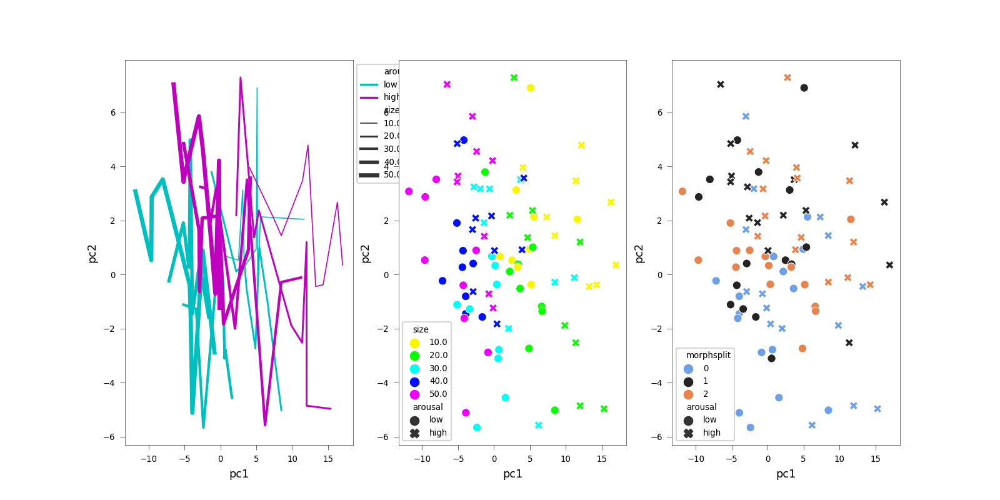

<AxesSubplot:xlabel='pc1', ylabel='pc2'>

In [1011]:

fig, axn = pl.subplots(1,3, figsize=(10,5))


xdf = pcaX_to_df(X_embedded, y_sz, y_mp, arousal='low')
xdf2 = pcaX_to_df(X_embedded2, y_sz_2, y_mp_2, arousal='high')

d_ = pd.concat([xdf, xdf2], axis=0)

d_['morphsplit'] = [msplit[m] for m in d_['morphlevel']]

# Plot the projected points and show the evaluation score
ax=axn[0]
colorby='morphlevel'
sns.lineplot(x='pc1', y='pc2', size='size', hue='arousal', palette=arousal_colors, data=d_,
             ax=ax, markers=False)

ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

ax=axn[1]
# colorby='size'
# sns.lineplot(x='pc1', y='pc2', style='arousal', hue='arousal', palette='Reds', data=d_[d_.arousal=='high'], ax=ax, markers=True)
# sns.lineplot(x='pc1', y='pc2', style='arousal', hue=colorby, palette='Blues', data=d_[d_.arousal=='low'], ax=ax, markers=True)



# Plot the projected points and show the evaluation score
# ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=y_sz, s=30, palette=size_colors, marker='o', facecolor='none')
# ax.scatter(X_embedded2[:, 0], X_embedded2[:, 1], c=y_sz_2, s=30, palette=size_colors, marker='x')
sns.scatterplot(x='pc1', y='pc2', hue='size', palette=size_colors, data=d_, ax=ax,
                style='arousal')
# sns.scatterplot(x='pc1', y='pc2', hue='size', 
#                 markers='.', palette=size_colors, data=d_[d_.arousal=='low'], ax=ax)

ax=axn[2]
# Plot the projected points and show the evaluation score
# ax.scatter(X_embedded[:, 0], X_embedded[:, 1], c=y_mp, s=30, cmap='RdBu', marker='o', facecolor='none')
# ax.scatter(X_embedded2[:, 0], X_embedded2[:, 1], c=y_mp_2, s=30, cmap='RdBu', marker='x')
# colorby='morphlevel'
# sns.lineplot(x='pc1', y='pc2', size=colorby, hue='arousal', palette=arousal_colors, data=d_,
#              ax=ax, markers=False)

colorby='morphsplit'
sns.scatterplot(x='pc1', y='pc2', hue=colorby, palette=morph_colors, data=d_, ax=ax,
                style='arousal')
# sns.lineplot(x='pc1', y='pc2', hue=colorby, palette='RdBu', data=d_,
#              ax=ax, markers=True, style='arousal')
# sns.lineplot(x='pc1', y='pc2', hue=morphlevel, palette='Blues', data=d_[d_.arousal=='low'],
#              ax=ax, markers=False)



In [1013]:
mlevels = np.unique(y_mp)

# morph_colors = sns.color_palette('cubehelix', n_colors=3)
morph_colors = sns.diverging_palette(250, 30, l=65, center="dark", as_cmap=True) #, n_colors=3)

morph_colors

In [1005]:
d_

,pc1,pc2,size,morphlevel,arousal
0,4.962696,0.938408,10.0,0,low
1,8.465406,-5.023615,20.0,0,low
2,1.582540,-4.557329,30.0,0,low
3,-3.942868,-1.457405,40.0,0,low
4,-0.837648,-2.883299,50.0,0,low
...,...,...,...,...,...
40,11.414028,3.469058,10.0,106,high
41,11.973842,1.200854,20.0,106,high
42,11.168001,-0.113822,30.0,106,high
43,3.891162,0.916123,40.0,106,high


In [912]:
xdf = pd.DataFrame(X_embedded, columns=['pc1', 'pc2'])
xdf['size'] = y_sz
xdf['morphlevel'] = y_mp


In [805]:
# Fit to data and predict using pipelined GNB and PCA.
unscaled_clf = make_pipeline(PCA(n_components=2), GaussianNB())
unscaled_clf.fit(X_train, y_train)
pred_test = unscaled_clf.predict(X_test)

# Fit to data and predict using pipelined scaling, GNB and PCA.
std_clf = make_pipeline(StandardScaler(), PCA(n_components=2), GaussianNB())
std_clf.fit(X_train, y_train)
pred_test_std = std_clf.predict(X_test)

# Show prediction accuracies in scaled and unscaled data.
print('\nPrediction accuracy for the normal test dataset with PCA')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, pred_test)))

print('\nPrediction accuracy for the standardized test dataset with PCA')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, pred_test_std)))

# Extract PCA from pipeline
pca = unscaled_clf.named_steps['pca']
pca_std = std_clf.named_steps['pca']

AttributeError: 'PCA' object has no attribute 'predict'

In [794]:
# Extract PCA from pipeline
pca = unscaled_clf.named_steps['pca']
pca_std = std_clf.named_steps['pca']

# Show first principal components
print('\nPC 1 without scaling:\n', pca.components_[0])
print('\nPC 1 with scaling:\n', pca_std.components_[0])

# Use PCA without and with scale on X_train data for visualization.
X_train_transformed = pca.transform(X_train)
scaler = std_clf.named_steps['standardscaler']
X_train_std_transformed = pca_std.transform(scaler.transform(X_train))



PC 1 without scaling:
 [-0.01549093  0.03651659  0.01291938 -0.01541354  0.01853355  0.0199671
  0.01112064  0.03765843  0.00733502  0.04536705  0.14559471  0.06365545
  0.046396    0.04306354 -0.0492112  -0.00432763  0.01894197  0.0294603
  0.08883144  0.01867835  0.10662683  0.07033243  0.31065728  0.13145472
 -0.17915911  0.04780095  0.1017706   0.0521243   0.18607479  0.04808299
  0.05087575 -0.49028518  0.05733013  0.2007533   0.05059697 -0.08361964
  0.03181736  0.34686319  0.01802454  0.08723977  0.00909108  0.04098633
  0.0669527   0.10277767  0.02677867  0.01921982  0.01304431  0.10054491
 -0.01122459  0.08782823  0.06175246  0.08528254  0.07557935  0.075521
  0.38303059  0.05129032 -0.02317073 -0.01241084 -0.01261847  0.09039398
  0.17660133 -0.01600985  0.04889304  0.03894064  0.0713554   0.00873454
 -0.0045906   0.04962937  0.13169018  0.04894996  0.0320486  -0.0245954
  0.0115367   0.05074275  0.02342326  0.02984495 -0.05675298 -0.11616674
  0.05031947 -0.00061875  0.0268

In [795]:
y_train_sz = [sdf['size'][c] for c in y_train]
y_train_mp = [sdf['morphlevel'][c] for c in y_train]


In [803]:
sizes = sorted(sdf['size'].unique())
size_colors=sns.color_palette('hsv', n_colors=len(sizes))


<IPython.core.display.Javascript object>


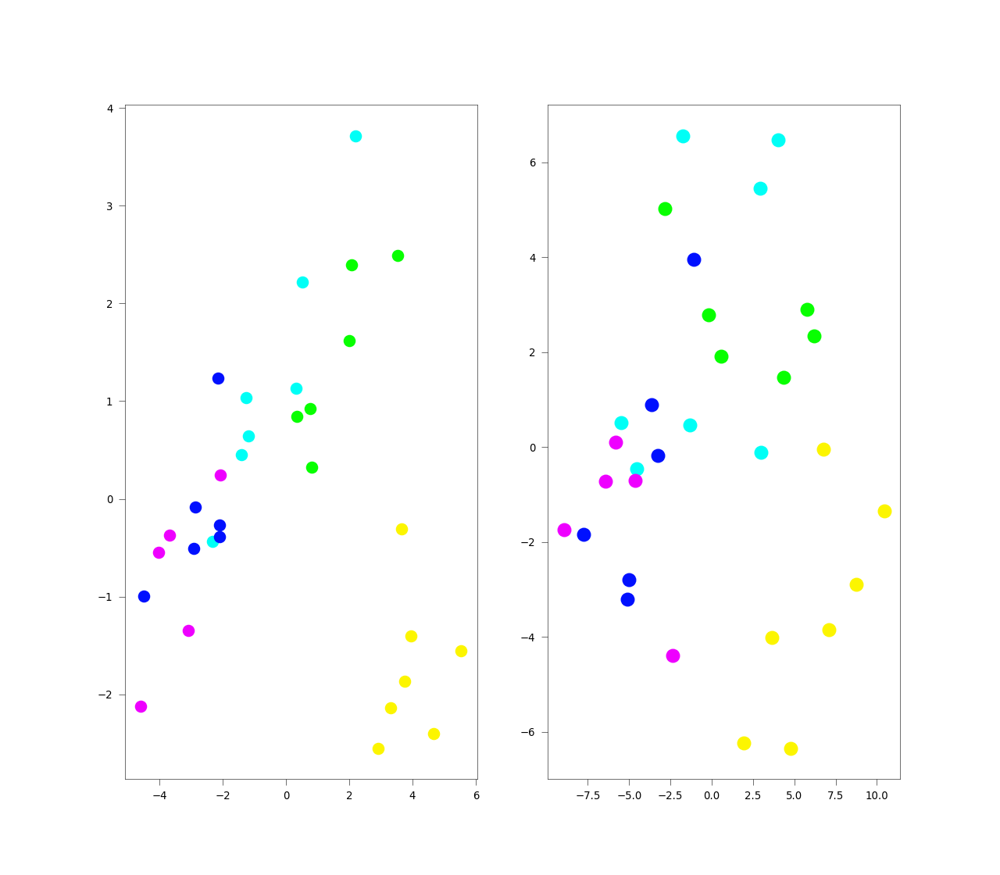

In [804]:

# visualize standardized vs. untouched dataset with PCA performed
fig, (ax1, ax2) = pl.subplots(ncols=2, figsize=(8,7))


for sz, col in zip(sizes, size_colors):
    ax1.scatter(X_train_transformed[y_train_sz == sz, 0],
                X_train_transformed[y_train_sz == sz, 1],
                color=col,
                label='class %s' % sz,
                alpha=1)
    

for sz, col in zip(sizes, size_colors):
    ax2.scatter(X_train_std_transformed[y_train_sz == sz, 0],
                X_train_std_transformed[y_train_sz == sz, 1],
                color=col, s=50,
                label='class %s' % sz,
                alpha=1)

NameError: name 'X' is not defined

In [683]:
test0 = xd.groupby(['arousal', 'true_labels']).apply(calculate_indices_for_neuraldf, sdf, offset=False).reset_index()
test0.shape     

(86, 6)

In [638]:
ndf['arousal'] = None
ndf['true_labels'] = None

xd = ndf[ndf['trial'].isin(ctrials['trial'].values)].copy()
xd['arousal'] = arous_
xd['true_labels']= shuff_
xd.shape

(48074, 8)

In [639]:
xd['arousal'].unique()

array(['high'], dtype=object)

In [664]:
test = [calculate_indices_for_neuraldf(xd[xd['trial'].isin(g['trial'])], sdf, offset=False, iternum=i) \
        for i, g in ctrials.groupby(['iteration'])]


In [681]:
tmp = pd.concat(test, axis=0).reset_index() # reset_inde() to get cell in columna

meani = tmp.groupby(['cell']).mean().reset_index()


In [682]:
meani

,cell,size_tol,morph_ix,sparseness,iteration
0,4,0.735633,0.234648,0.014449,49.5
1,5,0.697541,0.213502,0.025511,49.5
2,6,0.785683,0.203893,0.014092,49.5
3,11,0.739811,0.202934,0.017245,49.5
4,12,0.769364,0.230053,0.017834,49.5
...,...,...,...,...,...
81,364,0.694755,0.288670,0.039289,49.5
82,375,0.780684,0.259748,0.020778,49.5
83,380,0.778408,0.184533,0.014108,49.5
84,383,0.794192,0.177054,0.013020,49.5


<IPython.core.display.Javascript object>


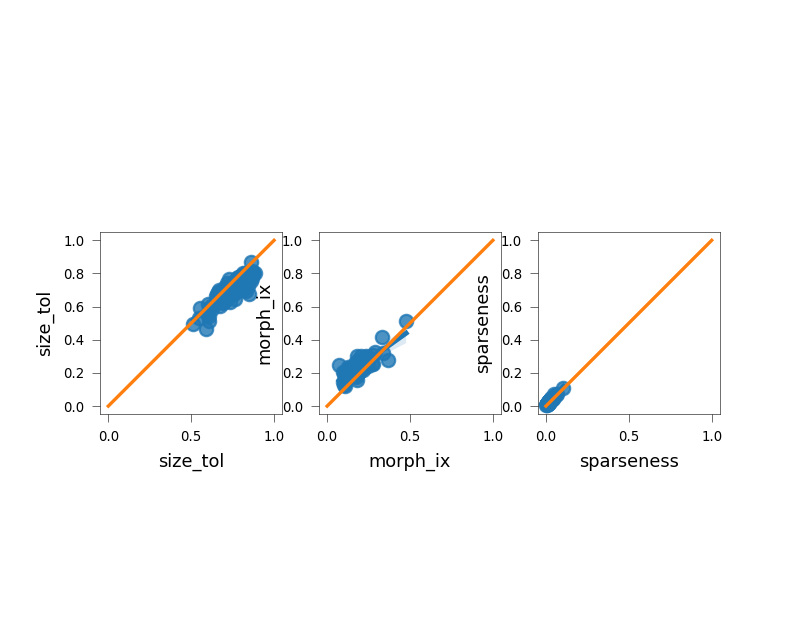

/n/coxfs01/2p-pipeline/envs/behavior3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/n/coxfs01/2p-pipeline/envs/behavior3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/n/coxfs01/2p-pipeline/envs/behavior3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an 

In [694]:
pars=['size_tol', 'morph_ix', 'sparseness']

t0 = test0.sort_values(by='cell')
t1 = meani.sort_values(by='cell')

fig, axn = pl.subplots(1,3)
for ax, par in zip(axn.flat, pars):
    
    sns.regplot(t0[par], t1[par], ax=ax)
    ax.set_aspect('equal')
    
    ax.plot([0., 1], [0., 1])

In [ ]:
tmp = xd.groupby(['arousal', 'true_labels']).apply(calculate_indices_for_neuraldf, sdf, offset=False).reset_index()


In [ ]:

ndf = nd[(nd['cell'].isin(curr_rois))].copy()

ndf['arousal'] = None
ndf['true_labels'] = None
d_=[]
for (arous_, shuff_), ctrials in in_trials.groupby(['arousal', 'true_labels']):
    xd = ndf[ndf['trial'].isin(ctrials['trial'].values)].copy()
    xd['arousal'] = arous_
    xd['true_labels']= shuff_
    
    #x0 = p3.unstacked_neuraldf_to_stacked(xd, id_vars=['config', 'trial', 'arousal', 'true_labels'] )
    tmp = xd.groupby(['arousal', 'true_labels']).apply(calculate_indices_for_neuraldf, sdf).reset_index()
    d_.append(tmp)

tmpdf = pd.concat(d_, axis=0)


<IPython.core.display.Javascript object>


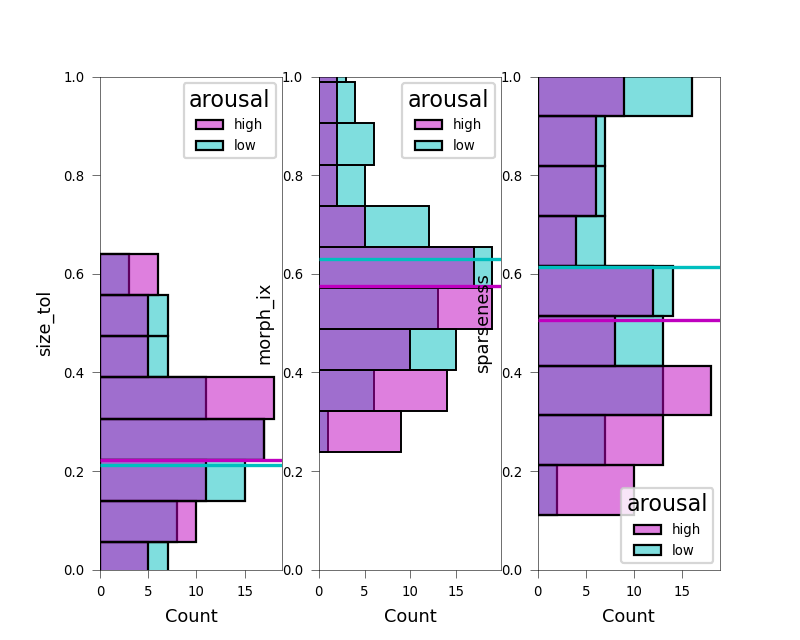

In [485]:
fig, axn = pl.subplots(1,3)
for ax, par in zip(axn.flat, ['size_tol', 'morph_ix', 'sparseness']):

    sns.histplot(data=tmpdf[tmpdf.true_labels], hue='arousal', y=par, ax=ax, 
                palette=arousal_colors)
    ax.set_ylim([0, 1])
    means_ = tmpdf[tmpdf.true_labels].groupby('arousal').mean()

    
    ax.axhline(y=means_.loc['high'][par], color=arousal_colors['high'])
    ax.axhline(y=means_.loc['low'][par], color=arousal_colors['low'])

<IPython.core.display.Javascript object>


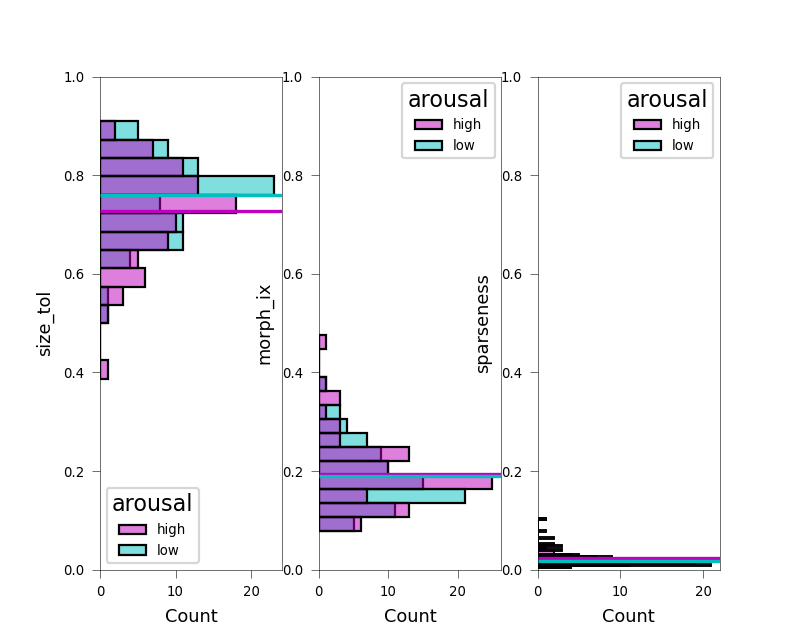

In [360]:
fig, axn = pl.subplots(1,3)
for ax, par in zip(axn.flat, ['size_tol', 'morph_ix', 'sparseness']):
    sns.histplot(data=tmpdf[tmpdf.true_labels], hue='arousal', y=par, ax=ax, 
                palette=arousal_colors)
    ax.set_ylim([0, 1])
    means_ = tmpdf[tmpdf.true_labels].groupby('arousal').mean()

    
    ax.axhline(y=means_.loc['high'][par], color=arousal_colors['high'])
    ax.axhline(y=means_.loc['low'][par], color=arousal_colors['low'])